## Setup, Loading Data and CDFs

In [1]:
DATA_NAME = 'agriVision-full' 
TRANSFORM = 'gabor'
CHANNEL = 'red'
PARAM_CSV = "gabor_new.csv"

In [2]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
red_gabor_full_agriVision.ipynb


In [3]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = False
SKIP_OPTIMIZE_STEP = False
CWD

'd:\\new research\\hierarchical-bayesian-model-validation\\results\\case-studies\\agriVision\\full\\gabor\\red'

In [4]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [5]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [6]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 262144000,
 1: 262144000,
 2: 262144000,
 3: 262144000,
 4: 262144000,
 5: 262144000,
 6: 262144000,
 7: 262144000,
 8: 262144000,
 9: 262144000,
 10: 262144000,
 11: 262144000,
 12: 262144000,
 13: 262144000,
 14: 262144000,
 15: 262144000,
 16: 262144000,
 17: 262144000,
 18: 262144000,
 19: 262144000,
 20: 262144000,
 21: 262144000,
 22: 262144000,
 23: 262144000,
 24: 262144000,
 25: 262144000,
 26: 262144000,
 27: 262144000,
 28: 262144000,
 29: 262144000,
 30: 262144000,
 31: 262144000,
 32: 262144000,
 33: 262144000,
 34: 262144000,
 35: 262144000,
 36: 262144000,
 37: 262144000,
 38: 262144000,
 39: 262144000,
 40: 262144000,
 41: 262144000}

Running 12760 CDFs


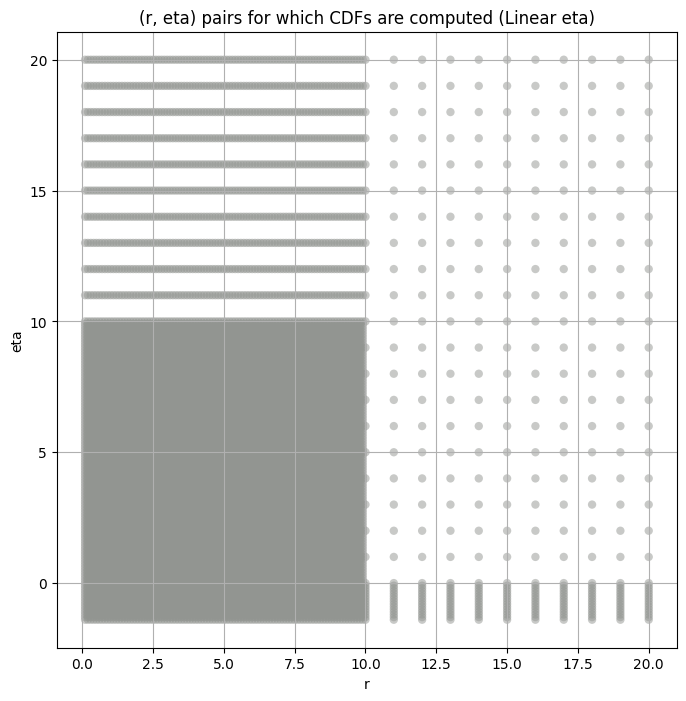

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [7]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [8]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [9]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,105.022090,27.378706,626.072630,753.90300,10.089722,772.35266,262144000.0,"(2.0, 0.5, 0.044)"
1,38.574230,14.073940,272.467000,1018.09595,6.095307,854.14886,262144000.0,"(2.0, 0.5, 0.065)"
2,30.087484,8.941023,174.511540,825.73830,5.479582,847.71796,262144000.0,"(2.0, 0.5, 0.096)"
3,24.735935,4.736554,124.400840,877.88950,8.951097,788.74320,262144000.0,"(2.0, 0.5, 0.141)"
4,7.208369,1.599787,39.273690,774.56410,9.087828,861.38160,262144000.0,"(2.0, 0.5, 0.208)"
5,1.065362,0.331705,7.509088,1051.99790,9.293052,820.31946,262144000.0,"(2.0, 0.5, 0.306)"
6,0.619021,0.209870,6.490139,1823.68690,10.255322,881.34436,262144000.0,"(2.0, 0.5, 0.45)"
7,114.915660,32.235943,1166.408400,2096.19920,7.799550,917.38210,262144000.0,"(2.0, 1.0, 0.044)"
8,62.611774,17.722000,471.684720,1030.81810,9.482702,829.54530,262144000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [10]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [11]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,105.022090,105.022087,49.099319,38.220131,30.302052
1,38.574230,38.574230,20.515024,17.732866,15.469657
2,30.087484,30.087484,13.151334,10.952781,9.683129
3,24.735935,24.735935,8.467772,6.272726,5.206313
4,7.208369,7.208369,2.792589,2.162448,1.809404
5,1.065362,1.065362,0.532510,0.457789,0.393021
6,0.619021,0.619021,0.317392,0.281801,0.245351
7,114.915660,114.915657,49.678226,42.150768,35.705582
8,62.611774,62.611774,31.262253,25.571604,20.639376


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.031226472514952475 105.02209


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.014069275461182328 49.09932


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.008473921264039855 38.22013


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.0026990619022554396 30.302052
Number of samples: 100000, Without approximation : 262144000.0


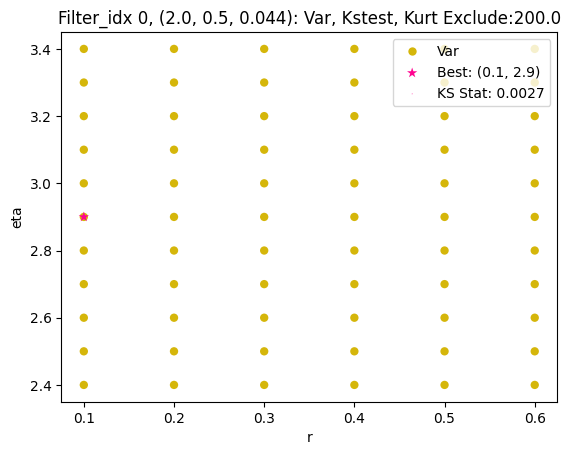

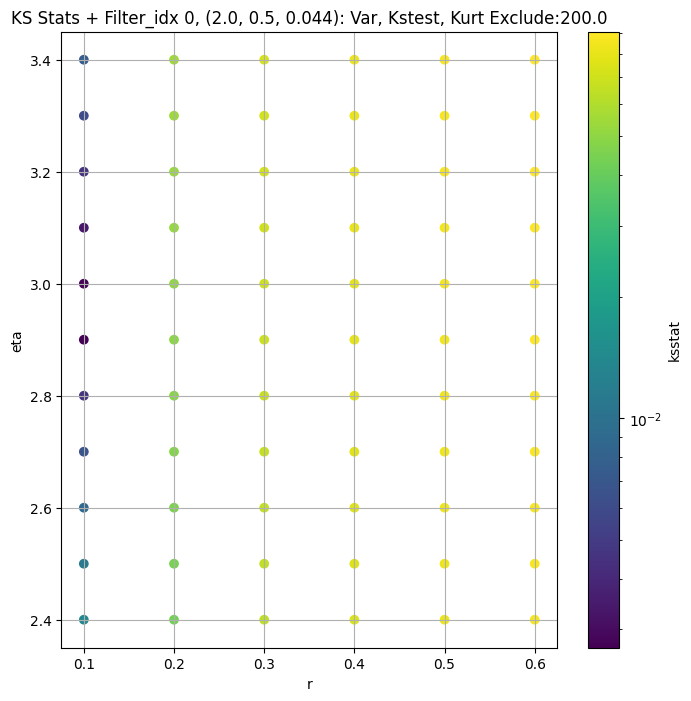

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.019550419104221985 38.57423


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.00511680211239407 20.515024


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.0015653847159696754 17.732866


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.0027332310276083627 15.469657
Number of samples: 100000, Without approximation : 262144000.0


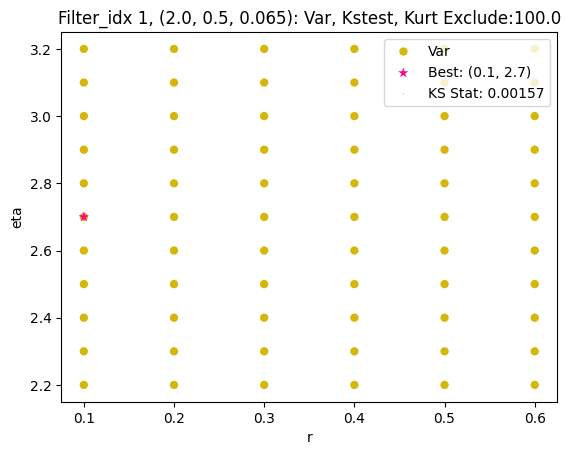

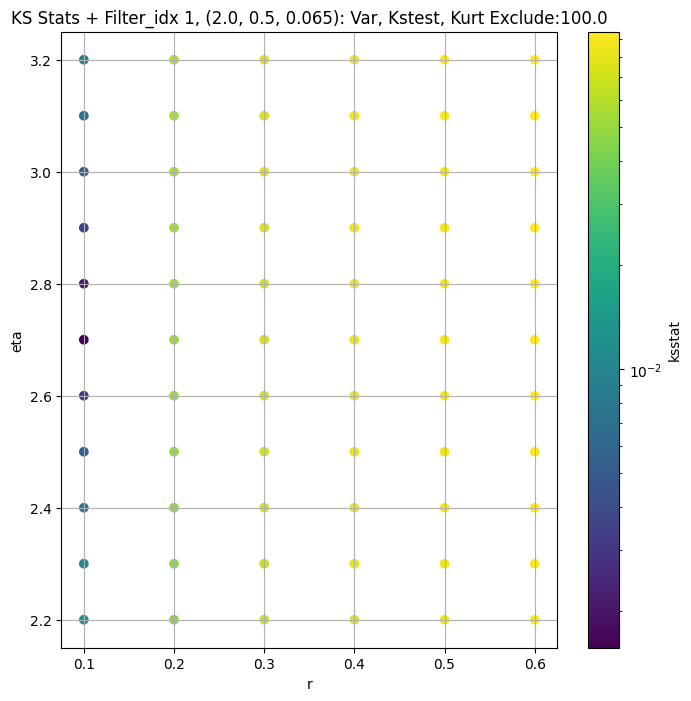

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.023697758422708604 30.087484


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.004109860663954565 13.151334


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.0018328198307472343 10.952781


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.002950006875049739 9.683129
Number of samples: 100000, Without approximation : 262144000.0


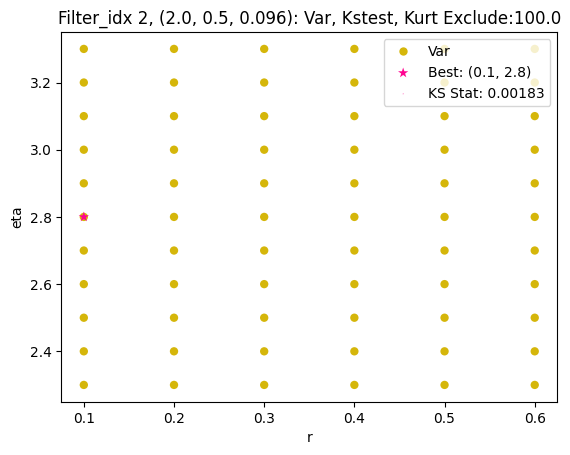

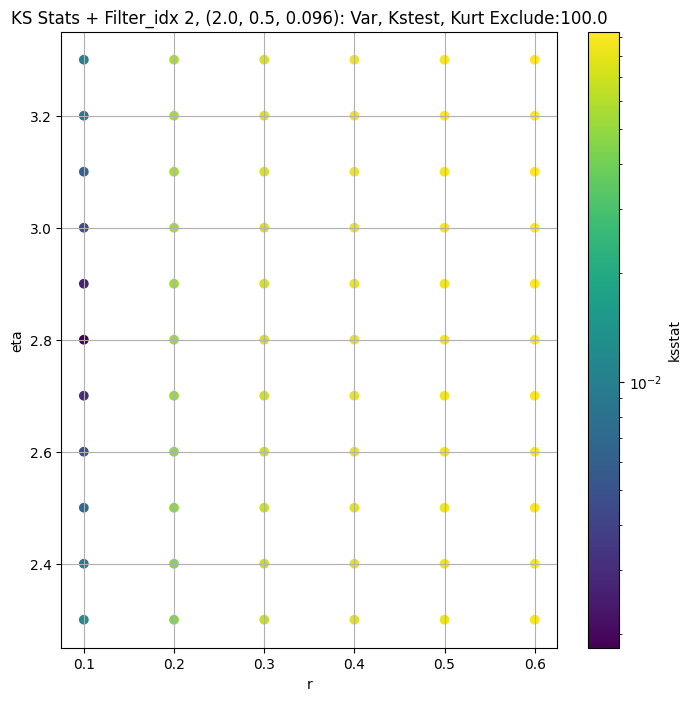

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.03377328339354135 24.735935


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.011903347358016639 8.467772


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.003782682681703897 6.2727256


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.0025982945549073433 5.206313
Number of samples: 100000, Without approximation : 262144000.0


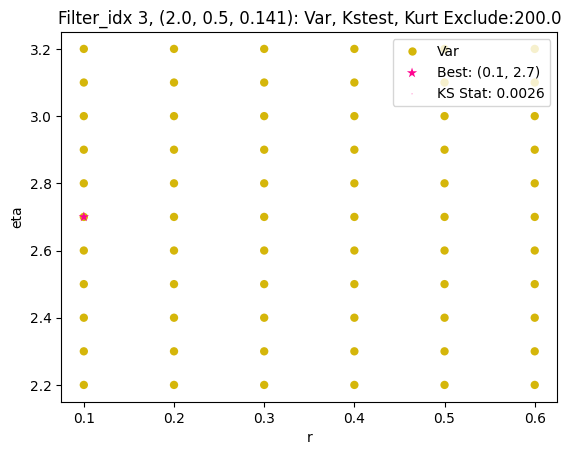

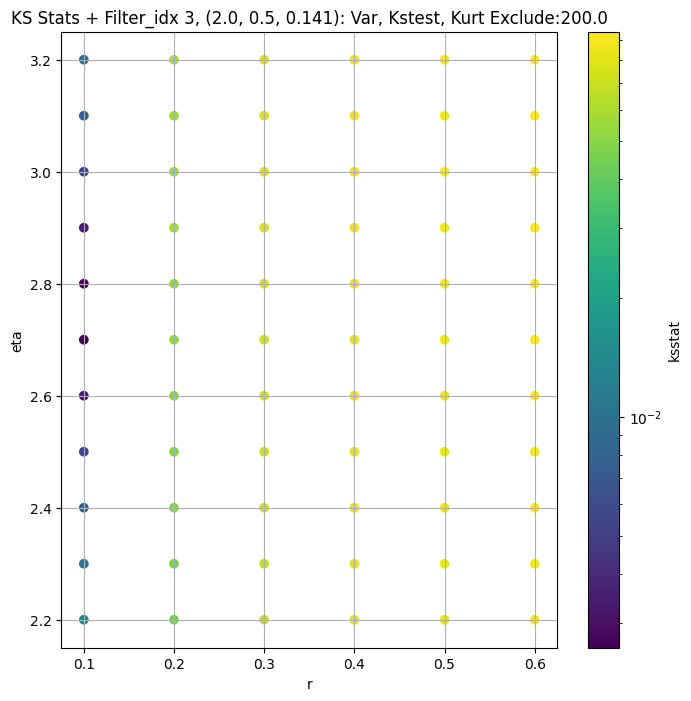

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.030344796627885362 7.208369


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.01106783837687772 2.7925894


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.006224018813016263 2.1624482


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.0037531313596047555 1.809404
Number of samples: 100000, Without approximation : 262144000.0


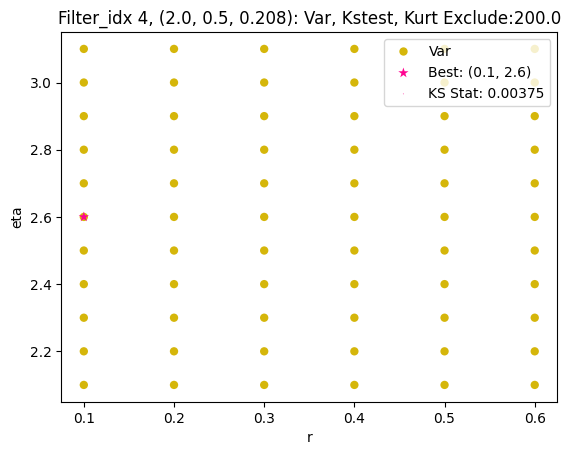

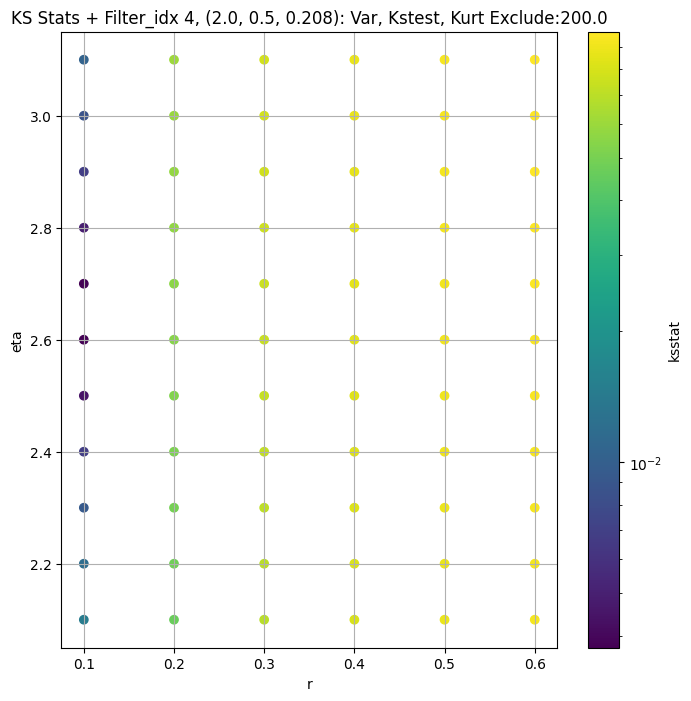

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.023153152099183116 1.0653625


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.009092399915525018 0.5325101


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.006030016568324484 0.45778918


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.003649134301571322 0.3930207
Number of samples: 100000, Without approximation : 262144000.0


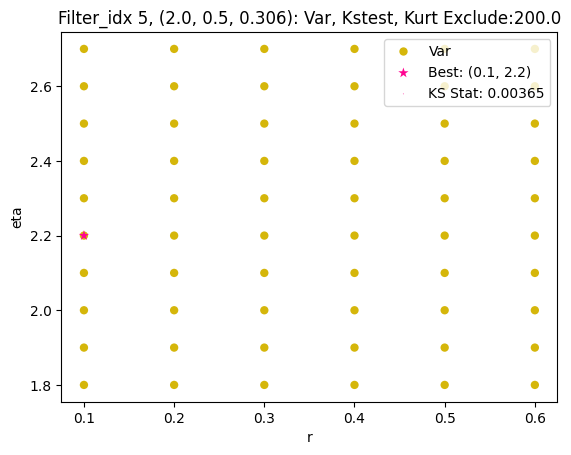

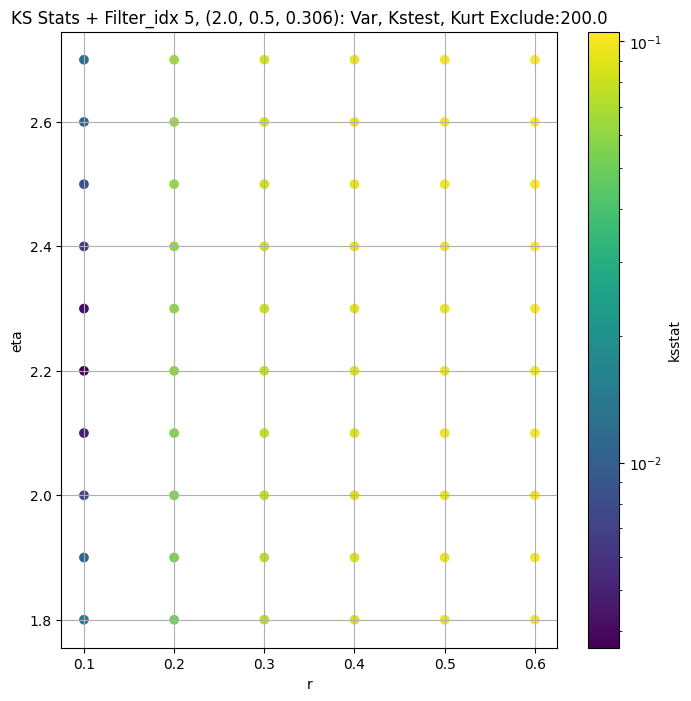

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.02135012504201822 0.619021


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.009061683356752614 0.31739166


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.005956242505925635 0.28180093


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.004580342608741919 0.24535078
Number of samples: 100000, Without approximation : 262144000.0


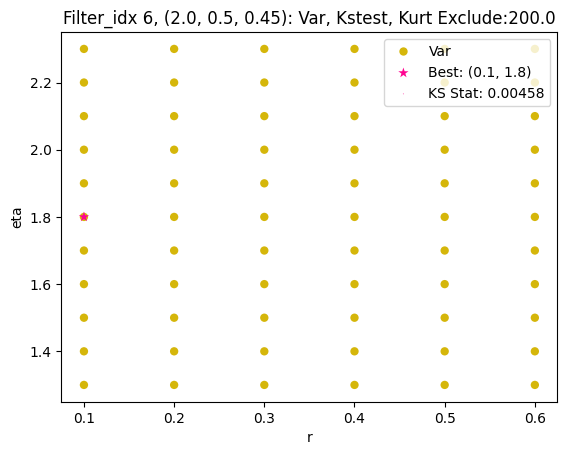

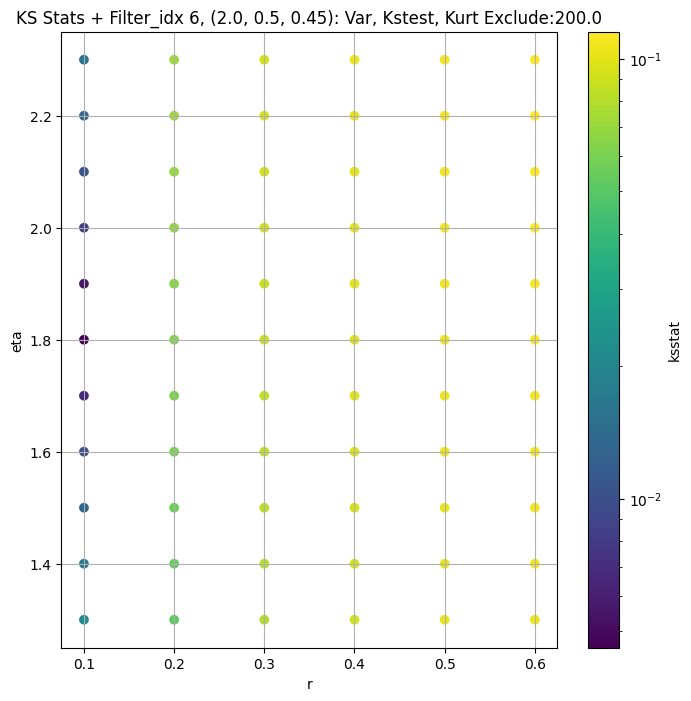

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.0278879985470164 114.91566


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.009381918585165128 49.678226


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.004638995283732239 42.15077


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.0028619512892254203 35.70558
Number of samples: 100000, Without approximation : 262144000.0


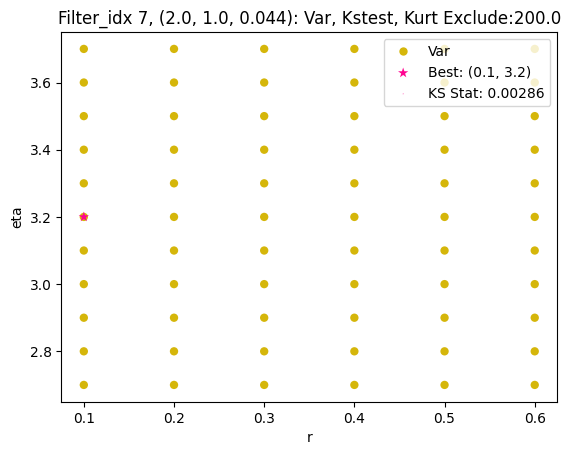

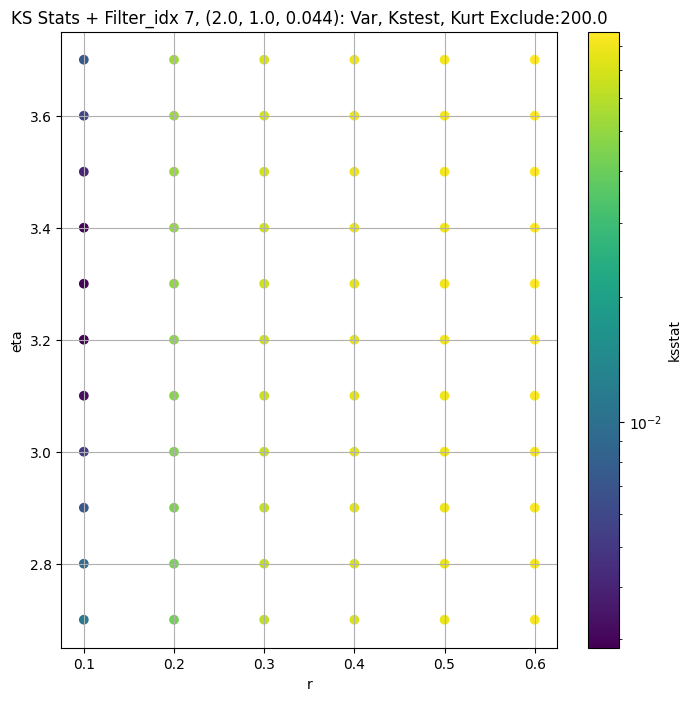

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.026617546772005785 62.611774


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.01075434093103772 31.262253


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.005812997998958236 25.571604


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.0025309154716277593 20.639376
Number of samples: 100000, Without approximation : 262144000.0


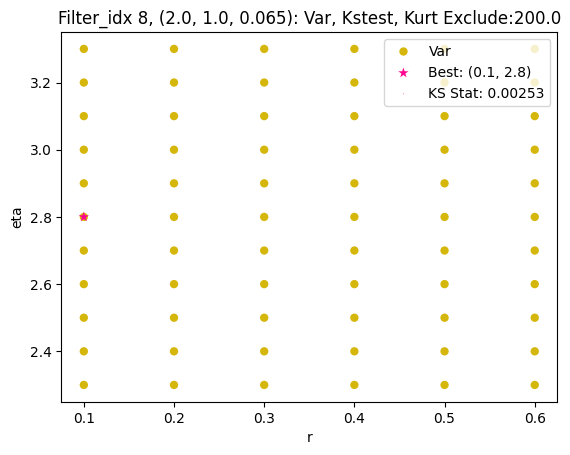

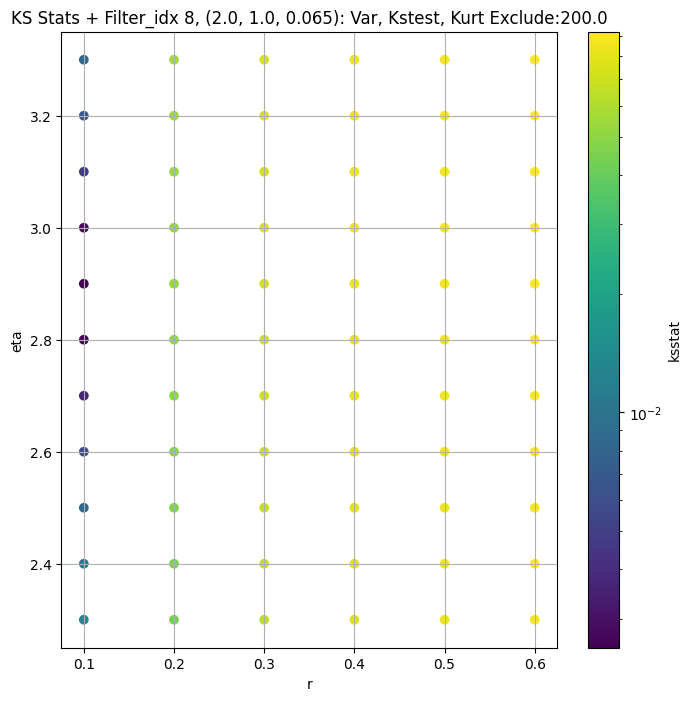

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.016514815533133775 22.525793


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.005386821700768207 14.469049


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.0024719224839302445 13.029206


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.0029674770323886435 11.456246
Number of samples: 100000, Without approximation : 262144000.0


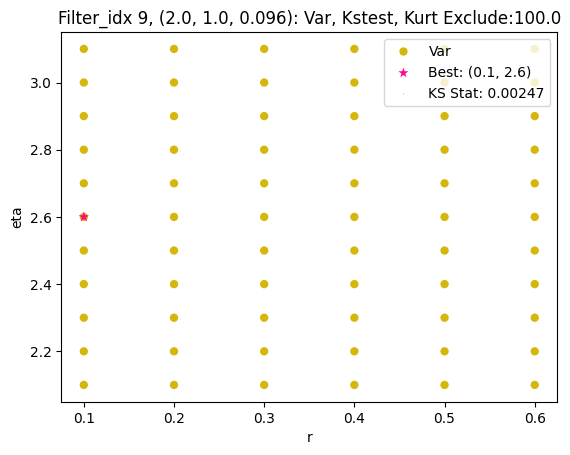

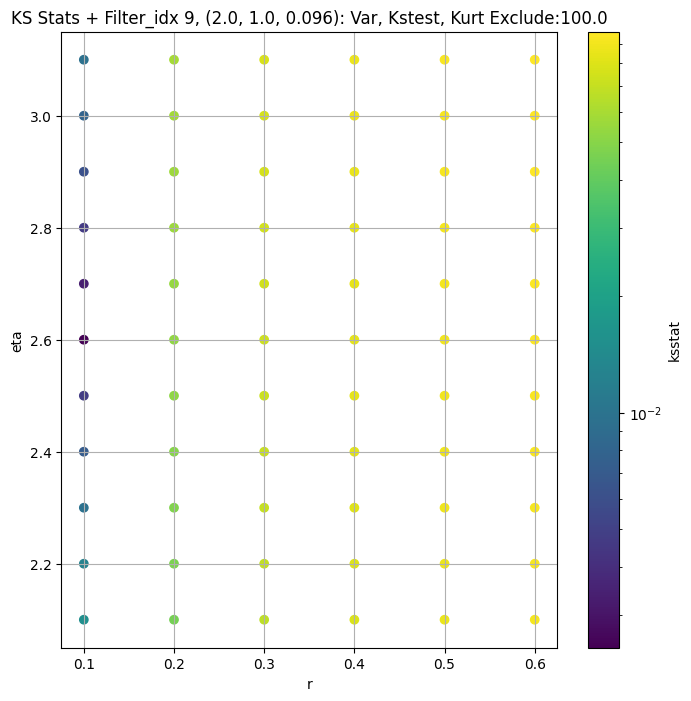

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.03302618359432202 34.97532


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.014309347740444456 13.043616


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.005115082651905689 9.144784


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.0024662311009110427 6.9792433
Number of samples: 100000, Without approximation : 262144000.0


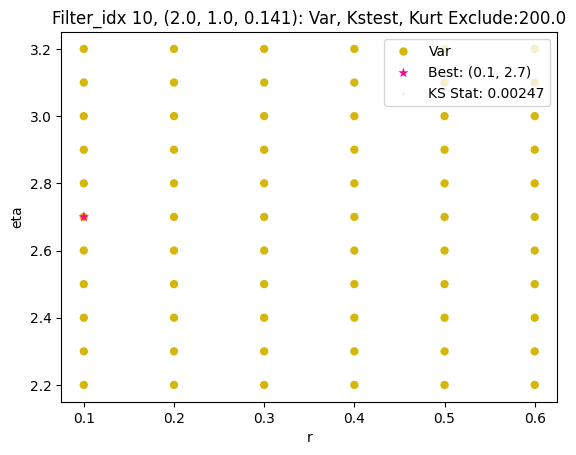

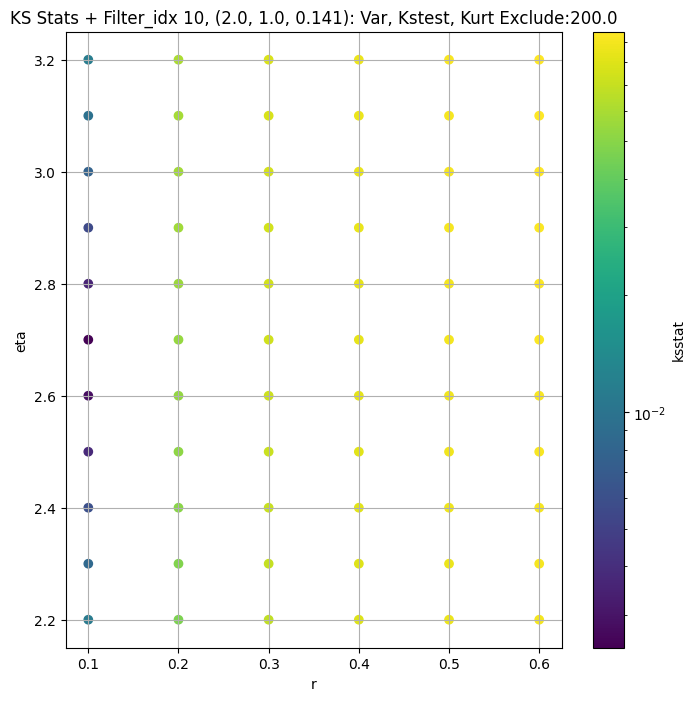

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.024679119189798593 9.606609


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.009142971268401912 4.572536


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.004555884950649874 3.623269


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.003496580368786438 3.0296507
Number of samples: 100000, Without approximation : 262144000.0


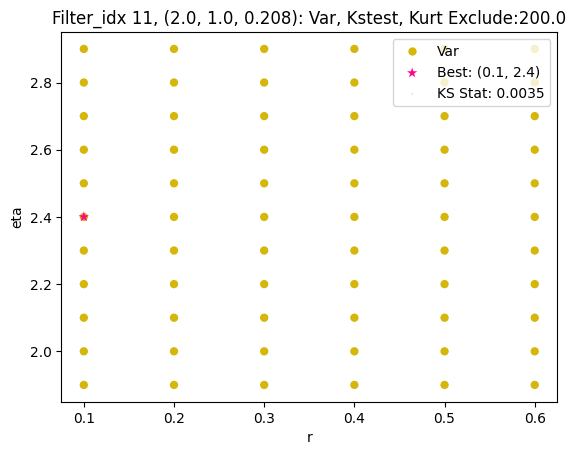

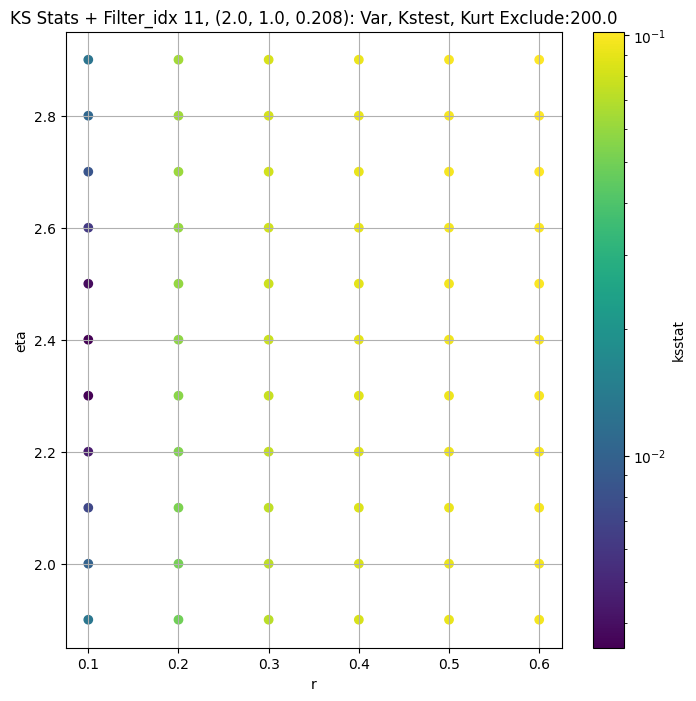

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.0290764844917953 3.2386072


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.014532134027501309 1.5622691


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.008238317203325463 1.220499


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.0028441432119177684 0.95698404
Number of samples: 100000, Without approximation : 262144000.0


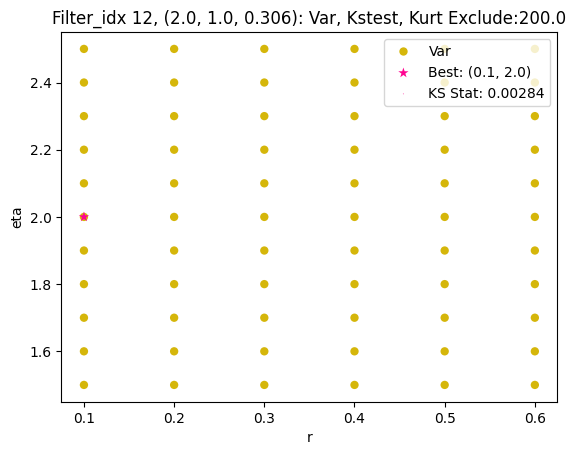

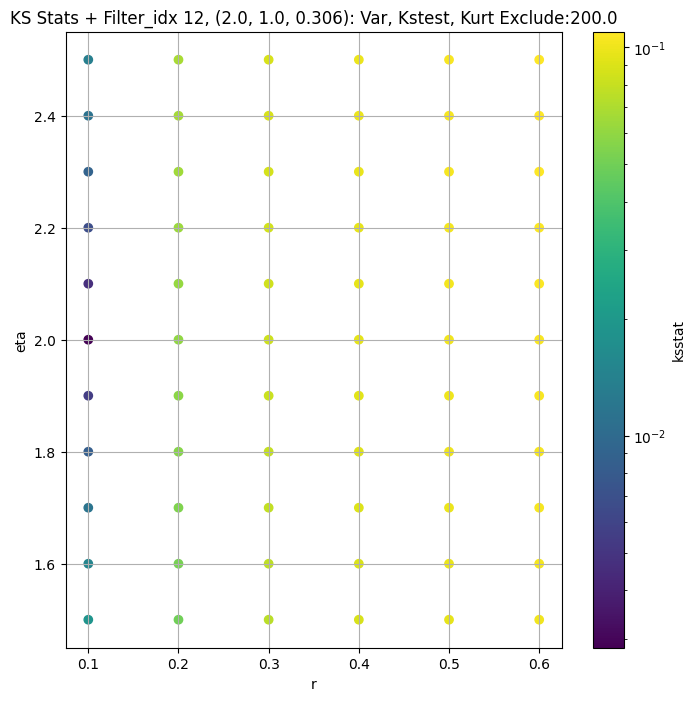

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.01970129134463794 0.6287056


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.007847604881196846 0.33229715


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.005344392107737628 0.2864933


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.004822960184290737 0.24573217
Number of samples: 100000, Without approximation : 262144000.0


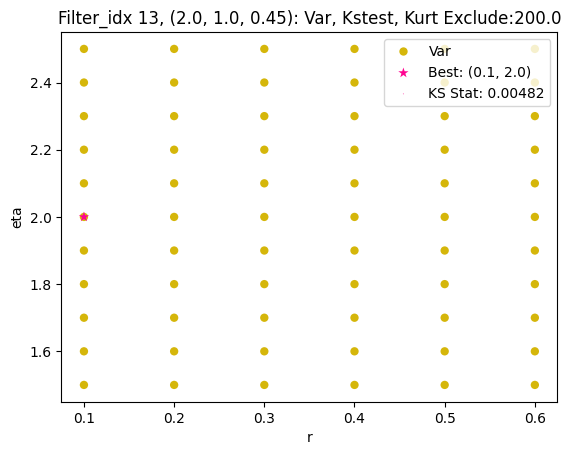

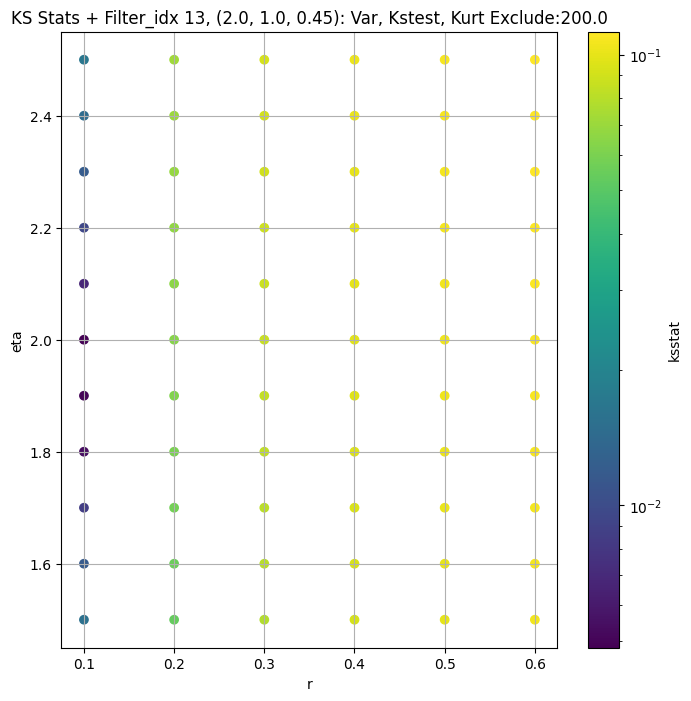

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.008256830955584604 36.486637


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.0014514892883913388 28.177057


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.0015877084328151693 26.038227


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.00302918516879464 23.603893
Number of samples: 100000, Without approximation : 262144000.0


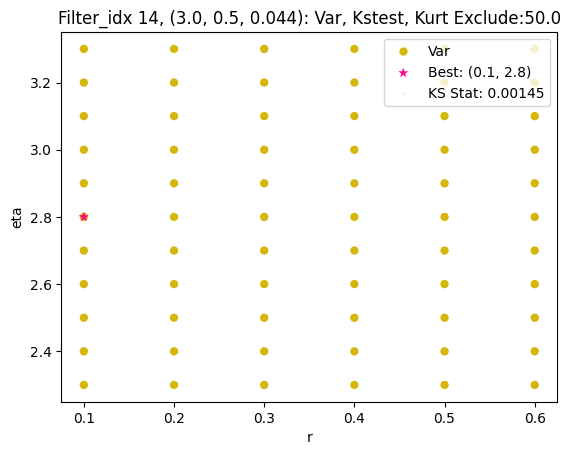

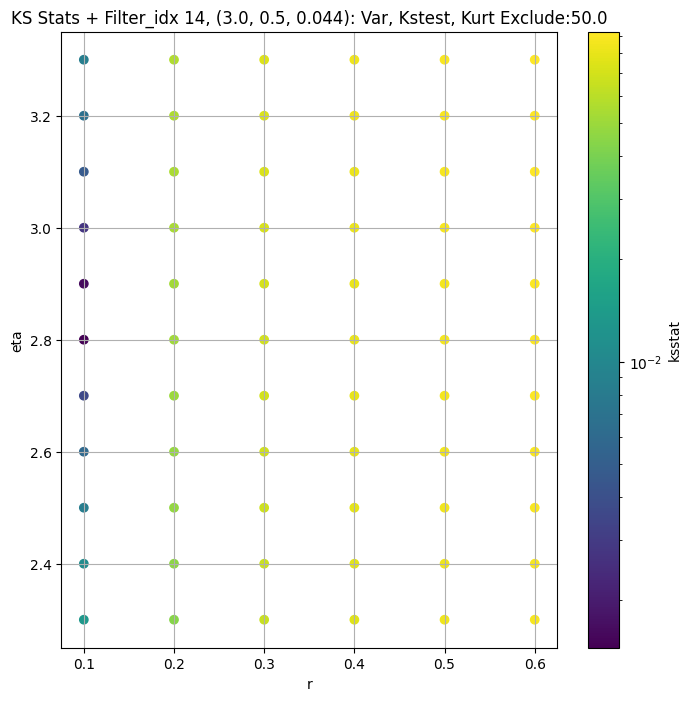

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.02156488895609987 39.038853


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.002597301811960759 17.57403


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.001938895750022429 15.786083


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.0028907928382588526 14.111277
Number of samples: 100000, Without approximation : 262144000.0


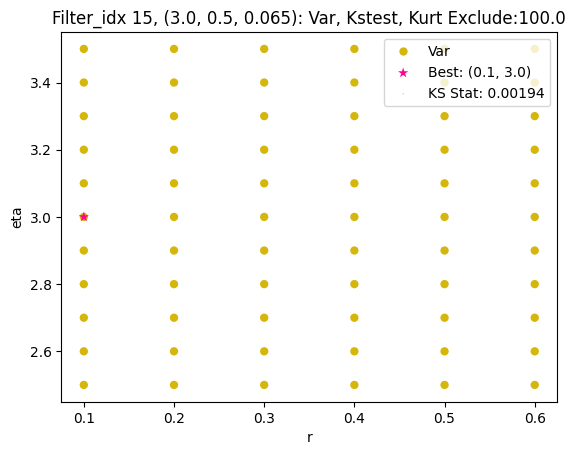

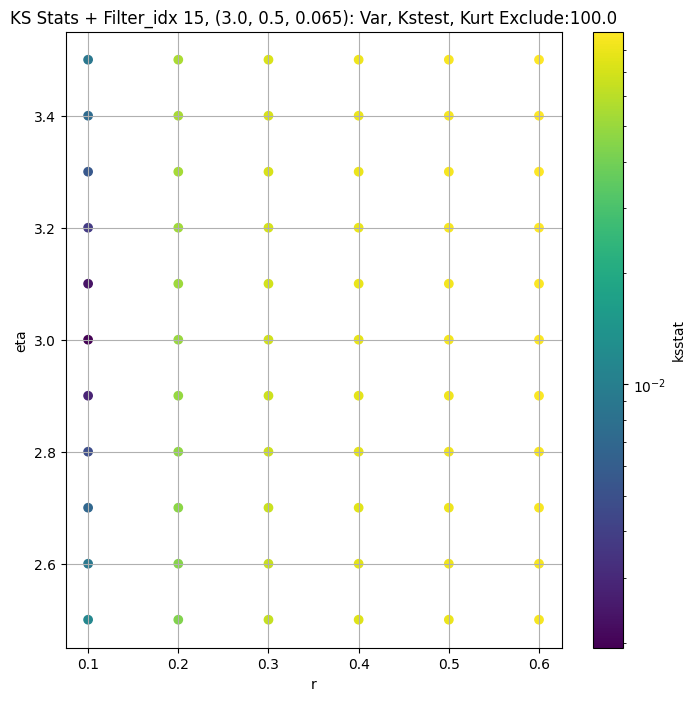

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.02994726691531313 48.493725


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.006060551036252915 16.019567


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.002478498190277373 13.513224


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.0026457600121589367 11.621897
Number of samples: 100000, Without approximation : 262144000.0


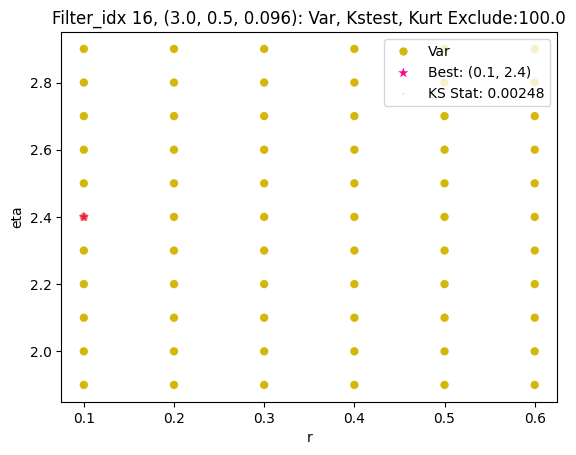

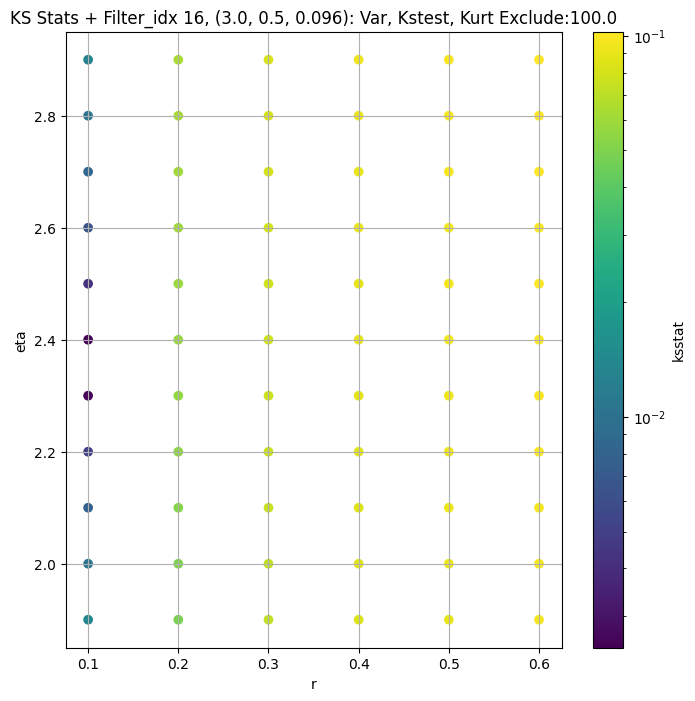

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.03032404237212013 21.717463


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.005693090076564378 6.9414563


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.0019047248672517947 5.7872305


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.0033700885660791213 5.05142
Number of samples: 100000, Without approximation : 262144000.0


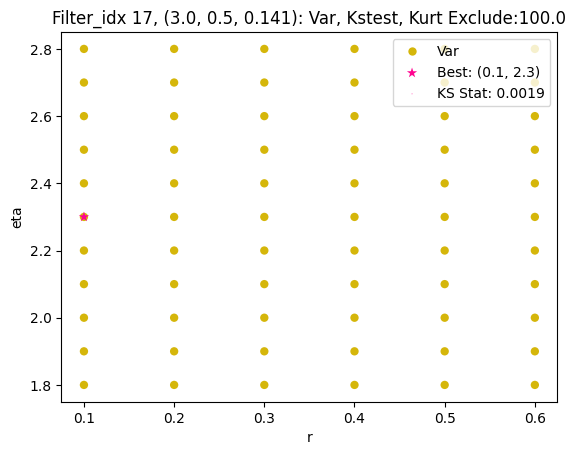

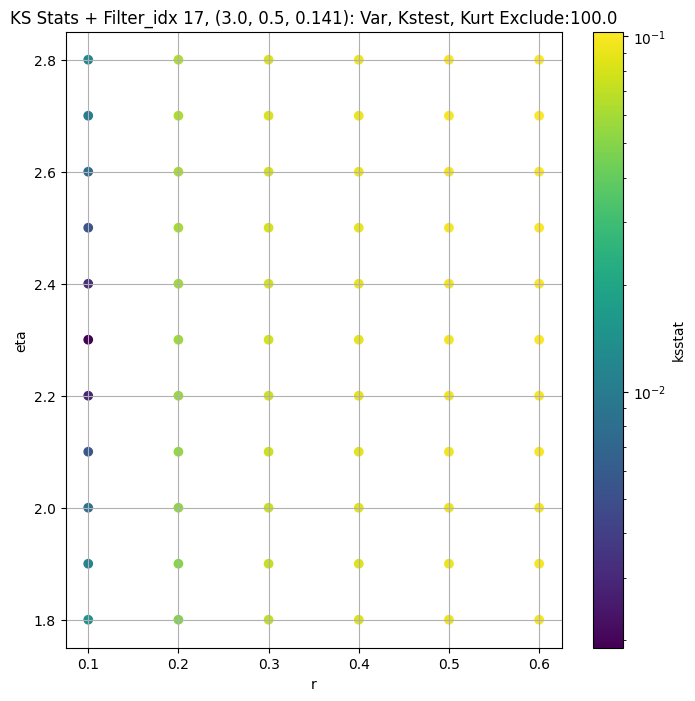

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.02198286365404234 4.027817


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.006283948256451066 1.9672694


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.004159525375075024 1.7501376


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.00414740578637407 1.5376682
Number of samples: 100000, Without approximation : 262144000.0


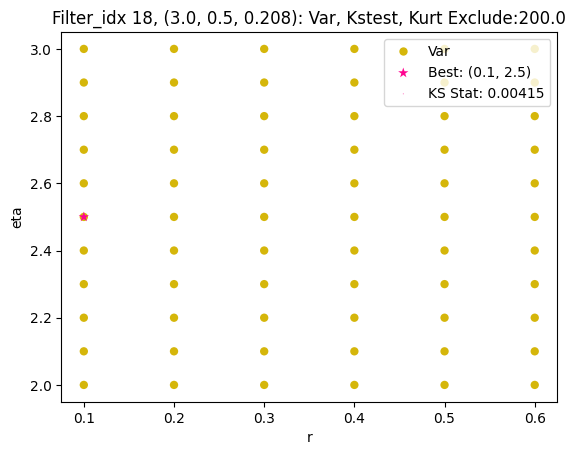

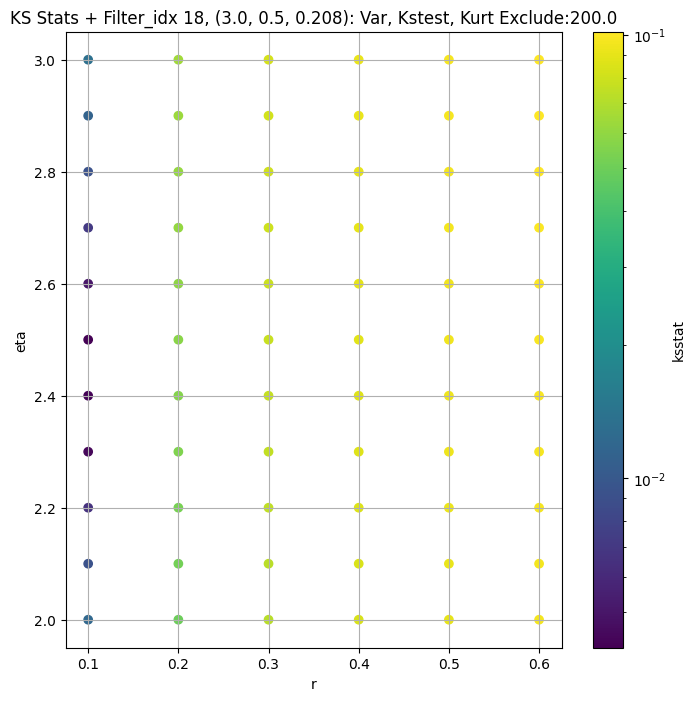

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.02871026973373325 1.076275


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.013037694203715477 0.49258777


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.009582079505685903 0.4149428


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.006181056819461017 0.34272835
Number of samples: 100000, Without approximation : 262144000.0


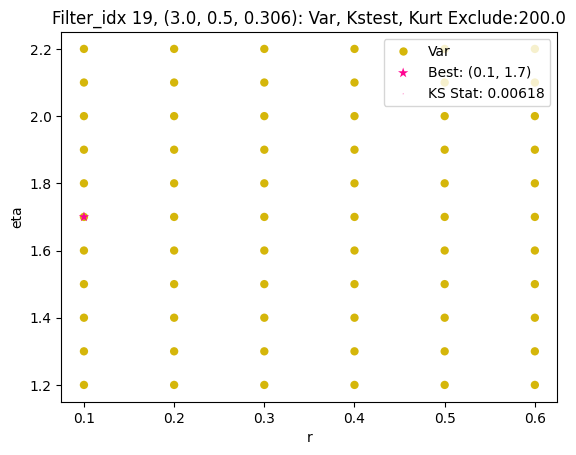

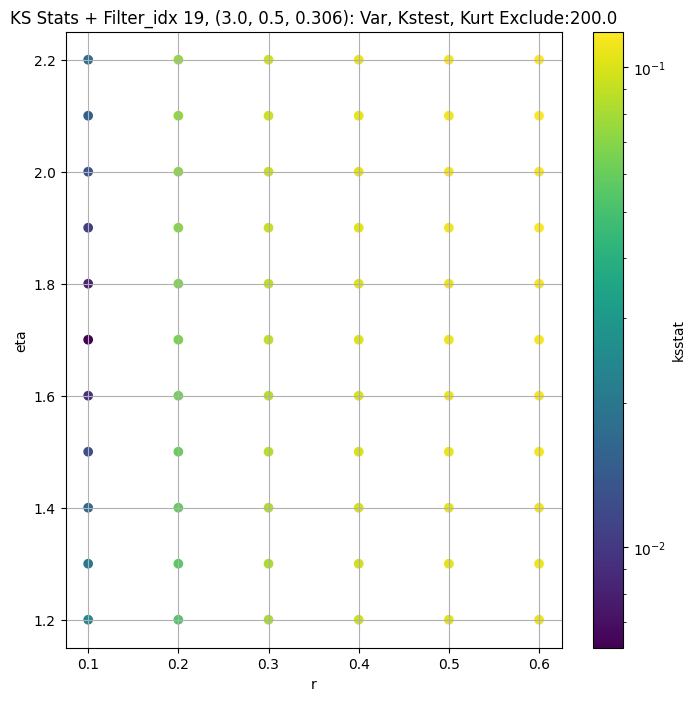

####
Filter_idx, 20: (3.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 0 0.031710775689050674 0.28135923


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 50 0.012863286954310188 0.104716614


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 100 0.010242385909482676 0.09032301


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 200 0.007951494465981146 0.077406354
Number of samples: 100000, Without approximation : 262144000.0


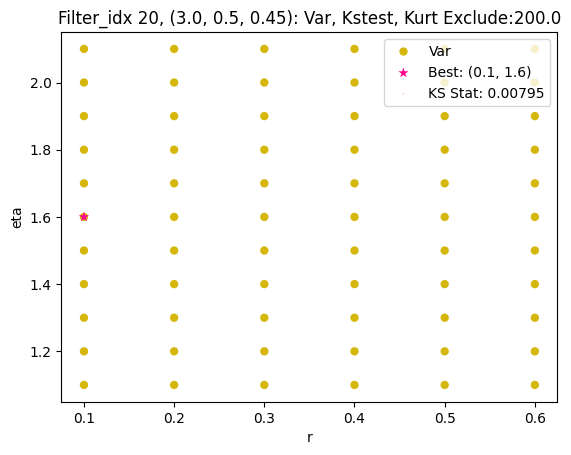

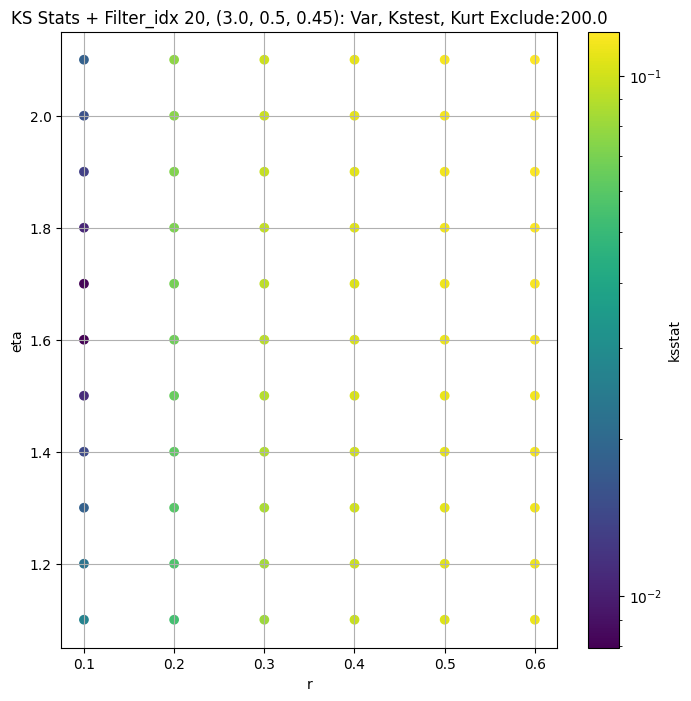

####
Filter_idx, 21: (3.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 0 0.026870350758322004 101.62851


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 50 0.011311279563257504 48.977257


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 100 0.0059626042556595316 40.1568


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 200 0.0027269195718757633 32.771423
Number of samples: 100000, Without approximation : 262144000.0


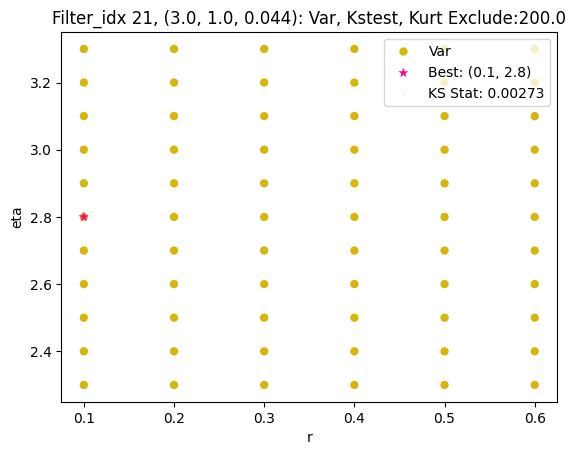

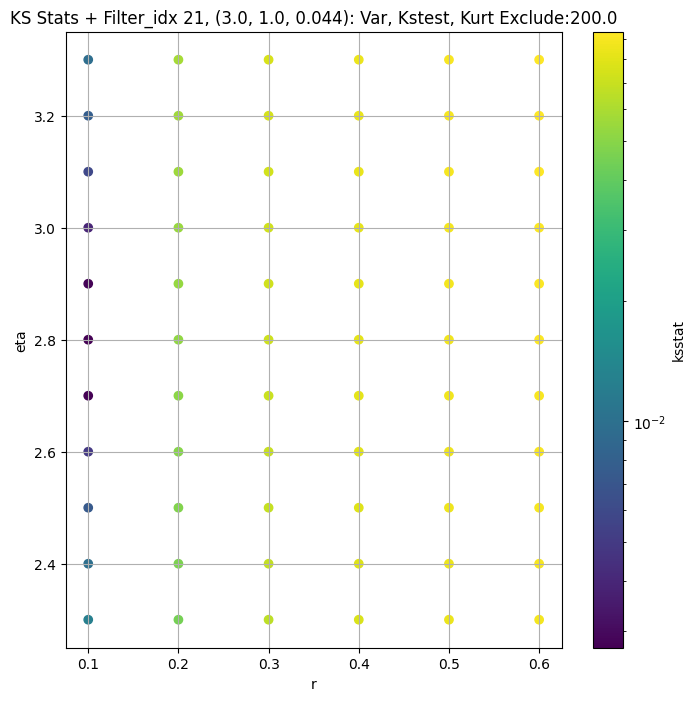

####
Filter_idx, 22: (3.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 0 0.018789270510840117 33.638905


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 50 0.0034398627378715574 17.974392


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 100 0.0014474828052921662 16.151272


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 200 0.0029622269307960445 14.413549
Number of samples: 100000, Without approximation : 262144000.0


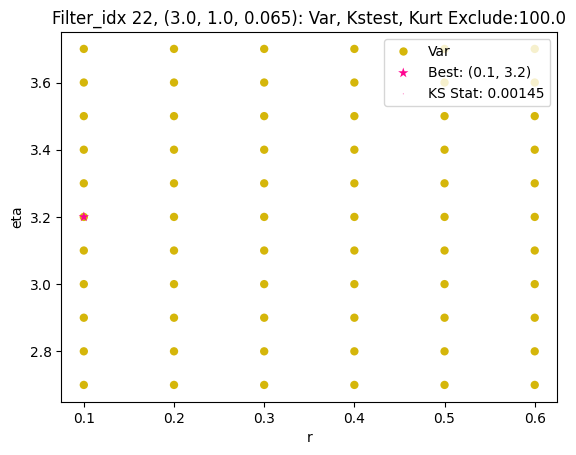

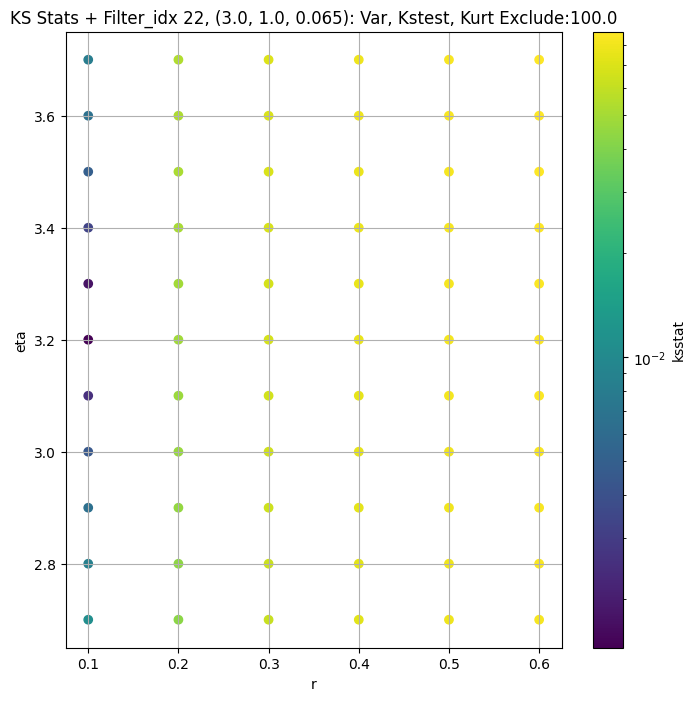

####
Filter_idx, 23: (3.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 0 0.03273979303850738 50.23436


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 50 0.003581071260322366 13.234172


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 100 0.001276117658426501 11.344837


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 200 0.002927028520228643 9.894793
Number of samples: 100000, Without approximation : 262144000.0


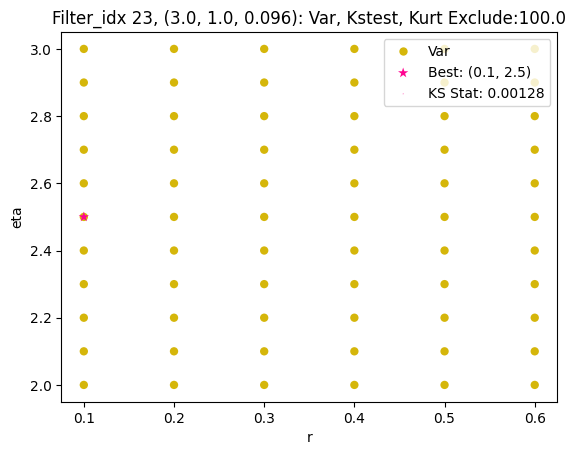

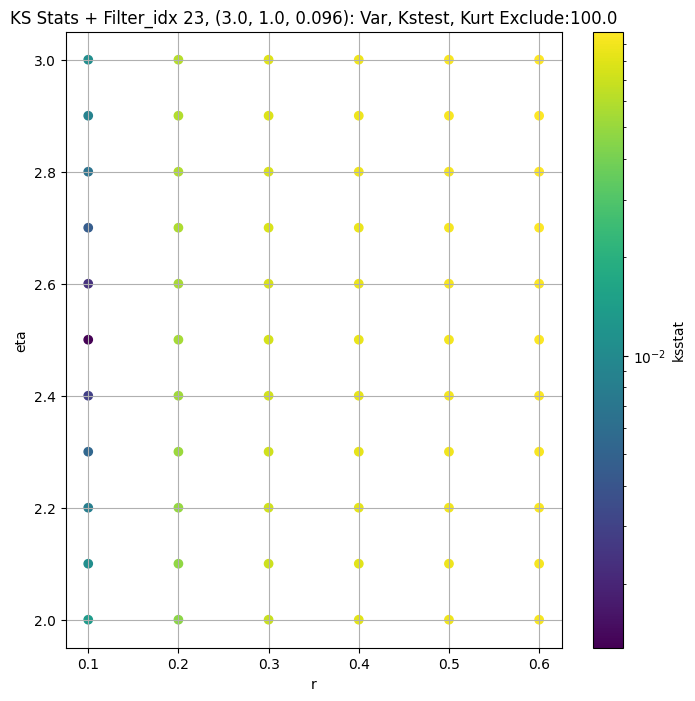

####
Filter_idx, 24: (3.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 0 0.007249432475683548 7.6293087


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 50 0.00382434509634777 6.516046


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 100 0.00232434256344205 6.057009


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 200 0.0037414296042900756 5.4521937
Number of samples: 100000, Without approximation : 262144000.0


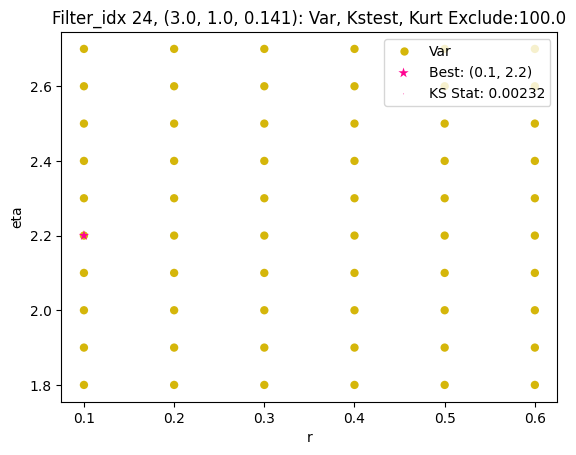

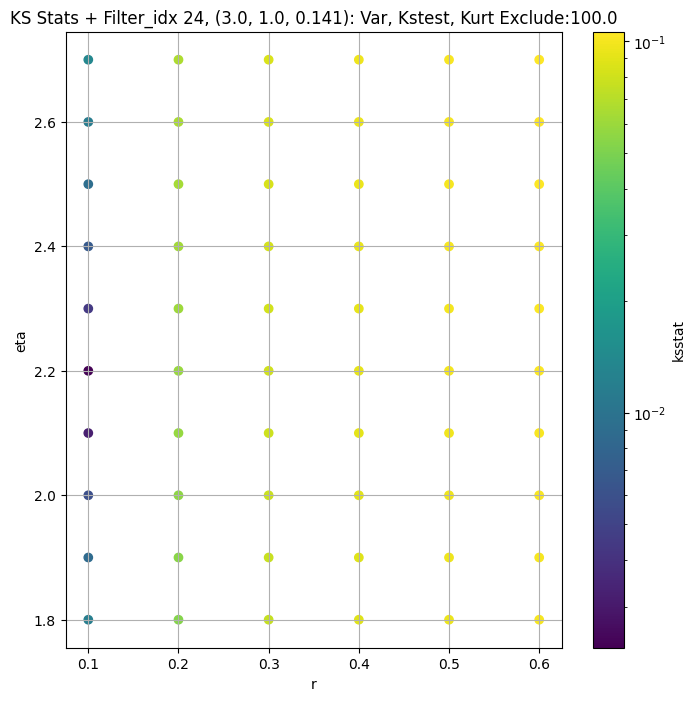

####
Filter_idx, 25: (3.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 0 0.009398522706935641 2.8048594


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 50 0.004793497330065399 2.1932862


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 100 0.003314586225298566 2.0294263


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 200 0.005135994736975902 1.8319983
Number of samples: 100000, Without approximation : 262144000.0


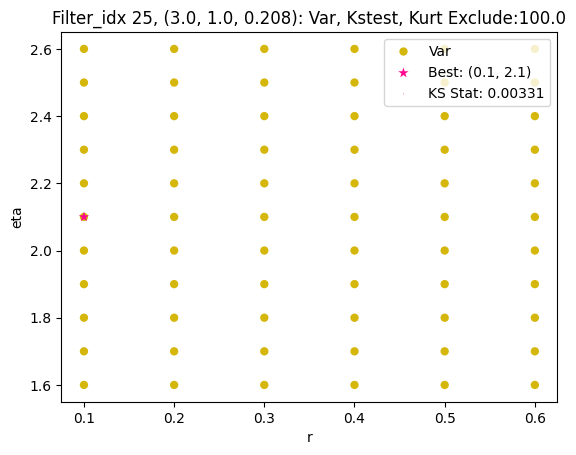

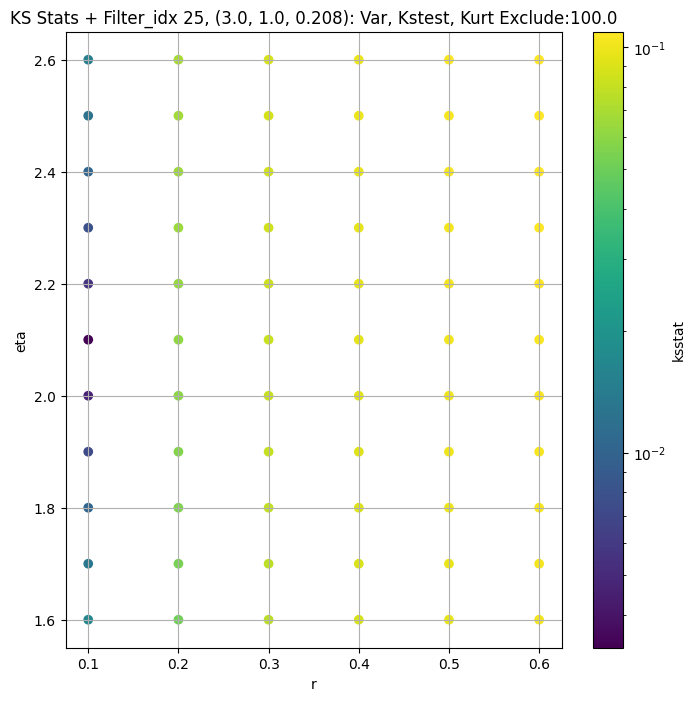

####
Filter_idx, 26: (3.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 0 0.026867257241984632 1.6920822


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 50 0.008382255722854781 0.65733826


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 100 0.004906292124475575 0.5368033


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 200 0.005421292822224255 0.45947406
Number of samples: 100000, Without approximation : 262144000.0


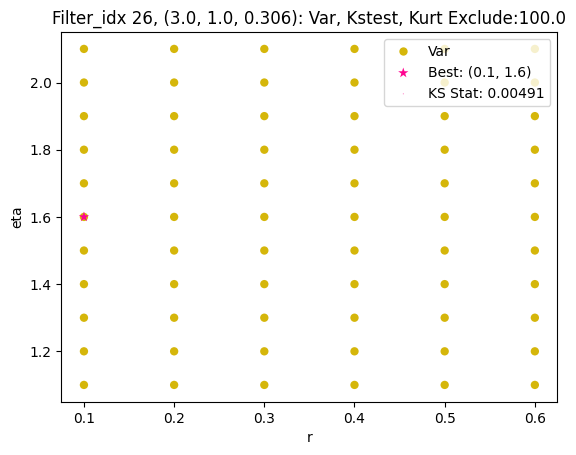

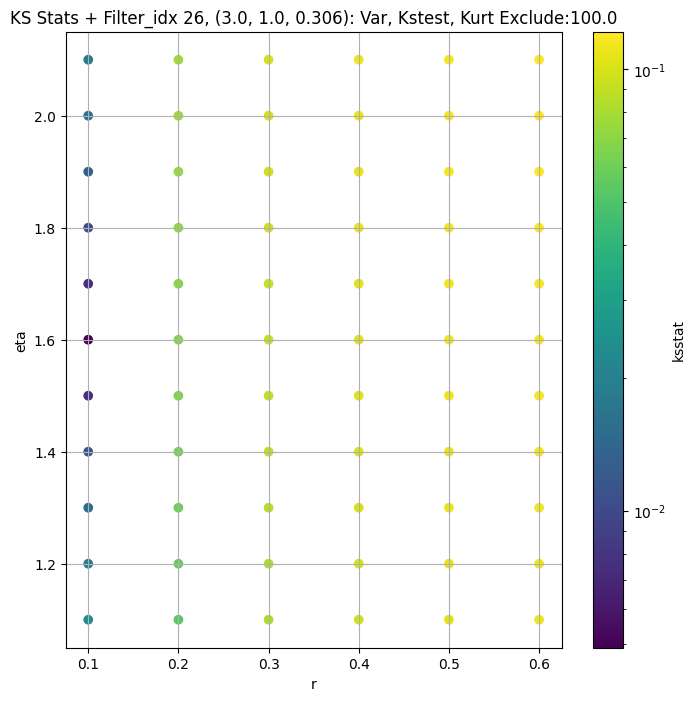

####
Filter_idx, 27: (3.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 0 0.022897865835230735 0.19155832


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 50 0.009410849468973609 0.08981327


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 100 0.007822758375506611 0.08206381


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 200 0.0059459131897406925 0.07293956
Number of samples: 100000, Without approximation : 262144000.0


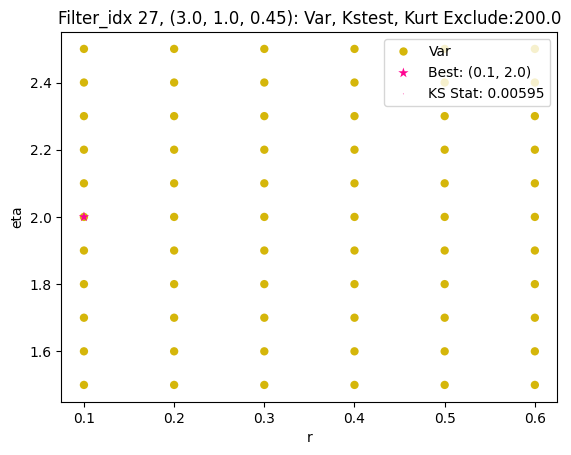

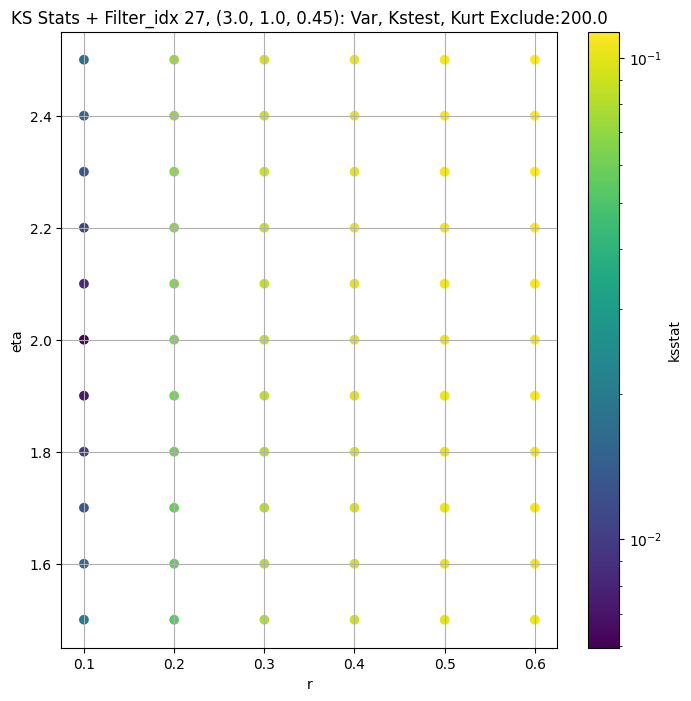

####
Filter_idx, 28: (4.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 0 0.017620768272442522 64.19461


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 50 0.00288435547418886 34.87731


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 100 0.002138218893335486 31.223244


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 200 0.0028047652093511725 27.575766
Number of samples: 100000, Without approximation : 262144000.0


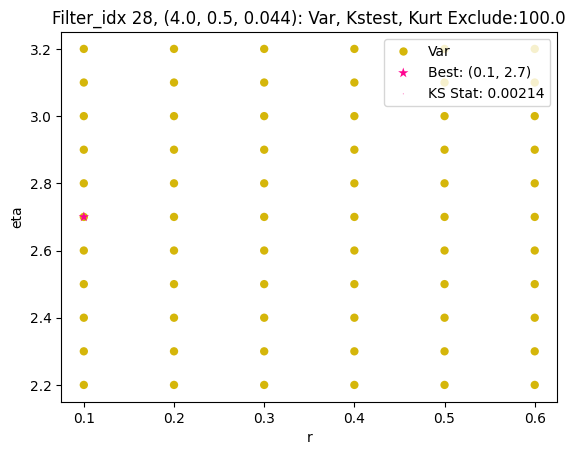

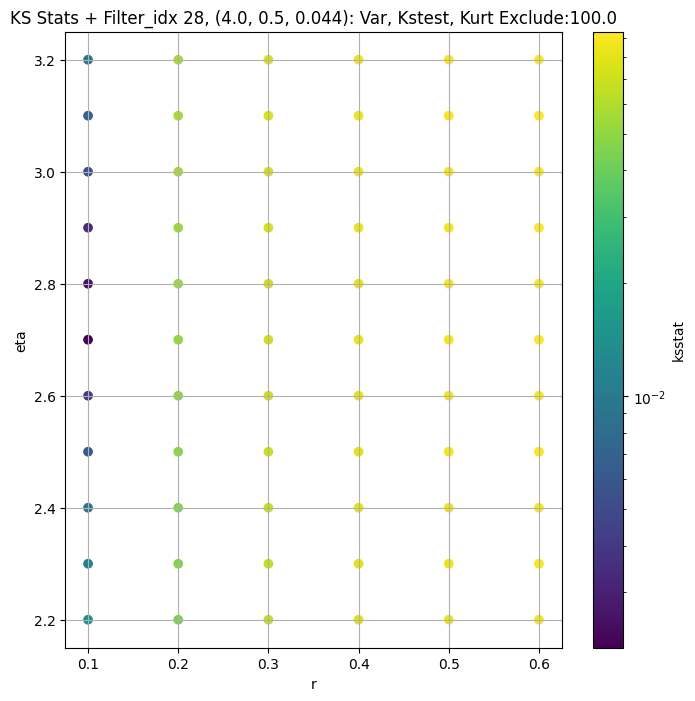

####
Filter_idx, 29: (4.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 0 0.022471795724830837 34.89332


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 50 0.005376246208542157 17.448177


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 100 0.0014377178802210677 15.212208


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 200 0.002638678230477169 13.306923
Number of samples: 100000, Without approximation : 262144000.0


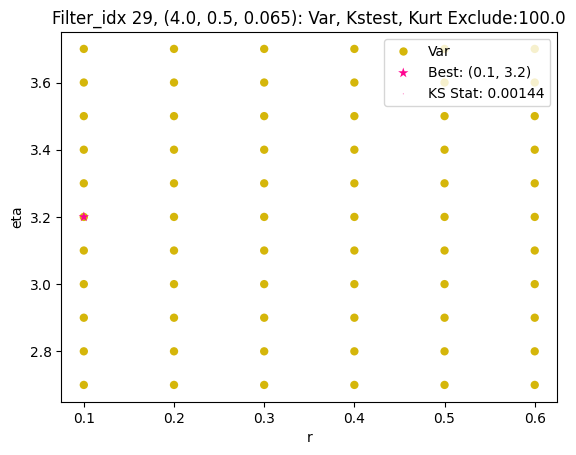

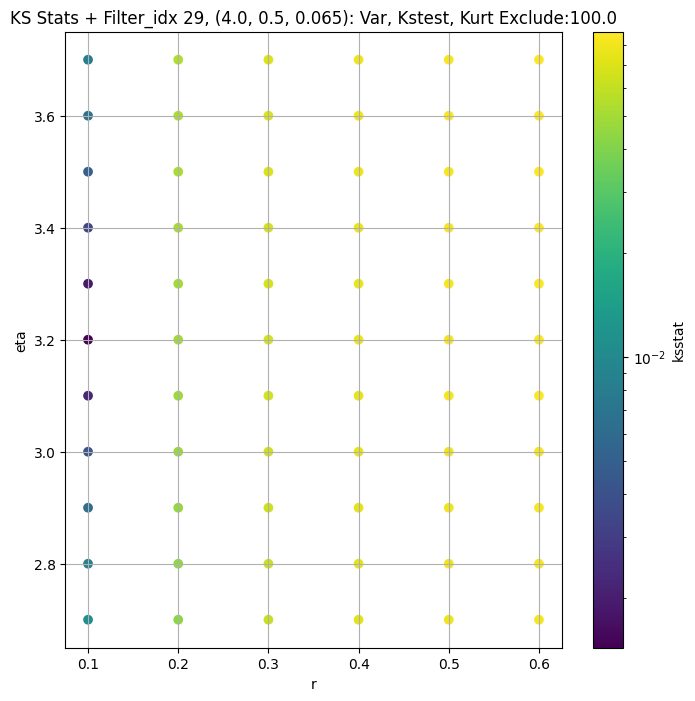

####
Filter_idx, 30: (4.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 0 0.020836091342778196 29.146175


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 50 0.0048591104006373564 13.702305


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 100 0.0021754783537923927 11.995611


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 200 0.003406717877875831 10.472125
Number of samples: 100000, Without approximation : 262144000.0


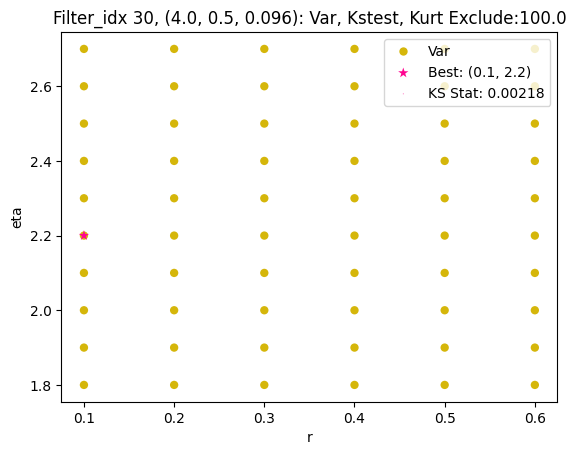

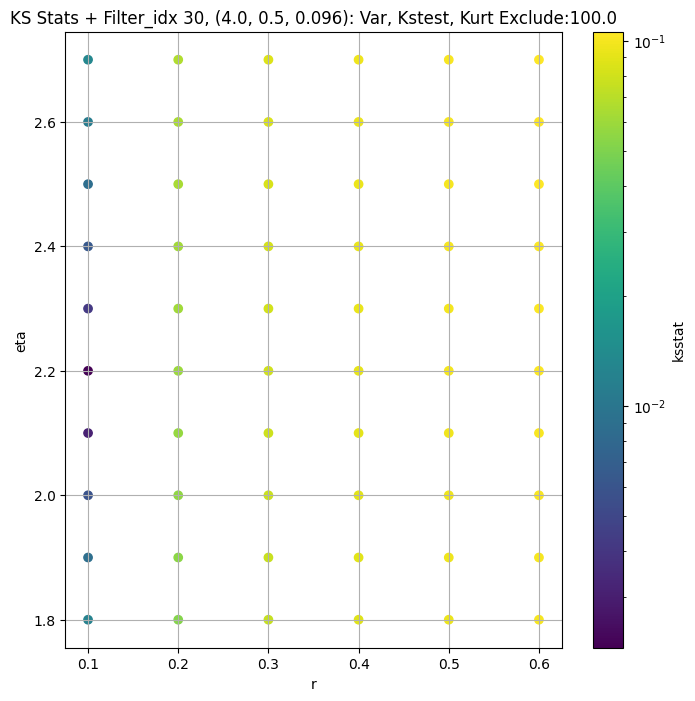

####
Filter_idx, 31: (4.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 0 0.006586306725364199 7.5720377


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 50 0.003591477777825397 6.4987307


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 100 0.002570892306350568 6.034707


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 200 0.0040861889495625026 5.4333816
Number of samples: 100000, Without approximation : 262144000.0


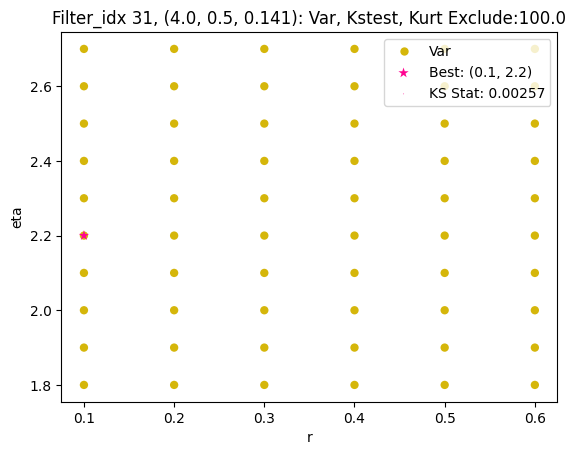

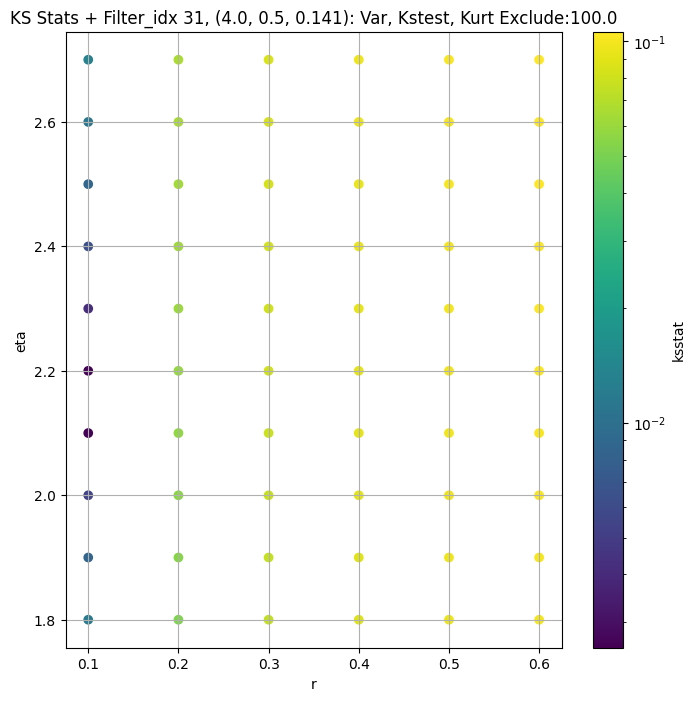

####
Filter_idx, 32: (4.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 0 0.025054686973056906 3.5108461


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 50 0.013101763879154918 1.9660704


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 100 0.008719590576045544 1.6608477


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 200 0.00507237652693826 1.3826671
Number of samples: 100000, Without approximation : 262144000.0


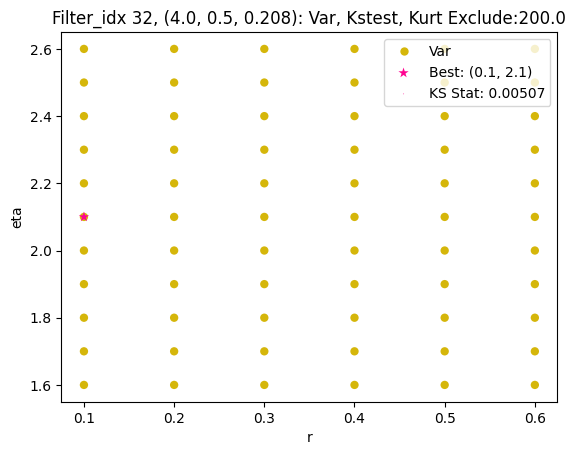

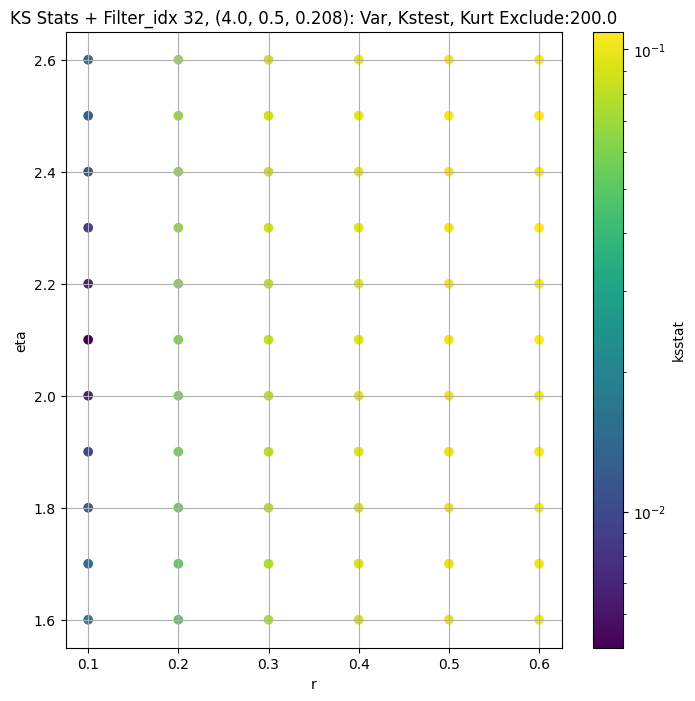

####
Filter_idx, 33: (4.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 0 0.026394572556590834 1.0570555


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 50 0.015107336738255678 0.5418331


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 100 0.011409004027886638 0.43289763


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 200 0.006838963987726987 0.35211
Number of samples: 100000, Without approximation : 262144000.0


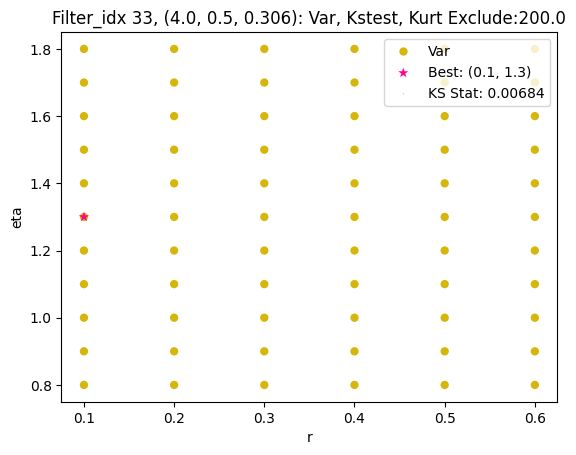

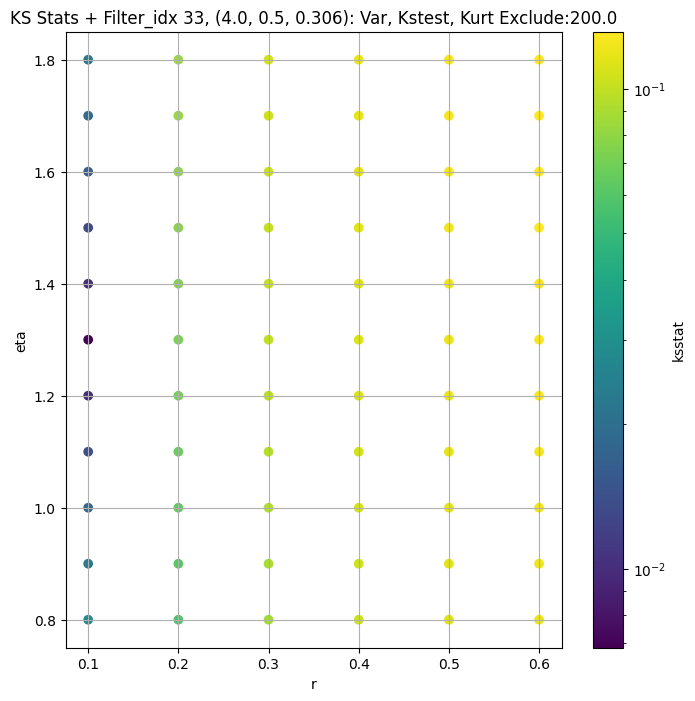

####
Filter_idx, 34: (4.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 0 0.026277903252490367 0.111937195


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 50 0.01418205935830591 0.05356659


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 100 0.013426722438352245 0.048759688


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 200 0.01108184865175188 0.042935256
Number of samples: 100000, Without approximation : 262144000.0


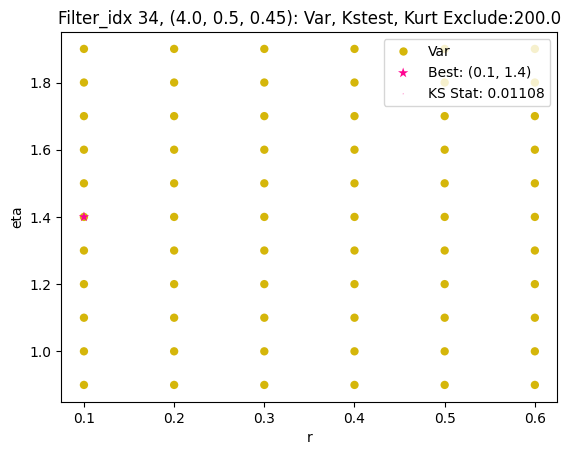

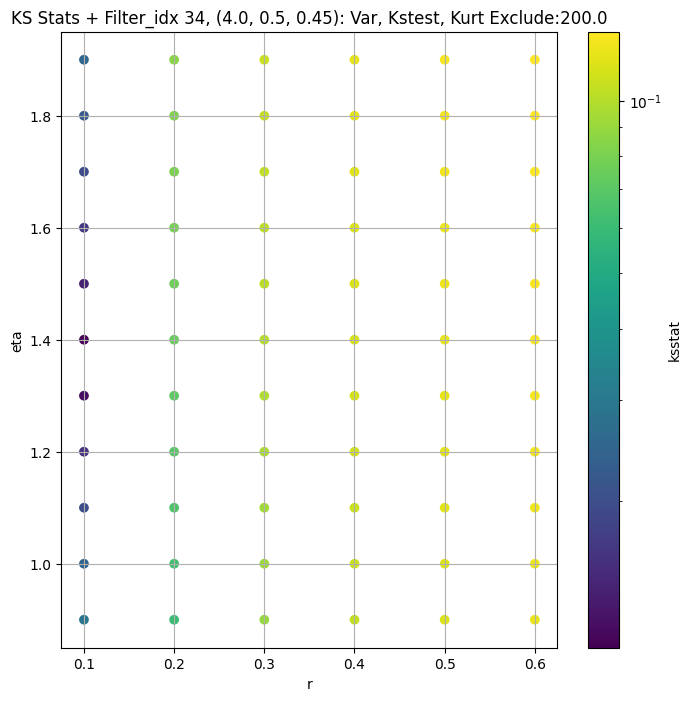

####
Filter_idx, 35: (4.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 0 0.02727196729708492 89.84374


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 50 0.008101373873419249 36.989754


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 100 0.003872785650790647 31.458347


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 200 0.002949357410897302 27.043097
Number of samples: 100000, Without approximation : 262144000.0


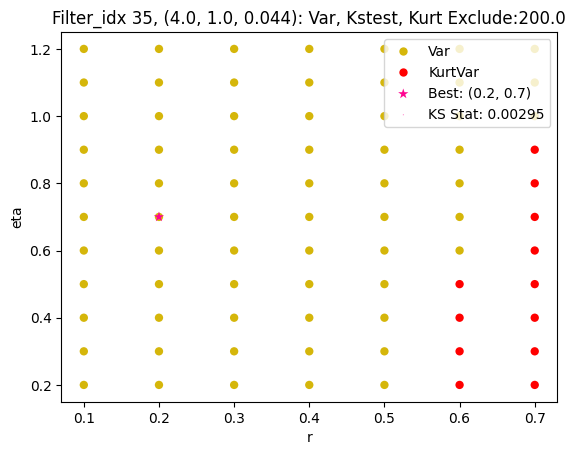

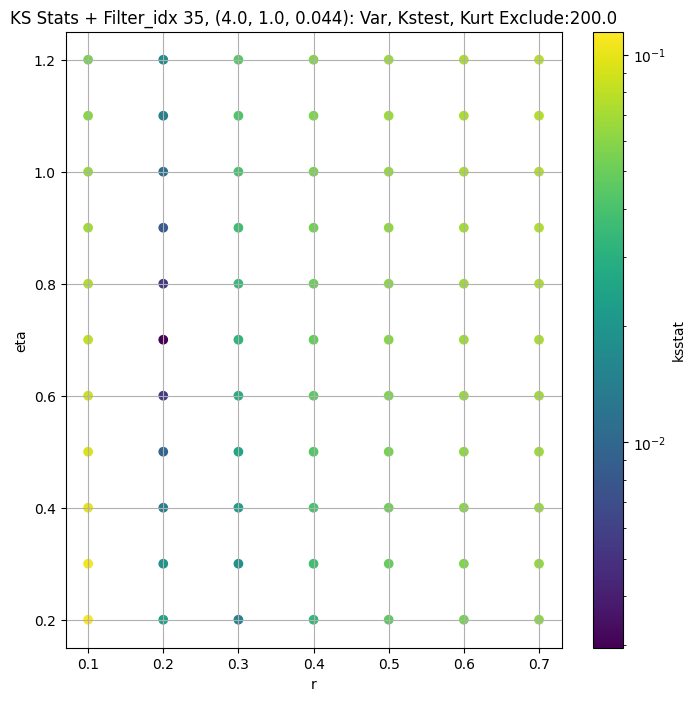

####
Filter_idx, 36: (4.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 0 0.026009283939282757 44.407967


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 50 0.00646400308185642 18.489384


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 100 0.002055263437194643 15.454541


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 200 0.0027056872896641885 13.339587
Number of samples: 100000, Without approximation : 262144000.0


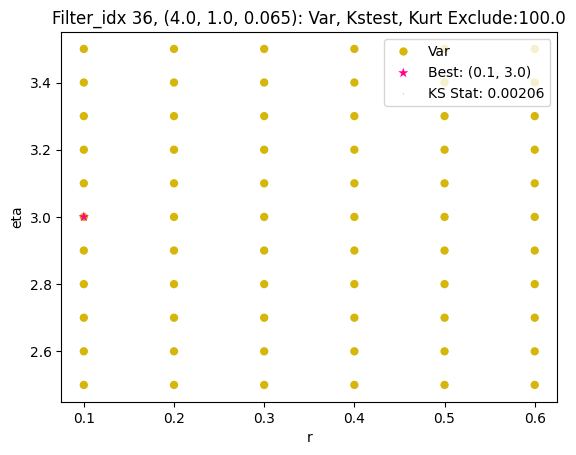

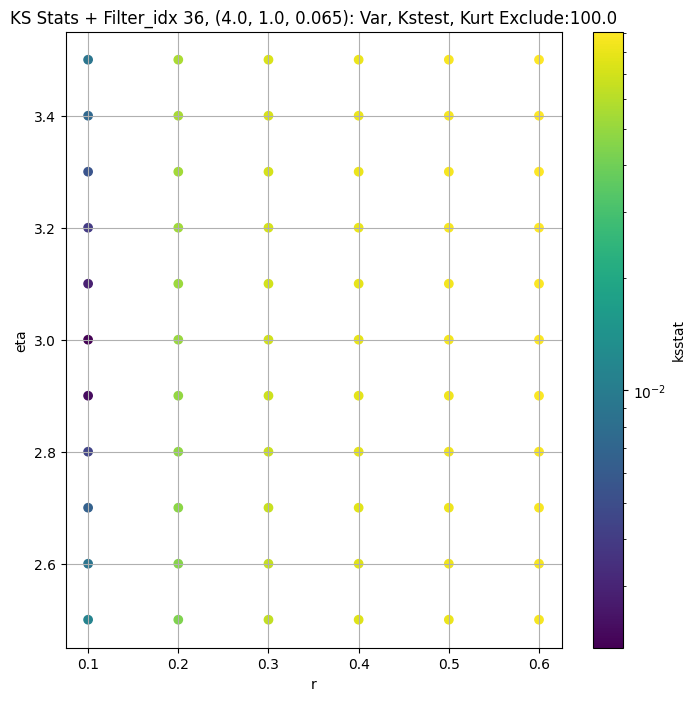

####
Filter_idx, 37: (4.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 0 0.03112764282127589 43.91499


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 50 0.0068828035877785965 13.728501


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 100 0.003959022926649652 11.940483


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 200 0.003599415459795592 10.411578
Number of samples: 100000, Without approximation : 262144000.0


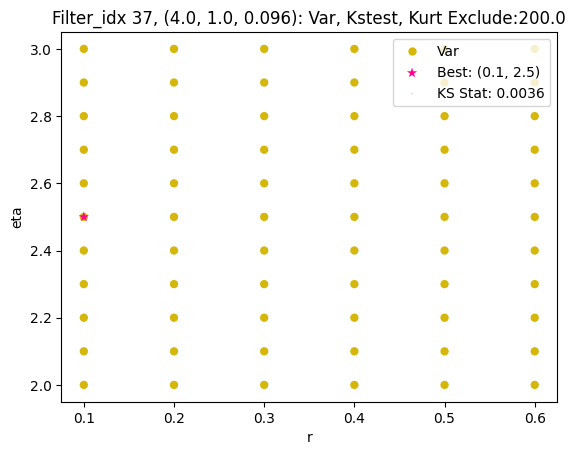

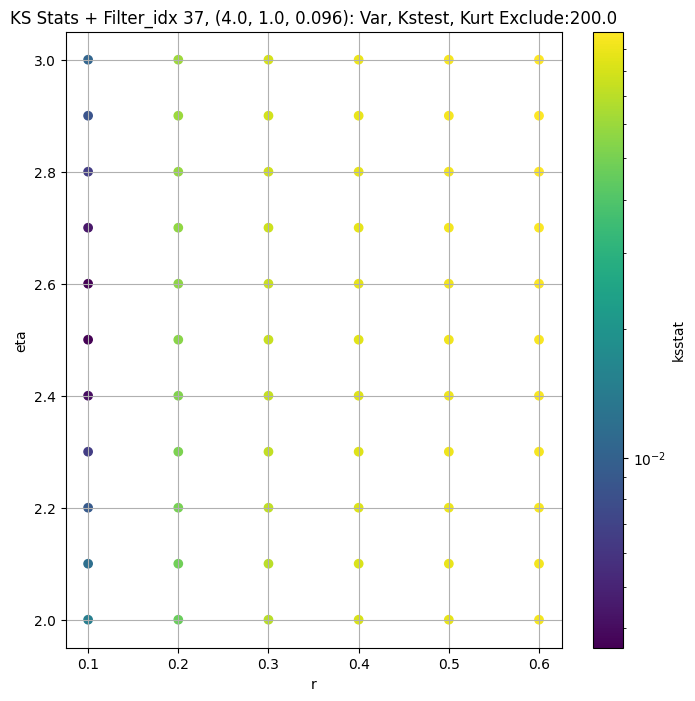

####
Filter_idx, 38: (4.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 0 0.040217468684407565 43.7685


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 50 0.009120127223053734 7.7764325


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 100 0.0063031784040071814 6.6423783


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 200 0.0033853345793137812 5.626345
Number of samples: 100000, Without approximation : 262144000.0


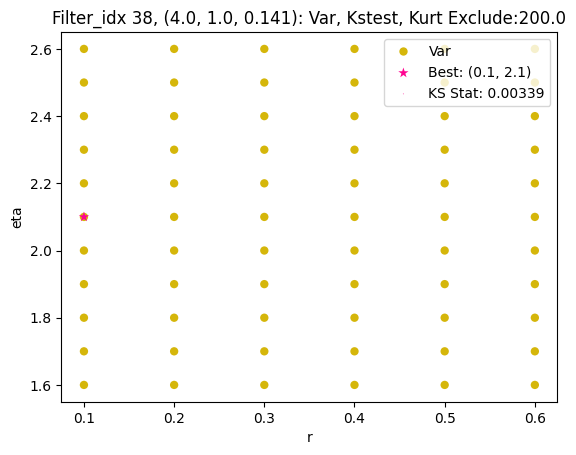

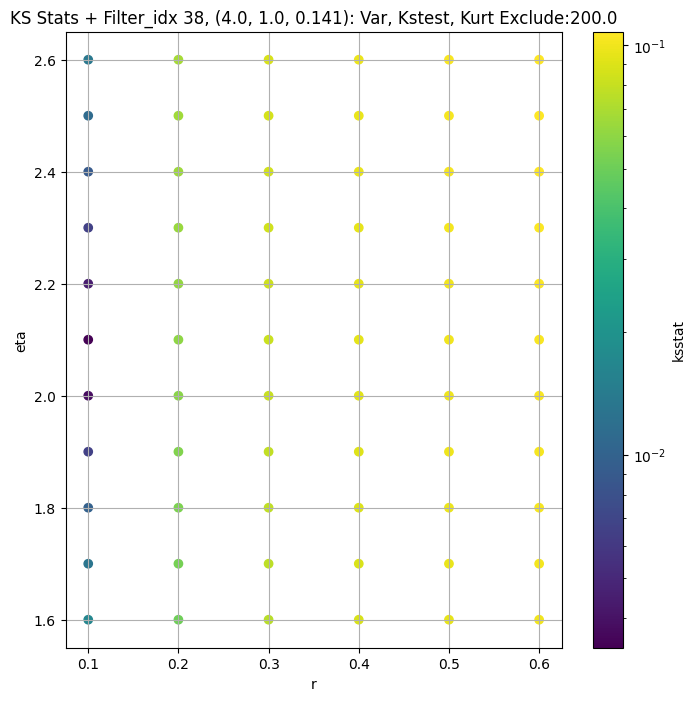

####
Filter_idx, 39: (4.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 0 0.023281167574401768 4.964073


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 50 0.014527172792759946 3.1869617


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 100 0.011772743711070843 2.6828086


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 200 0.006545173008269511 2.140267
Number of samples: 100000, Without approximation : 262144000.0


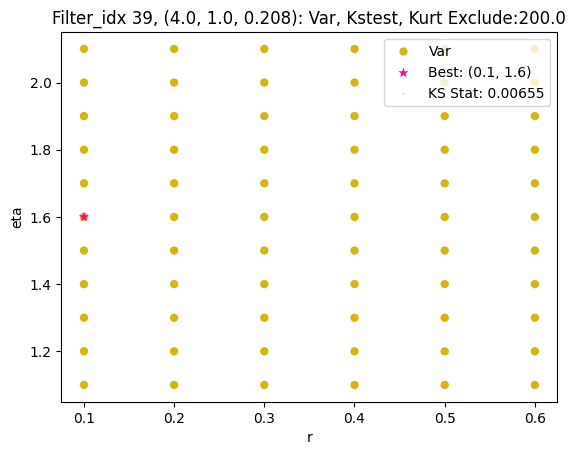

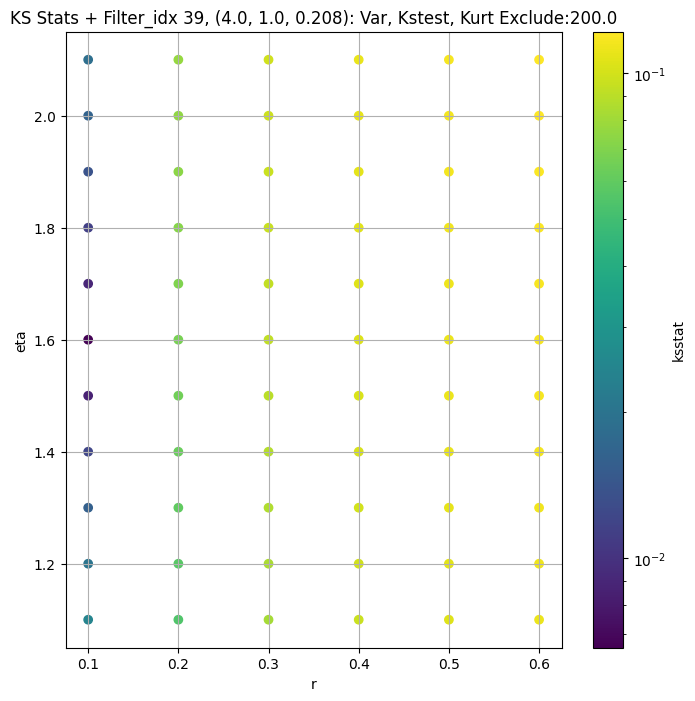

####
Filter_idx, 40: (4.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 0 0.030429086814141762 1.3922533


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 50 0.013827499345585914 0.5249027


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 100 0.009480536638291626 0.44492626


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 200 0.006177438008722169 0.372311
Number of samples: 100000, Without approximation : 262144000.0


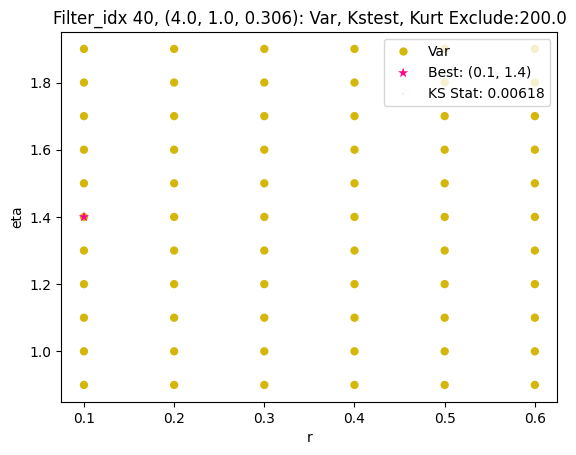

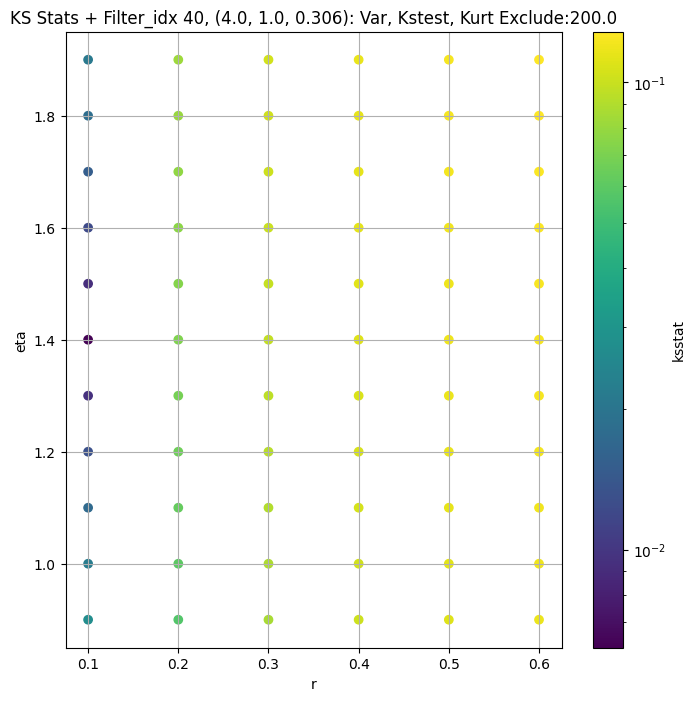

####
Filter_idx, 41: (4.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 0 0.03000203298302162 0.16450445


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 50 0.012800361917414821 0.064126335


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 100 0.012077418582149835 0.057842165


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 200 0.009294818086022505 0.050704
Number of samples: 100000, Without approximation : 262144000.0


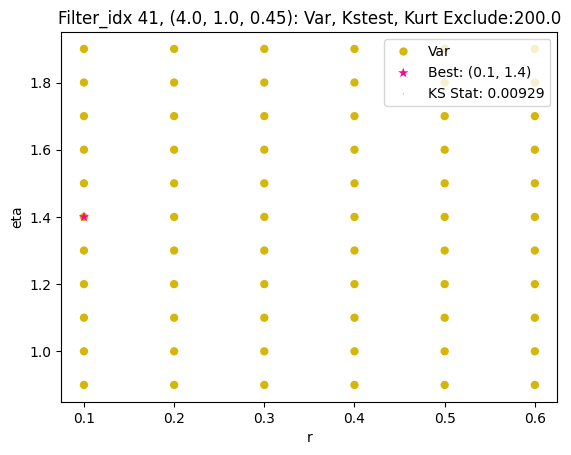

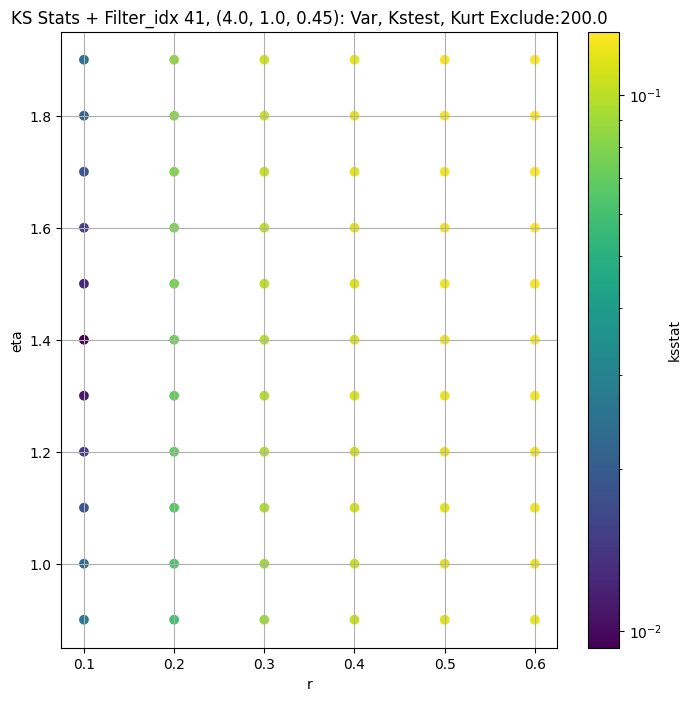

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",105.022090,27.378706,626.072630,753.90300,10.089722,772.35266,262144000.0,"(2.0, 0.5, 0.044)",0.002699,0.1,2.9,4.282471e-16,200.0,30.302052,0.000084
1,"(2.0, 0.5, 0.065)",38.574230,14.073940,272.467000,1018.09595,6.095307,854.14886,262144000.0,"(2.0, 0.5, 0.065)",0.001565,0.1,2.7,3.824396e-16,100.0,17.732866,0.000084
2,"(2.0, 0.5, 0.096)",30.087484,8.941023,174.511540,825.73830,5.479582,847.71796,262144000.0,"(2.0, 0.5, 0.096)",0.001833,0.1,2.8,1.907894e-16,100.0,10.952781,0.000084
3,"(2.0, 0.5, 0.141)",24.735935,4.736554,124.400840,877.88950,8.951097,788.74320,262144000.0,"(2.0, 0.5, 0.141)",0.002598,0.1,2.7,1.122830e-16,200.0,5.206313,0.000084
4,"(2.0, 0.5, 0.208)",7.208369,1.599787,39.273690,774.56410,9.087828,861.38160,262144000.0,"(2.0, 0.5, 0.208)",0.003753,0.1,2.6,4.854067e-17,200.0,1.809404,0.000084
5,"(2.0, 0.5, 0.306)",1.065362,0.331705,7.509088,1051.99790,9.293052,820.31946,262144000.0,"(2.0, 0.5, 0.306)",0.003649,0.1,2.2,2.656935e-17,200.0,0.393021,0.000084
6,"(2.0, 0.5, 0.45)",0.619021,0.209870,6.490139,1823.68690,10.255322,881.34436,262144000.0,"(2.0, 0.5, 0.45)",0.004580,0.1,1.8,4.594952e-17,200.0,0.245351,0.000084
7,"(2.0, 1.0, 0.044)",114.915660,32.235943,1166.408400,2096.19920,7.799550,917.38210,262144000.0,"(2.0, 1.0, 0.044)",0.002862,0.1,3.2,2.763357e-16,200.0,35.705580,0.000084
8,"(2.0, 1.0, 0.065)",62.611774,17.722000,471.684720,1030.81810,9.482702,829.54530,262144000.0,"(2.0, 1.0, 0.065)",0.002531,0.1,2.8,3.595228e-16,200.0,20.639376,0.000084


In [12]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [13]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 100 = 300, ksstat: 0.00380968809287896, var: 26.782085418701172


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 75 = 275, ksstat: 0.0035022254038837566, var: 27.48539924621582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 50 = 250, ksstat: 0.003218303120232746, var: 28.28651237487793


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 25 = 225, ksstat: 0.002957228584903037, var: 29.212671279907227


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + 0 = 200, ksstat: 0.0026990619022554396, var: 30.302051544189453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -25 = 175, ksstat: 0.0031435301023866186, var: 31.614736557006836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -50 = 150, ksstat: 0.004151677579208979, var: 33.2457275390625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -75 = 125, ksstat: 0.005621044277732357, var: 35.35495376586914


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 0, 200.0 + -100 = 100, ksstat: 0.007455369636191228, var: 38.220130920410156
Number of samples: 100000, Without approximation : 262144000.0


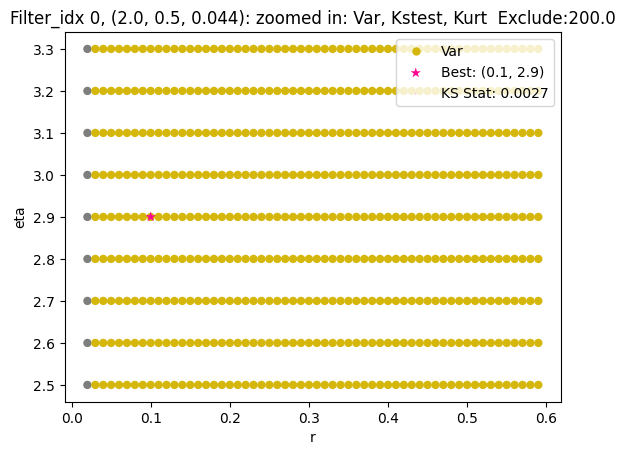

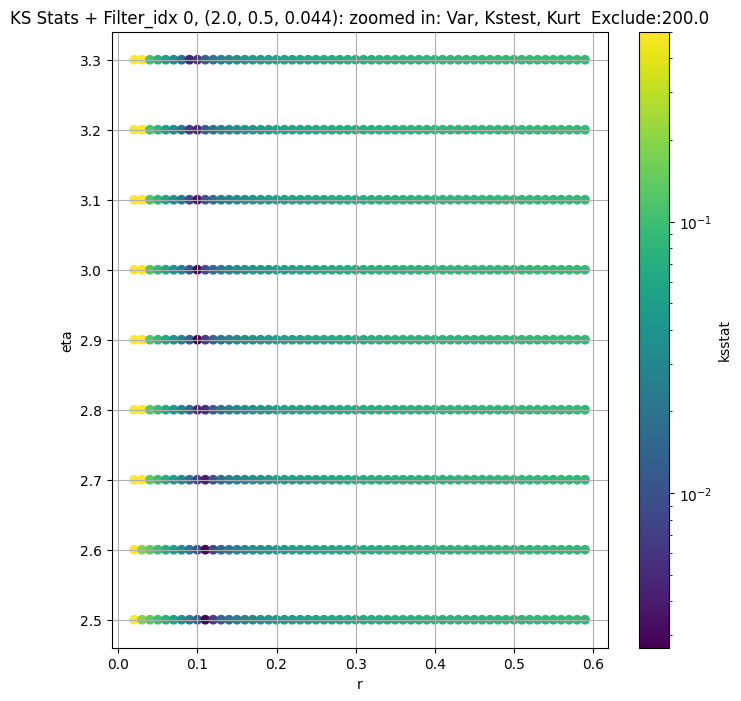

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + 100 = 200, ksstat: 0.0031319728657263485, var: 15.469656944274902


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + 75 = 175, ksstat: 0.002465330093558704, var: 15.880681991577148


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + 50 = 150, ksstat: 0.002042837524449337, var: 16.365825653076172


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + 25 = 125, ksstat: 0.0019056362834132257, var: 16.96111297607422


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + 0 = 100, ksstat: 0.001504427760643079, var: 17.732866287231445


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + -25 = 75, ksstat: 0.0025572583500300117, var: 18.818986892700195


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + -50 = 50, ksstat: 0.004442088673038691, var: 20.515024185180664


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + -75 = 25, ksstat: 0.007807987896470317, var: 23.65134048461914


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 100.0 + -100 = 0, ksstat: 0.017825165108436125, var: 38.5742301940918
Number of samples: 100000, Without approximation : 262144000.0


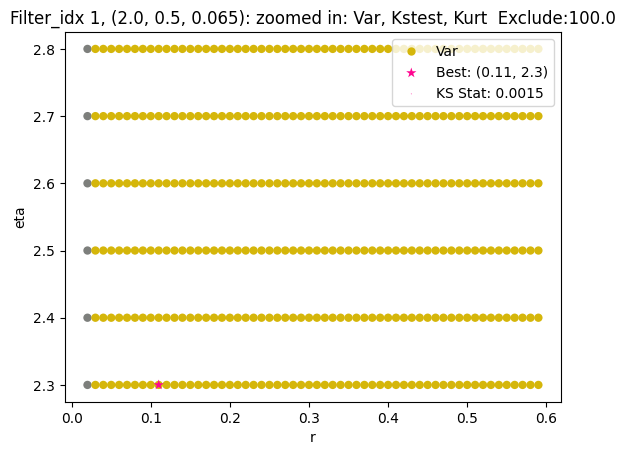

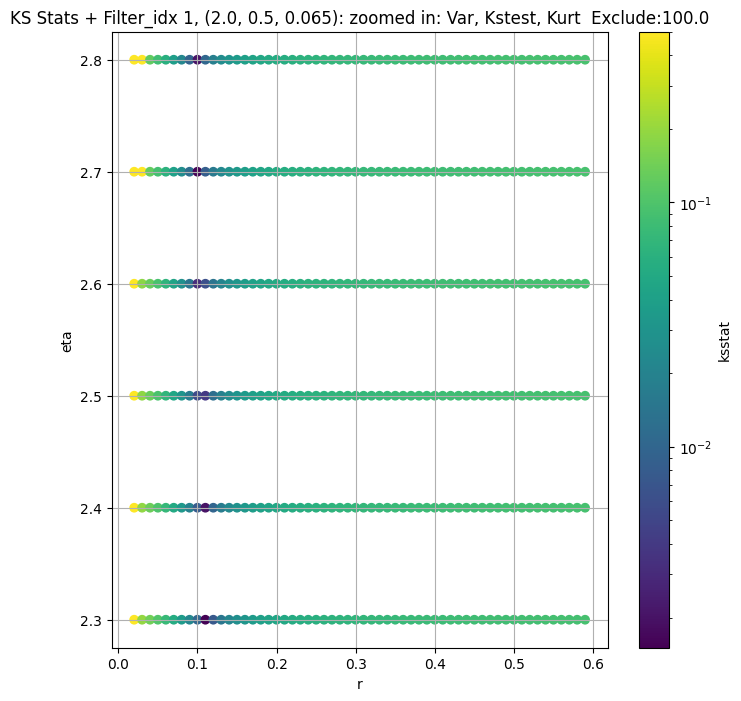

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 100 = 200, ksstat: 0.004849637829357212, var: 9.68312931060791


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 75 = 175, ksstat: 0.004066839091554718, var: 9.91232681274414


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 50 = 150, ksstat: 0.003548140679615064, var: 10.183109283447266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 25 = 125, ksstat: 0.002453909752875627, var: 10.51616382598877


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + 0 = 100, ksstat: 0.0017886347206400588, var: 10.952780723571777


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -25 = 75, ksstat: 0.0016104211732369533, var: 11.645986557006836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -50 = 50, ksstat: 0.0033213871953863064, var: 13.151333808898926


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -75 = 25, ksstat: 0.009376226066123233, var: 17.07822608947754


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 2, 100.0 + -100 = 0, ksstat: 0.02068476655379664, var: 30.08748435974121
Number of samples: 100000, Without approximation : 262144000.0


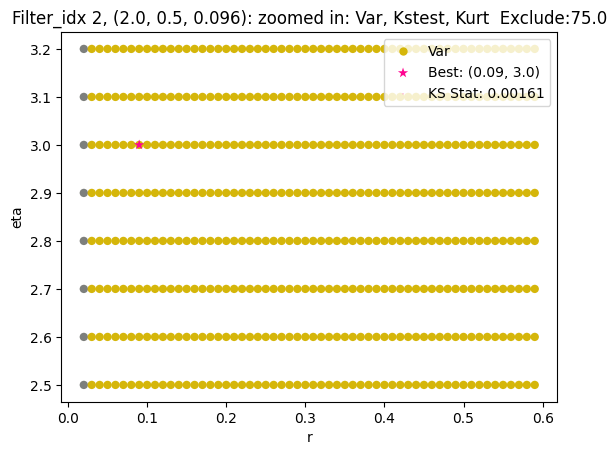

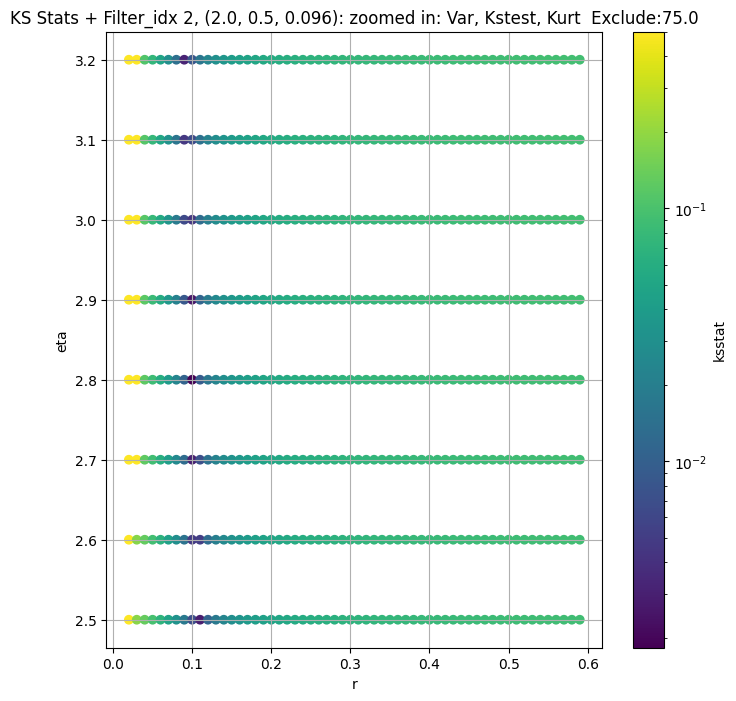

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + 100 = 300, ksstat: 0.004642408563529536, var: 4.675380229949951


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + 75 = 275, ksstat: 0.003940173529374369, var: 4.785552501678467


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + 50 = 250, ksstat: 0.0033368773009874175, var: 4.908562183380127


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + 25 = 225, ksstat: 0.0029084133538667123, var: 5.04741907119751


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + 0 = 200, ksstat: 0.0025982945549073433, var: 5.206313133239746


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + -25 = 175, ksstat: 0.002348080209821322, var: 5.391030311584473


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + -50 = 150, ksstat: 0.0021009077911441354, var: 5.611293792724609


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + -75 = 125, ksstat: 0.0024573171922604997, var: 5.887197494506836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 200.0 + -100 = 100, ksstat: 0.0035590596359337395, var: 6.272725582122803
Number of samples: 100000, Without approximation : 262144000.0


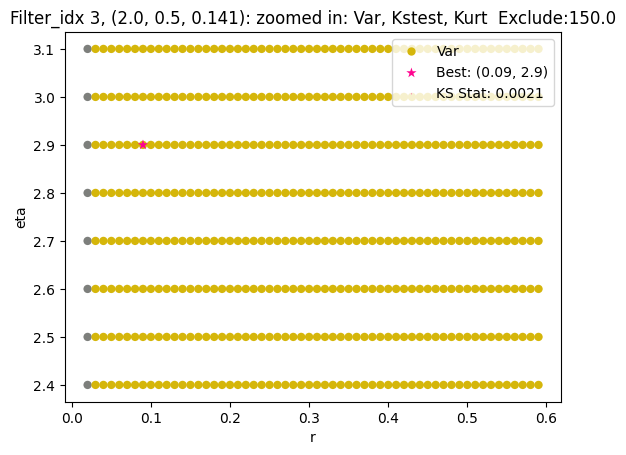

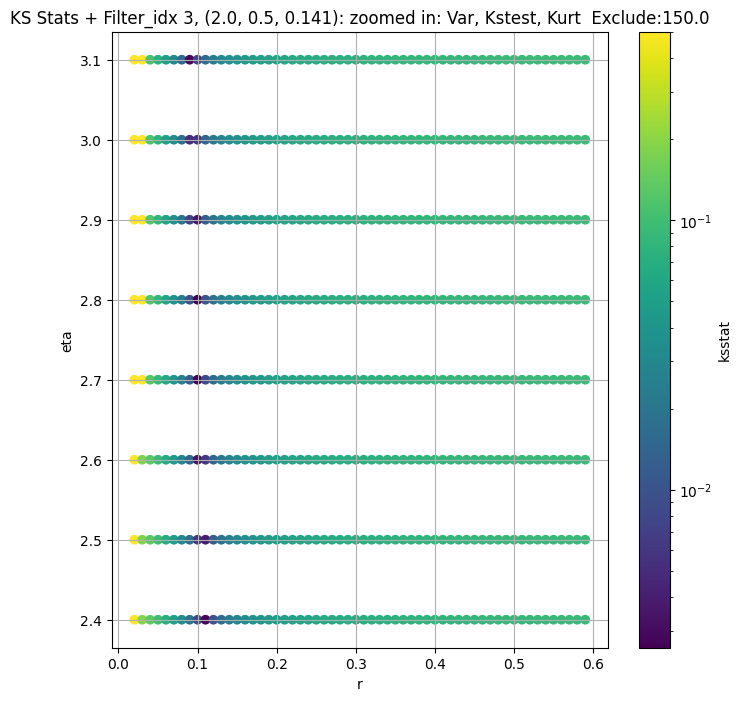

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 100 = 300, ksstat: 0.00553432954568794, var: 1.6498056650161743


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 75 = 275, ksstat: 0.005096836164645676, var: 1.683342456817627


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 50 = 250, ksstat: 0.004650504425235288, var: 1.720345139503479


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 25 = 225, ksstat: 0.004211740149770139, var: 1.7618376016616821


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + 0 = 200, ksstat: 0.0037090319851434145, var: 1.8094040155410767


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -25 = 175, ksstat: 0.0032208182849998643, var: 1.865639567375183


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -50 = 150, ksstat: 0.0033394117863375095, var: 1.9352707862854004


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -75 = 125, ksstat: 0.004168069334408553, var: 2.0278255939483643


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 200.0 + -100 = 100, ksstat: 0.005075121405352143, var: 2.1624481678009033
Number of samples: 100000, Without approximation : 262144000.0


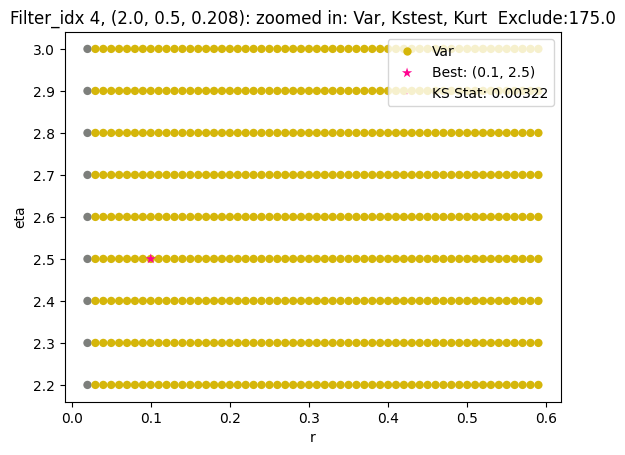

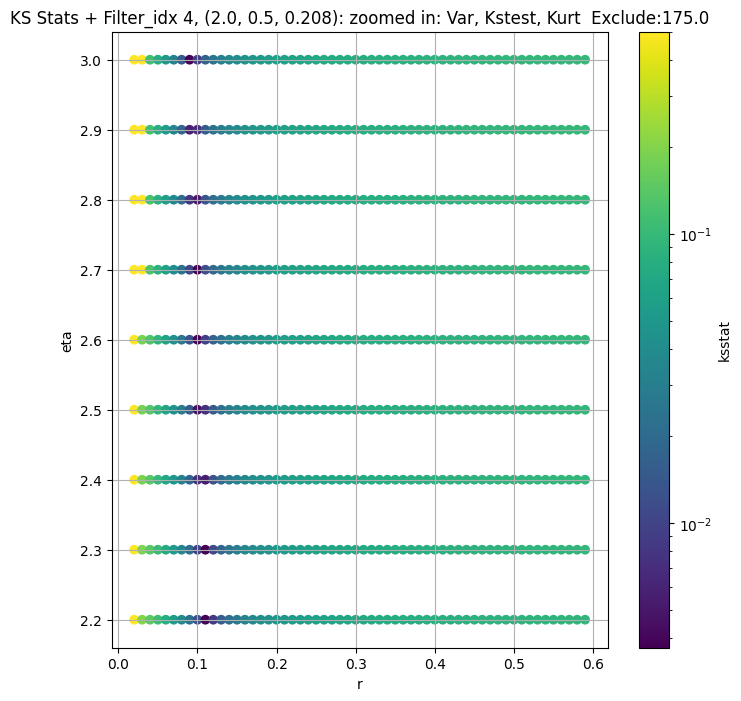

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 100 = 300, ksstat: 0.005240821089129932, var: 0.3555665612220764


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 75 = 275, ksstat: 0.004839408220177343, var: 0.3636423647403717


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 50 = 250, ksstat: 0.004450949748716515, var: 0.37246063351631165


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 25 = 225, ksstat: 0.004037575527600586, var: 0.3821796774864197


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + 0 = 200, ksstat: 0.003611686588490426, var: 0.3930206894874573


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -25 = 175, ksstat: 0.0032104009208142603, var: 0.40530630946159363


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -50 = 150, ksstat: 0.0036324601955116664, var: 0.41951531171798706


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -75 = 125, ksstat: 0.004163929288591939, var: 0.4364880919456482


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 5, 200.0 + -100 = 100, ksstat: 0.0058051212794222595, var: 0.45778918266296387
Number of samples: 100000, Without approximation : 262144000.0


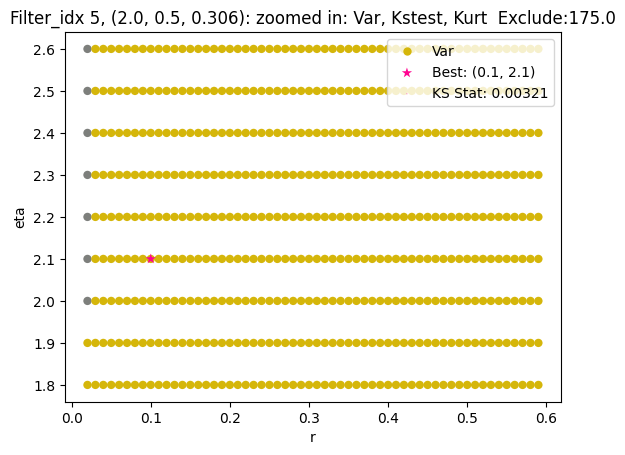

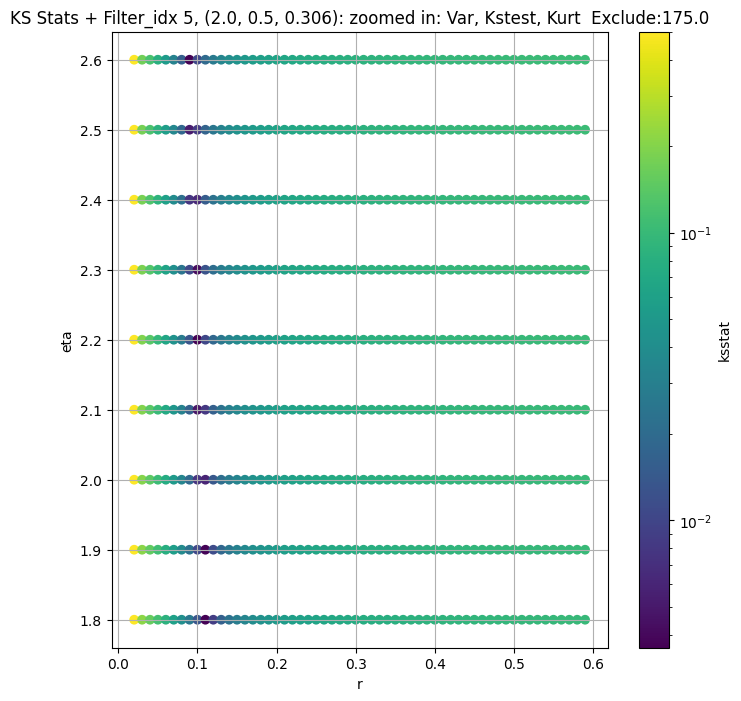

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + 100 = 300, ksstat: 0.0062098127242854705, var: 0.22268469631671906


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + 75 = 275, ksstat: 0.005806583691708389, var: 0.22762997448444366


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + 50 = 250, ksstat: 0.005324791186075824, var: 0.23299890756607056


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + 25 = 225, ksstat: 0.004947616658100586, var: 0.2388712465763092


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + 0 = 200, ksstat: 0.004492561869322512, var: 0.24535077810287476


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + -25 = 175, ksstat: 0.004231202206812057, var: 0.25259140133857727


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + -50 = 150, ksstat: 0.005259418285112838, var: 0.2608164846897125


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + -75 = 125, ksstat: 0.005462765866596164, var: 0.270363986492157


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 6, 200.0 + -100 = 100, ksstat: 0.005233339866635323, var: 0.28180092573165894
Number of samples: 100000, Without approximation : 262144000.0


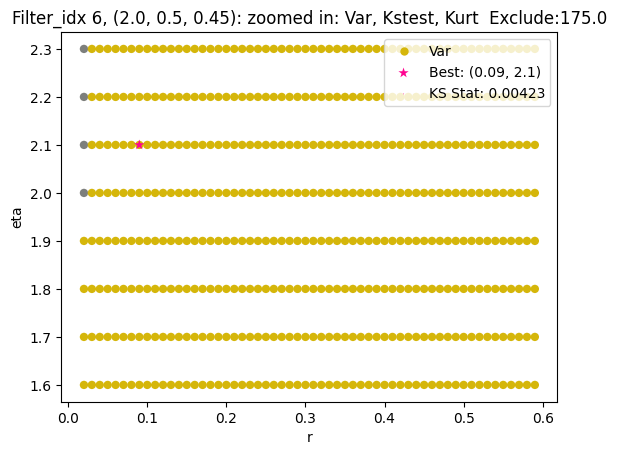

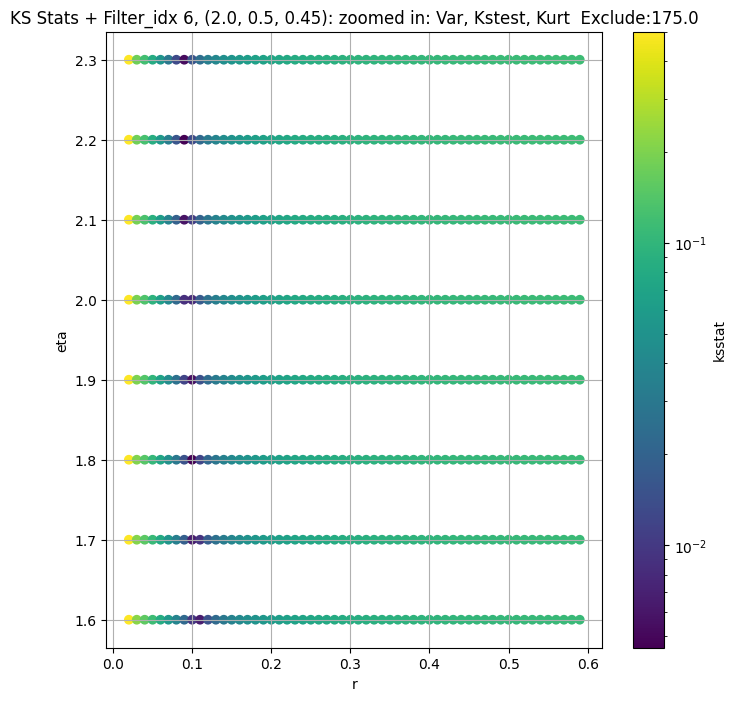

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 100 = 300, ksstat: 0.004487994951379748, var: 32.444034576416016


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 75 = 275, ksstat: 0.004052896937151121, var: 33.12200164794922


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 50 = 250, ksstat: 0.003603704903205206, var: 33.87663269042969


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 25 = 225, ksstat: 0.003193279817184893, var: 34.728668212890625


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + 0 = 200, ksstat: 0.0028619512892254203, var: 35.70558166503906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -25 = 175, ksstat: 0.0025120973776598604, var: 36.85078811645508


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -50 = 150, ksstat: 0.002172460073338267, var: 38.22755432128906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -75 = 125, ksstat: 0.002924364722115602, var: 39.93806076049805


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 7, 200.0 + -100 = 100, ksstat: 0.0043994118984410635, var: 42.1507682800293
Number of samples: 100000, Without approximation : 262144000.0


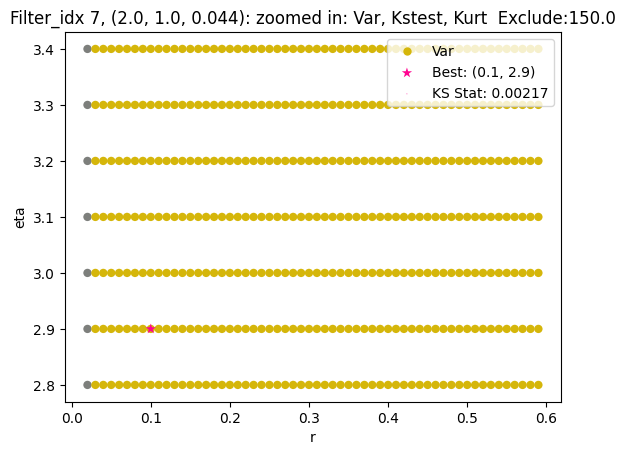

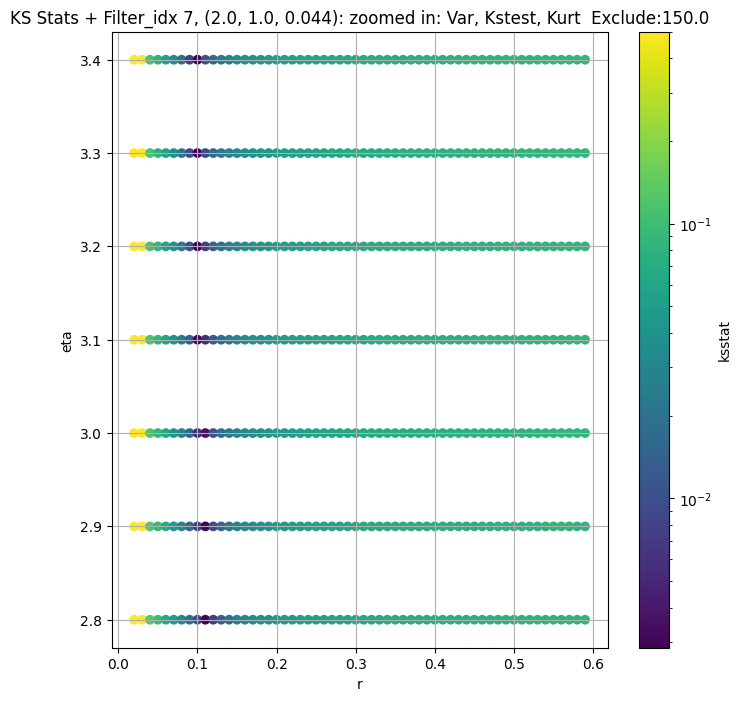

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + 100 = 300, ksstat: 0.00403937622791934, var: 18.299470901489258


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + 75 = 275, ksstat: 0.0034492001848347945, var: 18.767446517944336


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + 50 = 250, ksstat: 0.002997147459098959, var: 19.300600051879883


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + 25 = 225, ksstat: 0.0027339372276656837, var: 19.916461944580078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + 0 = 200, ksstat: 0.0025309154716277593, var: 20.639375686645508


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + -25 = 175, ksstat: 0.002338125490494847, var: 21.50326919555664


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + -50 = 150, ksstat: 0.002129667412419011, var: 22.555330276489258


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + -75 = 125, ksstat: 0.0038782310029083777, var: 23.868330001831055


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 8, 200.0 + -100 = 100, ksstat: 0.005036487392896916, var: 25.571603775024414
Number of samples: 100000, Without approximation : 262144000.0


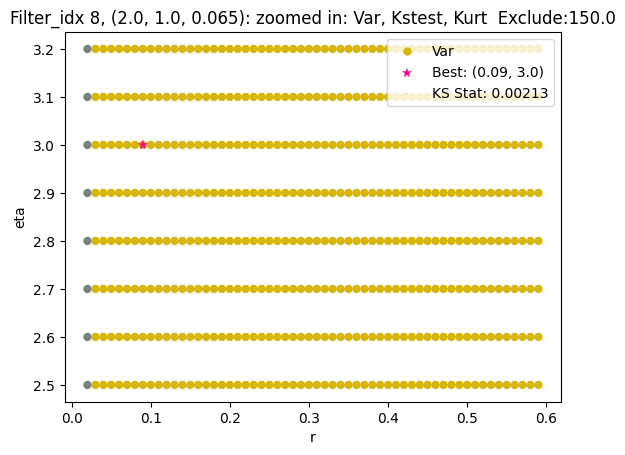

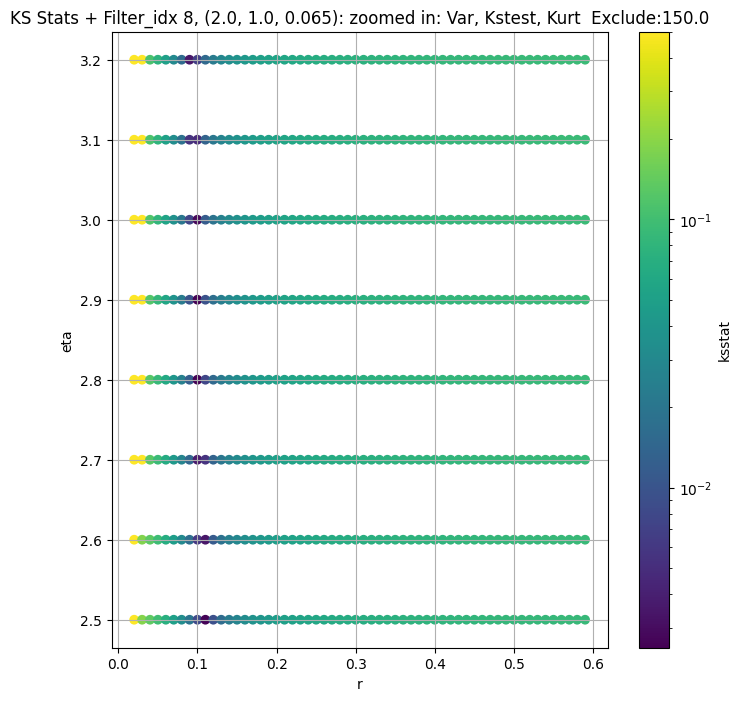

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 100 = 200, ksstat: 0.0030208595986972453, var: 11.456246376037598


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 75 = 175, ksstat: 0.0026438723859233404, var: 11.76699447631836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 50 = 150, ksstat: 0.0023184982552022252, var: 12.122477531433105


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 25 = 125, ksstat: 0.001987482605318447, var: 12.53613567352295


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + 0 = 100, ksstat: 0.0024719224839302445, var: 13.029206275939941


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -25 = 75, ksstat: 0.003246553156048909, var: 13.643296241760254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -50 = 50, ksstat: 0.005009777167624754, var: 14.469049453735352


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -75 = 25, ksstat: 0.006900143377354756, var: 15.82641315460205


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 100.0 + -100 = 0, ksstat: 0.01462717760817342, var: 22.525793075561523
Number of samples: 100000, Without approximation : 262144000.0


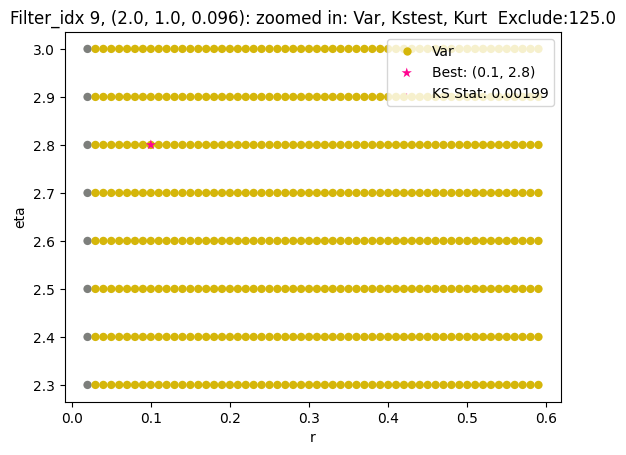

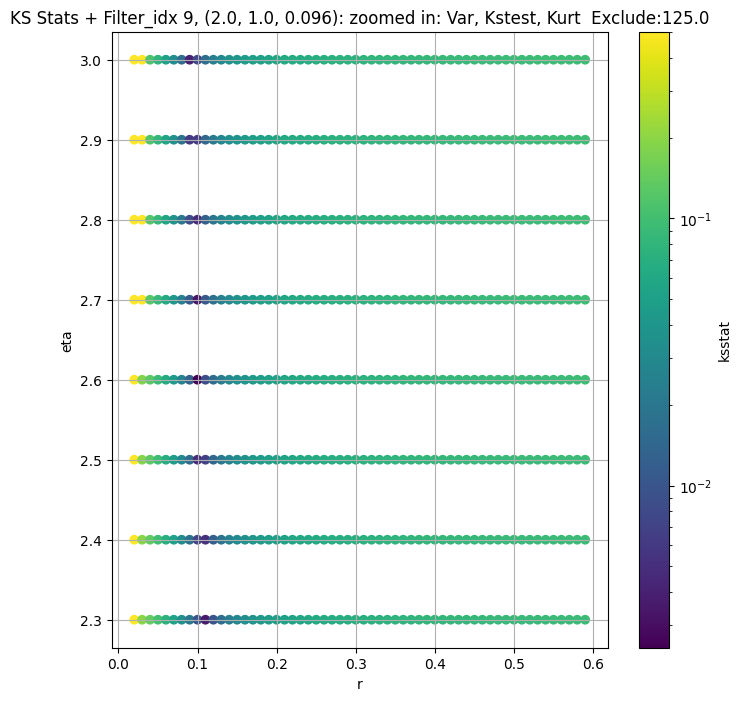

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 100 = 300, ksstat: 0.005527228493713572, var: 6.225072860717773


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 75 = 275, ksstat: 0.004836272836951094, var: 6.3702287673950195


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 50 = 250, ksstat: 0.0040863450478172, var: 6.537442207336426


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 25 = 225, ksstat: 0.003350201684734433, var: 6.735621452331543


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + 0 = 200, ksstat: 0.0024662311009110427, var: 6.979243278503418


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -25 = 175, ksstat: 0.0020590855446906975, var: 7.29227876663208


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -50 = 150, ksstat: 0.001830288591374372, var: 7.712337493896484


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -75 = 125, ksstat: 0.002677838140948574, var: 8.298117637634277


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 200.0 + -100 = 100, ksstat: 0.004626179272788411, var: 9.144783973693848
Number of samples: 100000, Without approximation : 262144000.0


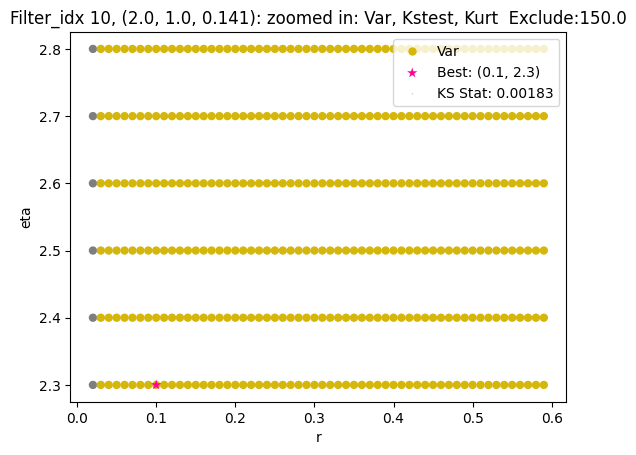

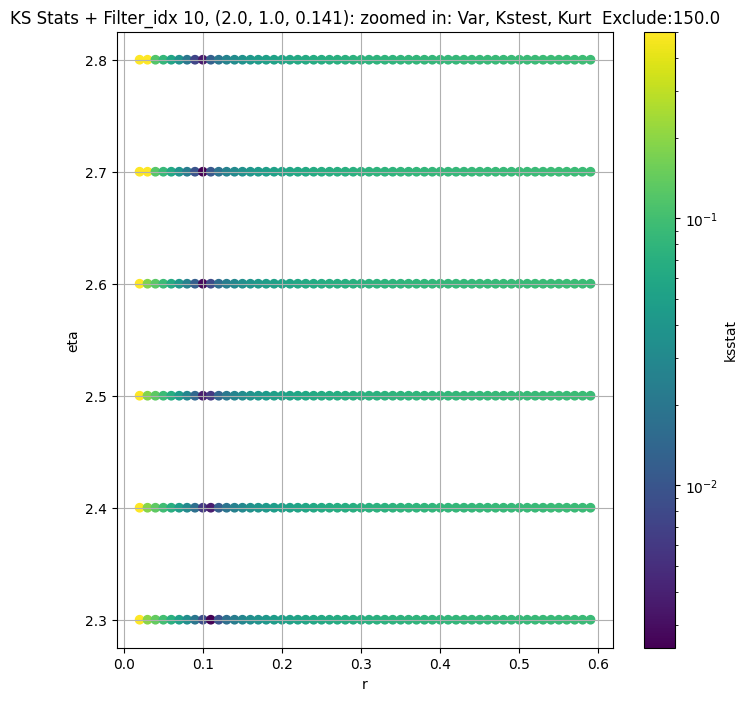

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + 100 = 300, ksstat: 0.005443838722058336, var: 2.7475271224975586


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + 75 = 275, ksstat: 0.00495826524572213, var: 2.8069405555725098


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + 50 = 250, ksstat: 0.004490312607671864, var: 2.872593879699707


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + 25 = 225, ksstat: 0.003969975323226304, var: 2.9460337162017822


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + 0 = 200, ksstat: 0.0034455928591021756, var: 3.0296506881713867


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + -25 = 175, ksstat: 0.002938668403708933, var: 3.1274561882019043


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + -50 = 150, ksstat: 0.002415053351059848, var: 3.246680736541748


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + -75 = 125, ksstat: 0.002992487465723559, var: 3.401890277862549


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 200.0 + -100 = 100, ksstat: 0.003751592916235419, var: 3.6232690811157227
Number of samples: 100000, Without approximation : 262144000.0


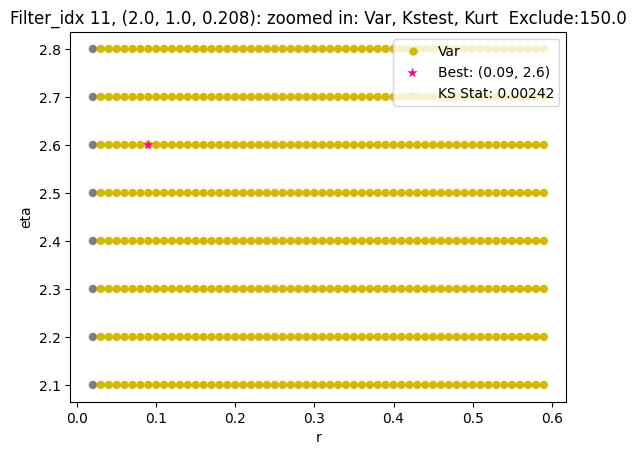

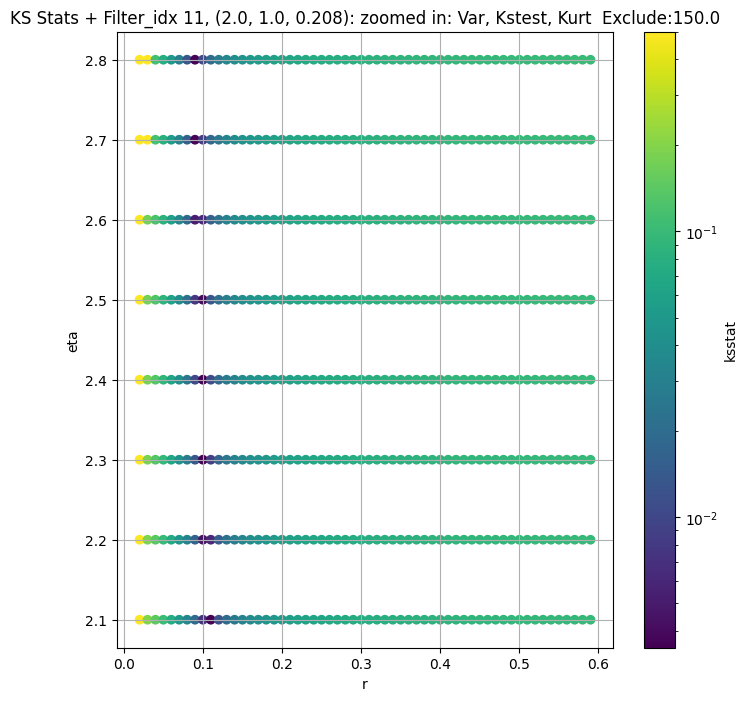

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 100 = 300, ksstat: 0.00446387148462374, var: 0.8333829641342163


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 75 = 275, ksstat: 0.0040095528509011165, var: 0.8580605983734131


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 50 = 250, ksstat: 0.003574917383747673, var: 0.8862025737762451


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 25 = 225, ksstat: 0.003175302059542367, var: 0.9187639951705933


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + 0 = 200, ksstat: 0.0028044747386528623, var: 0.9569840431213379


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -25 = 175, ksstat: 0.003962918722020314, var: 1.0027223825454712


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -50 = 150, ksstat: 0.004905112864159622, var: 1.0585888624191284


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -75 = 125, ksstat: 0.0057566892192145724, var: 1.1286711692810059


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 200.0 + -100 = 100, ksstat: 0.007680822515427663, var: 1.220499038696289
Number of samples: 100000, Without approximation : 262144000.0


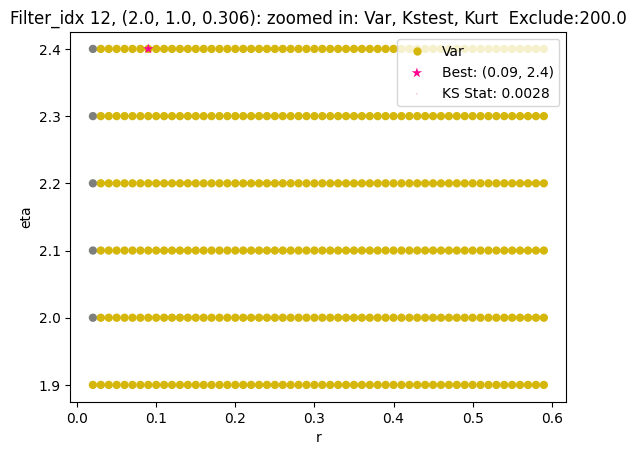

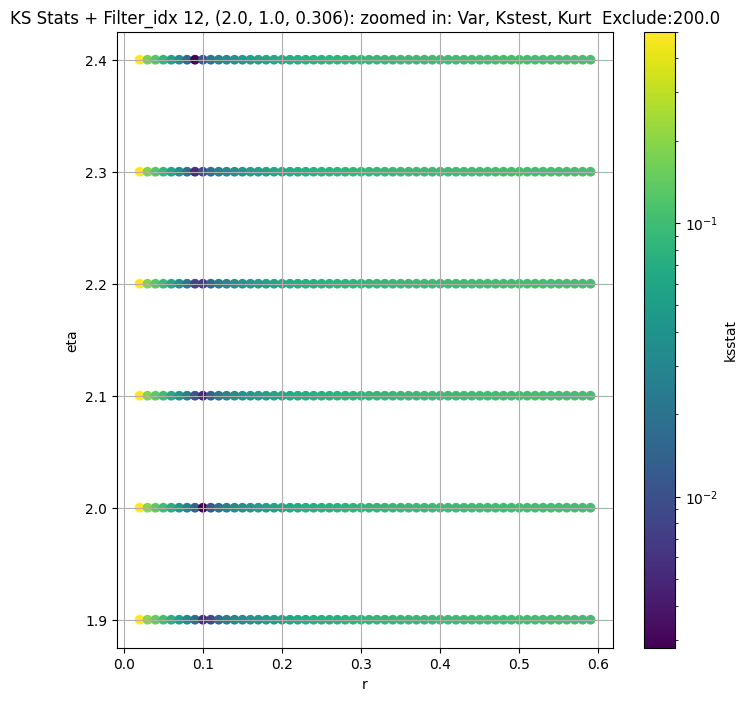

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 100 = 300, ksstat: 0.0066489624139915715, var: 0.2235613465309143


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 75 = 275, ksstat: 0.006194279046814036, var: 0.22829055786132812


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 50 = 250, ksstat: 0.00583960638067571, var: 0.23347817361354828


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 25 = 225, ksstat: 0.005346802783534166, var: 0.2392376959323883


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + 0 = 200, ksstat: 0.004809655161962412, var: 0.2457321733236313


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -25 = 175, ksstat: 0.004214318925390759, var: 0.25321218371391296


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -50 = 150, ksstat: 0.003828876322696073, var: 0.2620551288127899


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -75 = 125, ksstat: 0.004341929392853328, var: 0.27283650636672974


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 13, 200.0 + -100 = 100, ksstat: 0.003952399466697176, var: 0.28649330139160156
Number of samples: 100000, Without approximation : 262144000.0


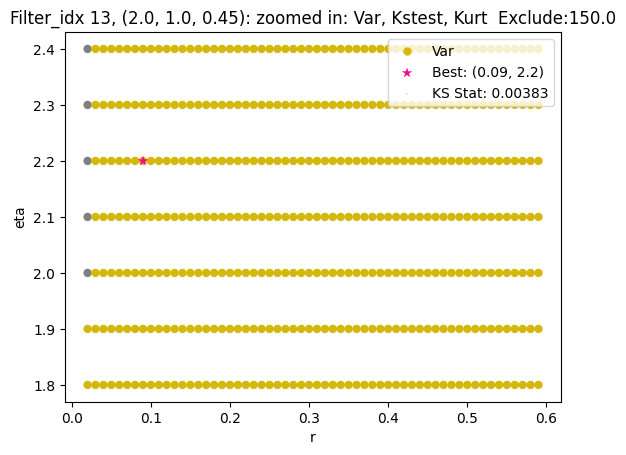

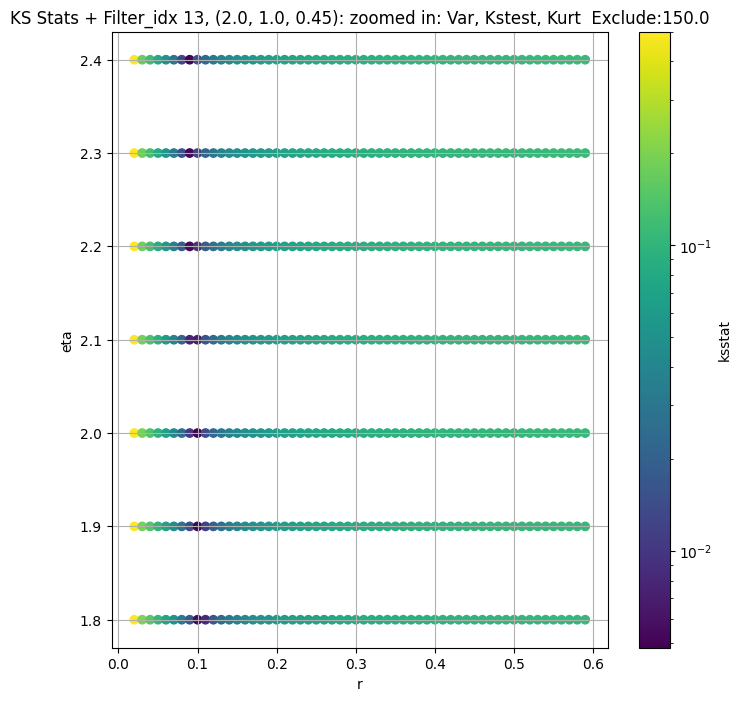

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 50.0 + 100 = 150, ksstat: 0.0026985137626347327, var: 24.648868560791016


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 50.0 + 75 = 125, ksstat: 0.00203093401829447, var: 25.285459518432617


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 50.0 + 50 = 100, ksstat: 0.0015877084328151693, var: 26.038227081298828


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 50.0 + 25 = 75, ksstat: 0.00119150426583281, var: 26.96485710144043


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 50.0 + 0 = 50, ksstat: 0.0013509554028307003, var: 28.17705726623535


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 50.0 + -25 = 25, ksstat: 0.003021627994006598, var: 29.960243225097656


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 14, 50.0 + -50 = 0, ksstat: 0.007660618650531581, var: 36.486637115478516
Number of samples: 100000, Without approximation : 262144000.0


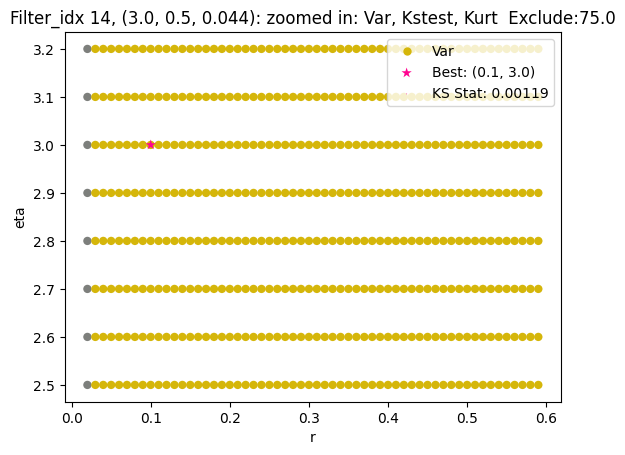

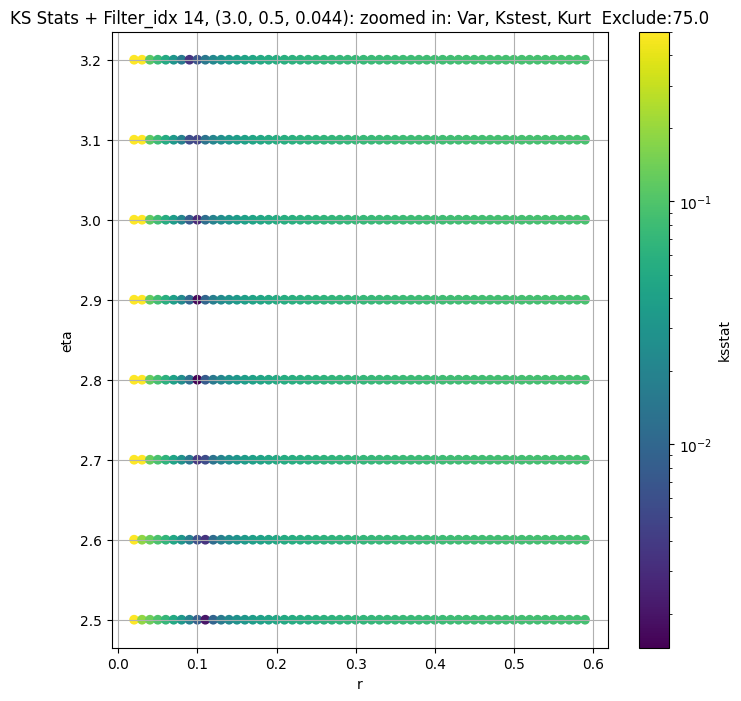

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 100 = 200, ksstat: 0.004108204971920881, var: 14.111276626586914


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 75 = 175, ksstat: 0.0033418789239165747, var: 14.433618545532227


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 50 = 150, ksstat: 0.00257655556065417, var: 14.80428409576416


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 25 = 125, ksstat: 0.002008526863085225, var: 15.243295669555664


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + 0 = 100, ksstat: 0.001938895750022429, var: 15.786083221435547


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -25 = 75, ksstat: 0.0016991143035380851, var: 16.50342559814453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -50 = 50, ksstat: 0.0024721506299077295, var: 17.57402992248535


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -75 = 25, ksstat: 0.004863892873194886, var: 19.68024253845215


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 15, 100.0 + -100 = 0, ksstat: 0.019069545035297675, var: 39.03885269165039
Number of samples: 100000, Without approximation : 262144000.0


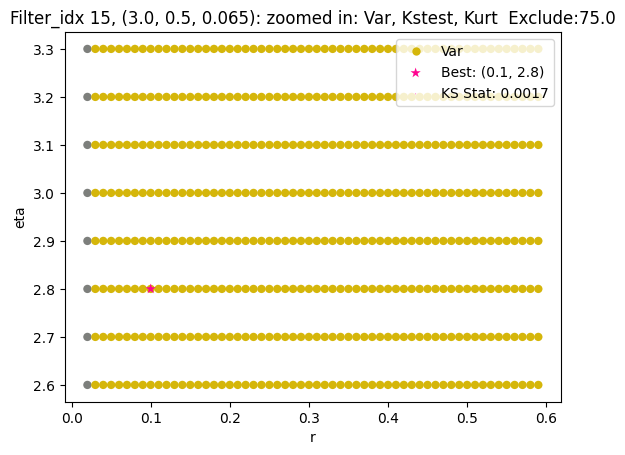

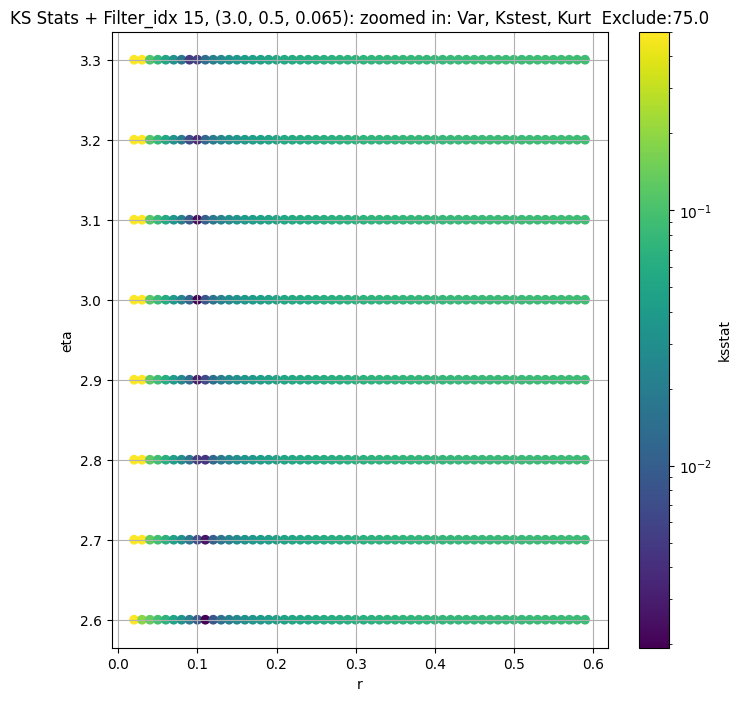

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + 100 = 200, ksstat: 0.002677480011693101, var: 11.621896743774414


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + 75 = 175, ksstat: 0.0022833446319942504, var: 11.978797912597656


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + 50 = 150, ksstat: 0.002046361326912515, var: 12.394659042358398


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + 25 = 125, ksstat: 0.0018332029116466808, var: 12.891410827636719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + 0 = 100, ksstat: 0.001593773030082235, var: 13.513223648071289


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + -25 = 75, ksstat: 0.0034447045971159745, var: 14.386983871459961


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + -50 = 50, ksstat: 0.005552323771841894, var: 16.019567489624023


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + -75 = 25, ksstat: 0.012973147667975138, var: 22.08226776123047


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 16, 100.0 + -100 = 0, ksstat: 0.026038005102284822, var: 48.49372482299805
Number of samples: 100000, Without approximation : 262144000.0


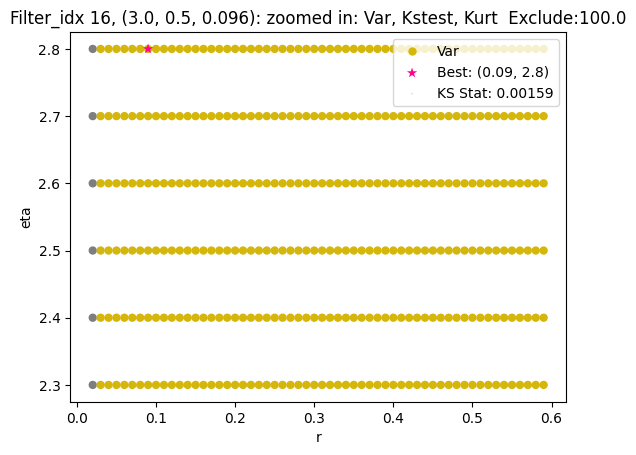

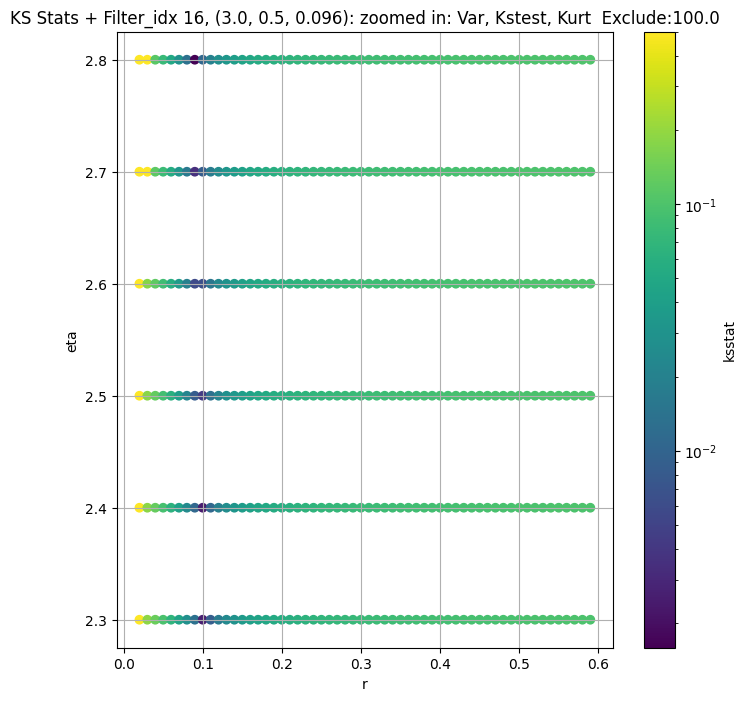

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + 100 = 200, ksstat: 0.003941299272940069, var: 5.051420211791992


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + 75 = 175, ksstat: 0.003353831739706048, var: 5.183723449707031


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + 50 = 150, ksstat: 0.0025957118200991246, var: 5.339313507080078


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + 25 = 125, ksstat: 0.0020092985584359013, var: 5.53078556060791


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + 0 = 100, ksstat: 0.0016280689250152136, var: 5.787230491638184


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + -25 = 75, ksstat: 0.002052327357780978, var: 6.185370445251465


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + -50 = 50, ksstat: 0.004720441475867865, var: 6.941456317901611


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + -75 = 25, ksstat: 0.010106516663718437, var: 8.944605827331543


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 17, 100.0 + -100 = 0, ksstat: 0.02572856336403606, var: 21.71746253967285
Number of samples: 100000, Without approximation : 262144000.0


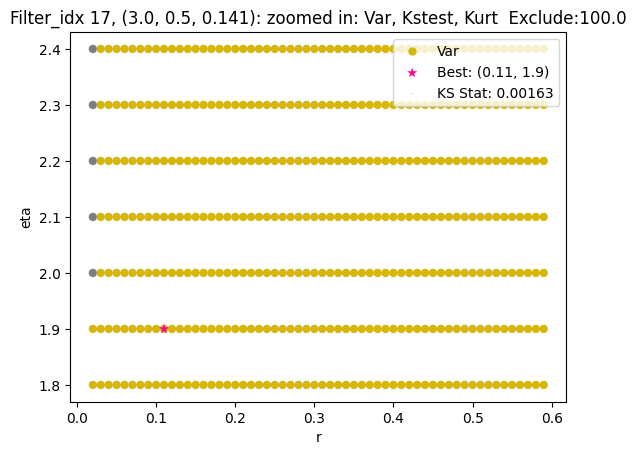

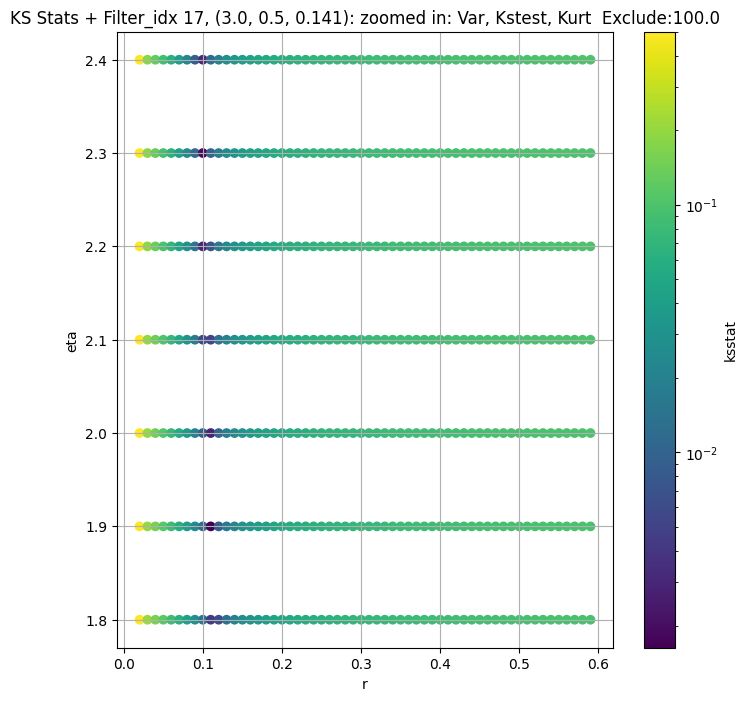

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 100 = 300, ksstat: 0.006007986487139478, var: 1.409811019897461


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 75 = 275, ksstat: 0.005473902724750235, var: 1.4376134872436523


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 50 = 250, ksstat: 0.005104705855316874, var: 1.4678254127502441


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 25 = 225, ksstat: 0.004603804298147052, var: 1.5009533166885376


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + 0 = 200, ksstat: 0.00407926975245132, var: 1.537668228149414


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -25 = 175, ksstat: 0.0035935273997141914, var: 1.5789543390274048


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -50 = 150, ksstat: 0.003097024810765056, var: 1.6262907981872559


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -75 = 125, ksstat: 0.0027406403763134413, var: 1.681991696357727


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 18, 200.0 + -100 = 100, ksstat: 0.003919786017966942, var: 1.7501375675201416
Number of samples: 100000, Without approximation : 262144000.0


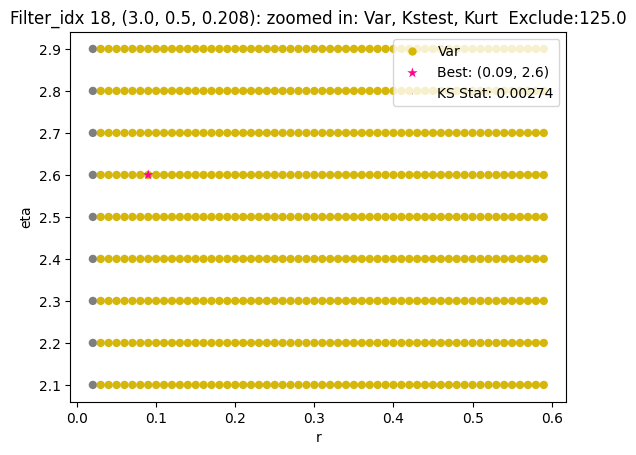

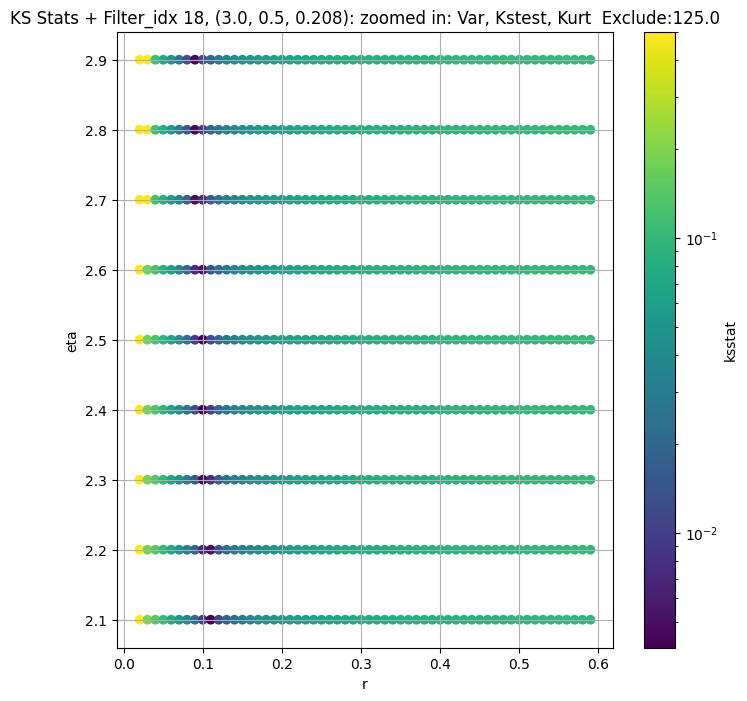

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 100 = 300, ksstat: 0.005804121186839317, var: 0.3043486475944519


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 75 = 275, ksstat: 0.0054082351040629535, var: 0.3123546242713928


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 50 = 250, ksstat: 0.0055206923888951875, var: 0.32125672698020935


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 25 = 225, ksstat: 0.005554660016008656, var: 0.33128002285957336


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + 0 = 200, ksstat: 0.005811866583667502, var: 0.3427283465862274


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -25 = 175, ksstat: 0.006457874883722181, var: 0.3560177683830261


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -50 = 150, ksstat: 0.0073841331148533085, var: 0.37177568674087524


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -75 = 125, ksstat: 0.008683285649981914, var: 0.3909296989440918


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 200.0 + -100 = 100, ksstat: 0.00947761516261747, var: 0.41494280099868774
Number of samples: 100000, Without approximation : 262144000.0


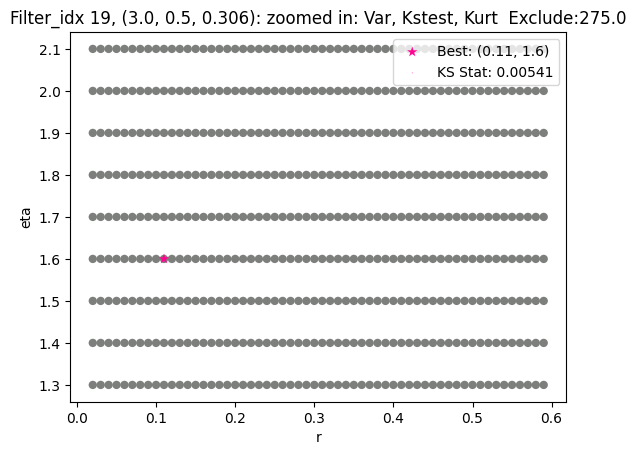

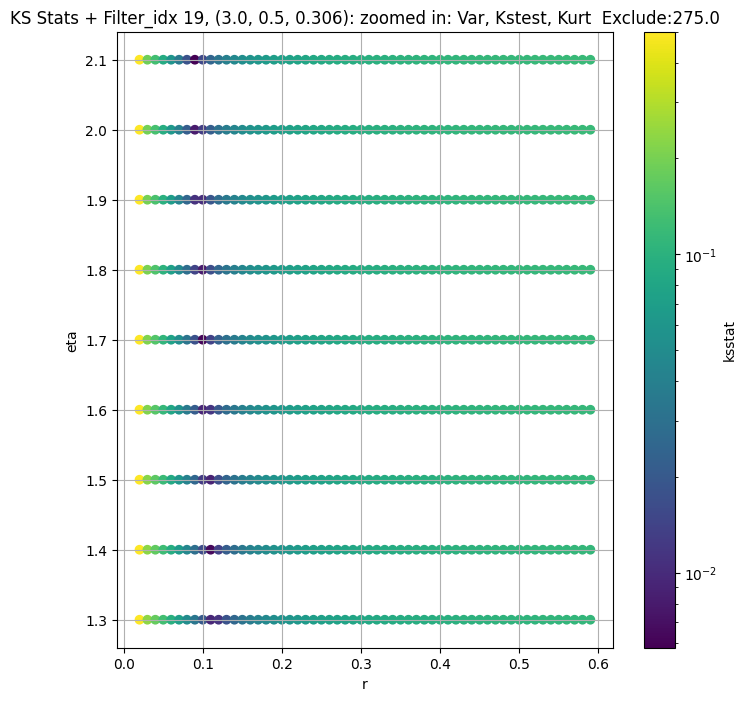

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 100 = 300, ksstat: 0.006426682217656632, var: 0.06993293017148972


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 75 = 275, ksstat: 0.006099578425746044, var: 0.07154888659715652


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 50 = 250, ksstat: 0.006566803221158296, var: 0.07330907136201859


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 25 = 225, ksstat: 0.006425656359533405, var: 0.0752464085817337


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + 0 = 200, ksstat: 0.006849560368376029, var: 0.07740635424852371


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -25 = 175, ksstat: 0.007861593839828651, var: 0.07985366880893707


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -50 = 150, ksstat: 0.007825527840627067, var: 0.08268960565328598


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -75 = 125, ksstat: 0.008876578621429765, var: 0.08607985824346542


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 20, 200.0 + -100 = 100, ksstat: 0.009797640735200397, var: 0.09032300859689713
Number of samples: 100000, Without approximation : 262144000.0


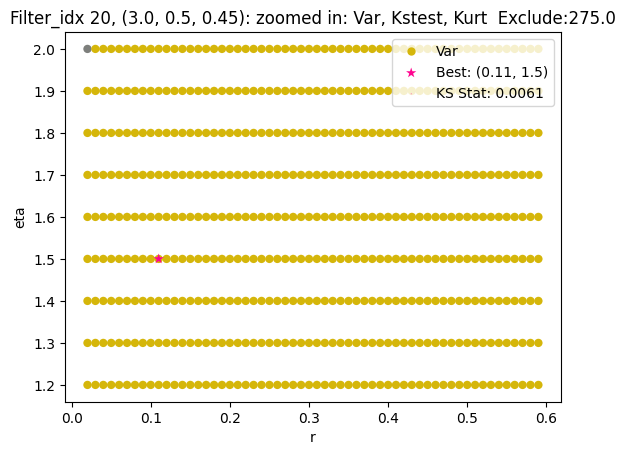

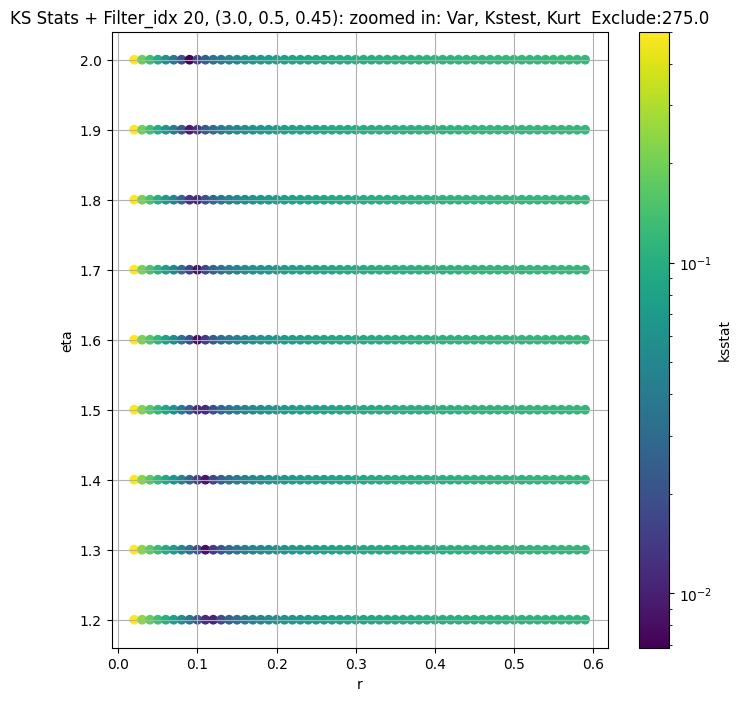

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 100 = 300, ksstat: 0.003996169161212038, var: 29.248485565185547


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 75 = 275, ksstat: 0.00359451875068284, var: 29.964847564697266


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 50 = 250, ksstat: 0.003259704806961583, var: 30.77225685119629


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 25 = 225, ksstat: 0.0029542954322911985, var: 31.695777893066406


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + 0 = 200, ksstat: 0.0026759001460288224, var: 32.77142333984375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -25 = 175, ksstat: 0.002424016342223792, var: 34.05055618286133


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -50 = 150, ksstat: 0.0026809648655146123, var: 35.611751556396484


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -75 = 125, ksstat: 0.0042191328154856655, var: 37.57802963256836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 21, 200.0 + -100 = 100, ksstat: 0.0053671811298237615, var: 40.15679931640625
Number of samples: 100000, Without approximation : 262144000.0


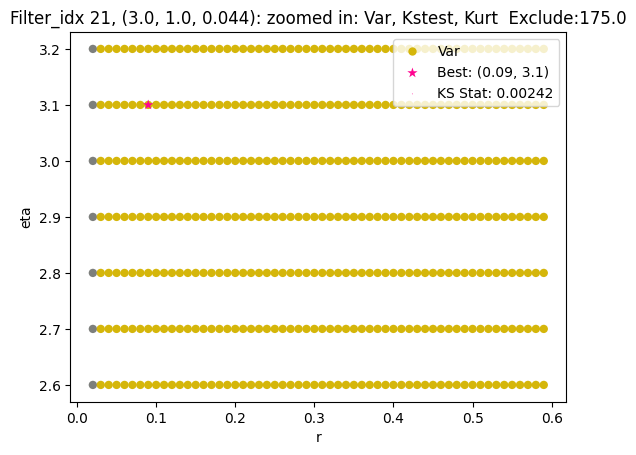

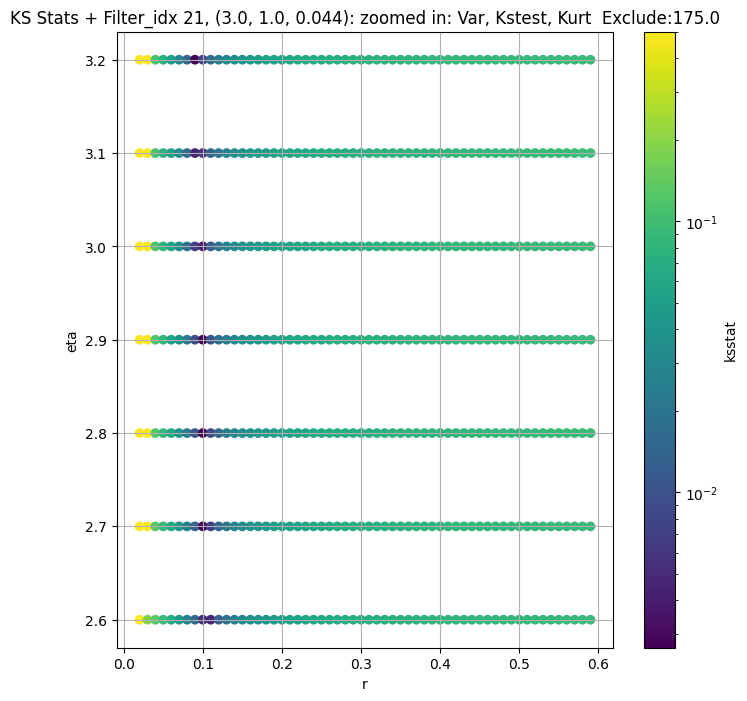

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 100 = 200, ksstat: 0.0033912321692784117, var: 14.413549423217773


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 75 = 175, ksstat: 0.002762409107698205, var: 14.74570083618164


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 50 = 150, ksstat: 0.0021900544826578897, var: 15.129793167114258


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 25 = 125, ksstat: 0.001774316517262342, var: 15.586543083190918


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + 0 = 100, ksstat: 0.0014474828052921662, var: 16.15127182006836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -25 = 75, ksstat: 0.0014362574971240744, var: 16.89322280883789


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -50 = 50, ksstat: 0.0032546336875440424, var: 17.97439193725586


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -75 = 25, ksstat: 0.0056676340012845605, var: 19.903188705444336


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 22, 100.0 + -100 = 0, ksstat: 0.017497036871190752, var: 33.6389045715332
Number of samples: 100000, Without approximation : 262144000.0


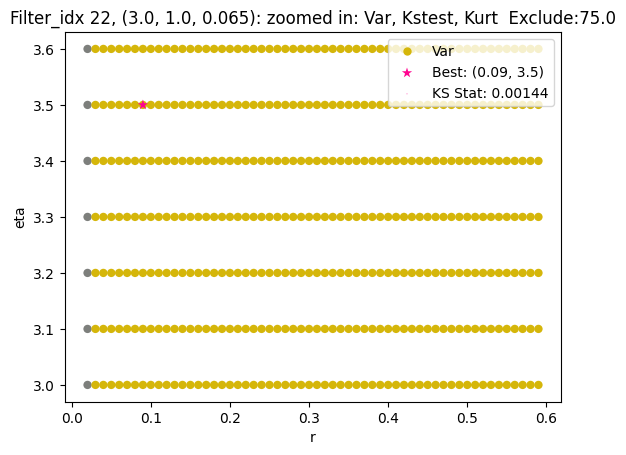

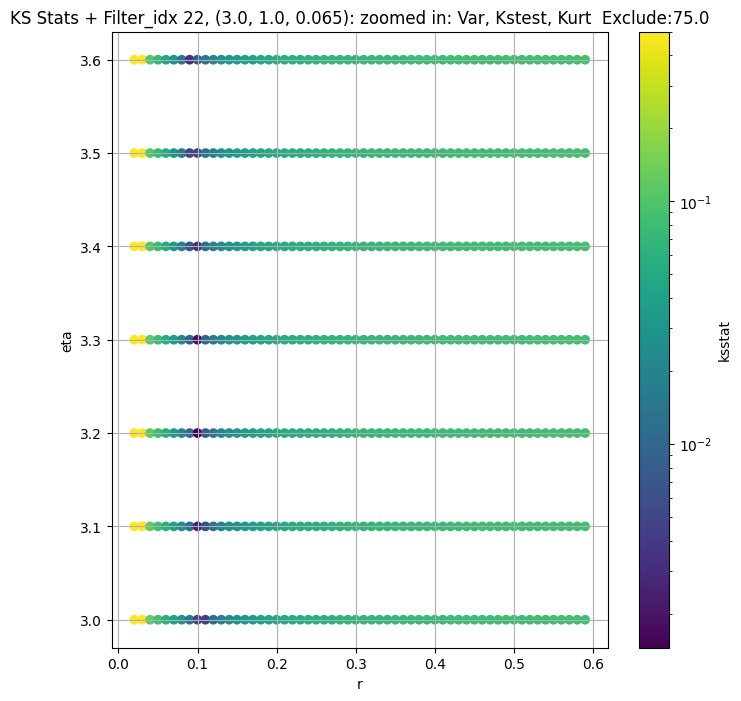

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 100 = 200, ksstat: 0.004419961088275137, var: 9.894792556762695


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 75 = 175, ksstat: 0.003642970819791369, var: 10.150060653686523


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 50 = 150, ksstat: 0.0027482283928882134, var: 10.455305099487305


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 25 = 125, ksstat: 0.0019059434956768054, var: 10.837211608886719


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + 0 = 100, ksstat: 0.001276117658426501, var: 11.344837188720703


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -25 = 75, ksstat: 0.0011707977472567022, var: 12.070456504821777


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -50 = 50, ksstat: 0.0032038201397399935, var: 13.234171867370605


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -75 = 25, ksstat: 0.007084235187621246, var: 15.887849807739258


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 23, 100.0 + -100 = 0, ksstat: 0.027526445574502185, var: 50.23435974121094
Number of samples: 100000, Without approximation : 262144000.0


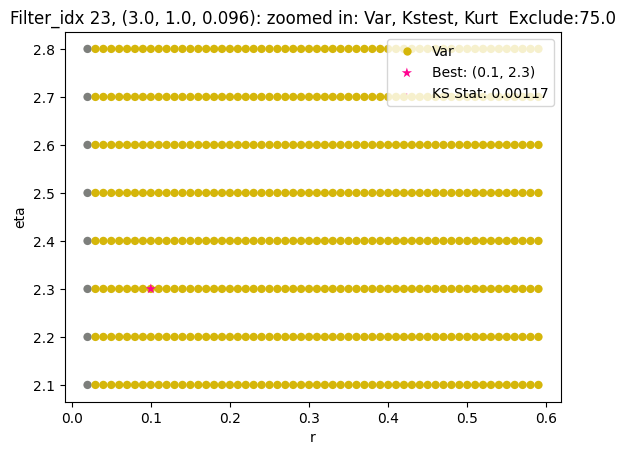

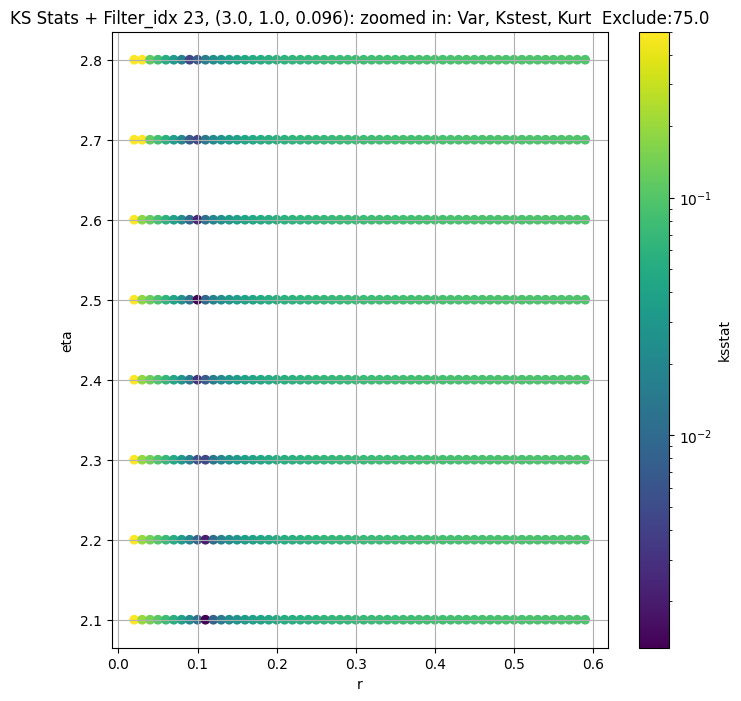

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 100 = 200, ksstat: 0.004106606637198688, var: 5.452193737030029


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 75 = 175, ksstat: 0.0036463224963659106, var: 5.579987049102783


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 50 = 150, ksstat: 0.0032296662786762687, var: 5.720963954925537


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 25 = 125, ksstat: 0.0027532335351362694, var: 5.878324508666992


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + 0 = 100, ksstat: 0.002282037648547222, var: 6.057009220123291


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -25 = 75, ksstat: 0.0020823752862068057, var: 6.2648186683654785


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -50 = 50, ksstat: 0.0032575835630265226, var: 6.516046047210693


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -75 = 25, ksstat: 0.004221610186155633, var: 6.846137046813965


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 24, 100.0 + -100 = 0, ksstat: 0.006033506744191897, var: 7.629308700561523
Number of samples: 100000, Without approximation : 262144000.0


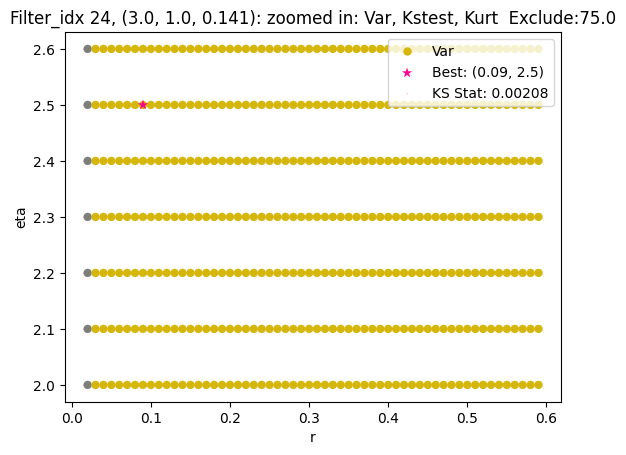

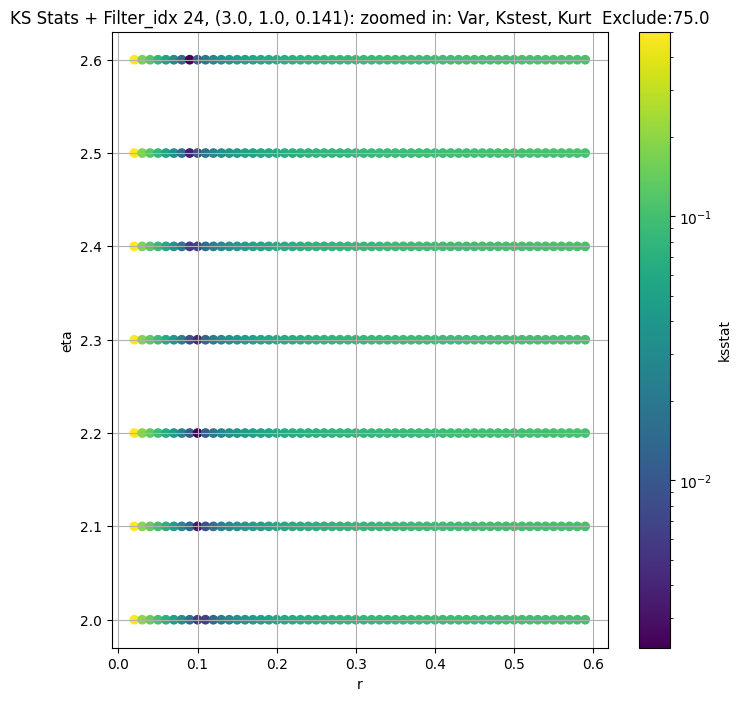

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + 100 = 200, ksstat: 0.004964365845449889, var: 1.831998348236084


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + 75 = 175, ksstat: 0.004500376659549724, var: 1.8730144500732422


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + 50 = 150, ksstat: 0.004094788155880824, var: 1.918547511100769


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + 25 = 125, ksstat: 0.003562466220838889, var: 1.9699593782424927


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + 0 = 100, ksstat: 0.0031269608835685636, var: 2.029426336288452


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + -25 = 75, ksstat: 0.0031720754618195512, var: 2.100938320159912


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + -50 = 50, ksstat: 0.004415915924701697, var: 2.193286180496216


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + -75 = 25, ksstat: 0.005069838238948993, var: 2.3373711109161377


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 100.0 + -100 = 0, ksstat: 0.008444899539193348, var: 2.8048593997955322
Number of samples: 100000, Without approximation : 262144000.0


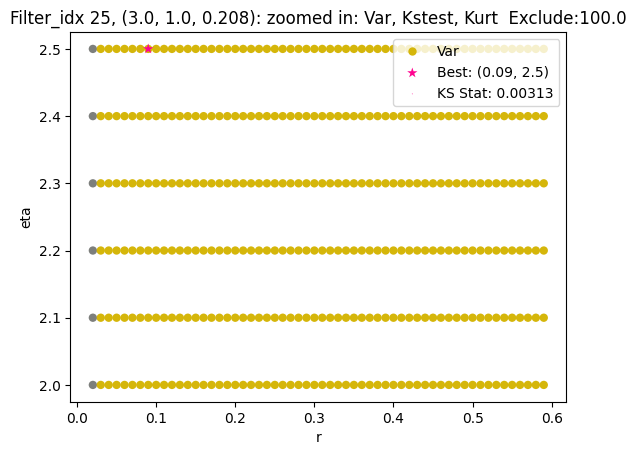

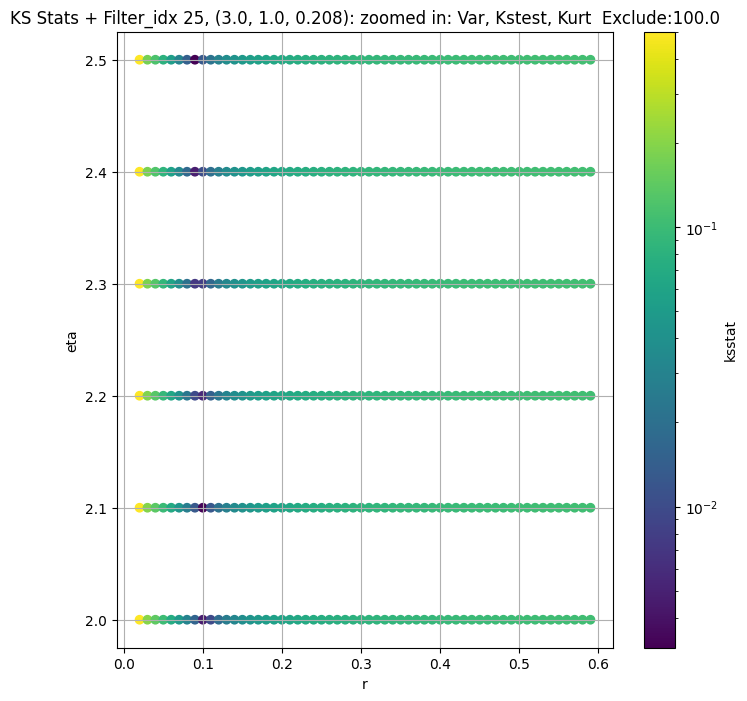

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 100 = 200, ksstat: 0.0051359900885609155, var: 0.4594740569591522


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 75 = 175, ksstat: 0.0045580123035889875, var: 0.4729001224040985


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 50 = 150, ksstat: 0.003949054229780376, var: 0.4889224171638489


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 25 = 125, ksstat: 0.0041746148792746185, var: 0.5091040730476379


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 0 = 100, ksstat: 0.004906292124475575, var: 0.5368033051490784


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -25 = 75, ksstat: 0.006100547596419759, var: 0.580030620098114


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -50 = 50, ksstat: 0.008382255722854781, var: 0.6573382616043091


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -75 = 25, ksstat: 0.011297792635934112, var: 0.814045786857605


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -100 = 0, ksstat: 0.022039025442552332, var: 1.692082166671753
Number of samples: 100000, Without approximation : 262144000.0


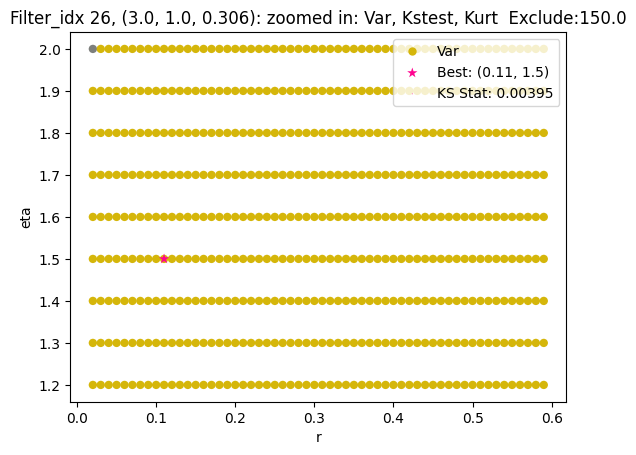

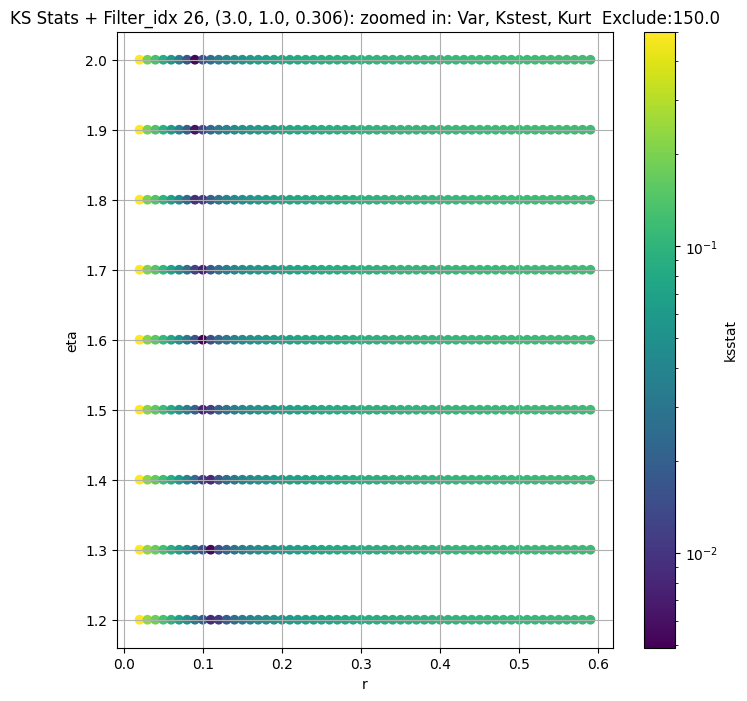

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 100 = 300, ksstat: 0.006537584760235249, var: 0.06689324229955673


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 75 = 275, ksstat: 0.006238408556793806, var: 0.06823717802762985


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 50 = 250, ksstat: 0.005904857307298839, var: 0.06968013197183609


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 25 = 225, ksstat: 0.005421417407171614, var: 0.07123961299657822


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + 0 = 200, ksstat: 0.005366289716809913, var: 0.07293955981731415


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -25 = 175, ksstat: 0.005728432242243897, var: 0.07481247186660767


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -50 = 150, ksstat: 0.006714207251443116, var: 0.07690352946519852


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -75 = 125, ksstat: 0.007501905434750045, var: 0.0792829617857933


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 27, 200.0 + -100 = 100, ksstat: 0.007822758375506611, var: 0.08206380903720856
Number of samples: 100000, Without approximation : 262144000.0


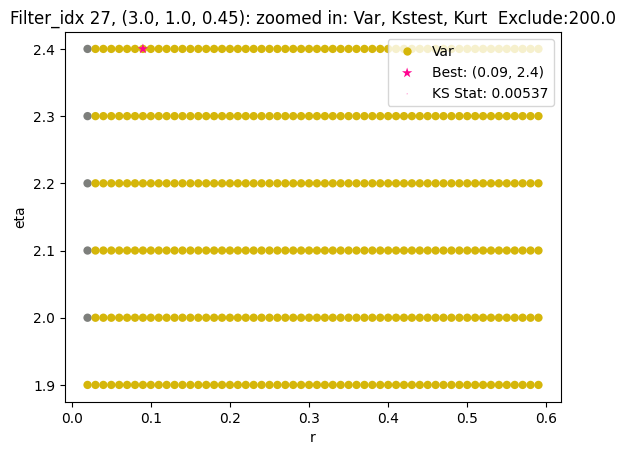

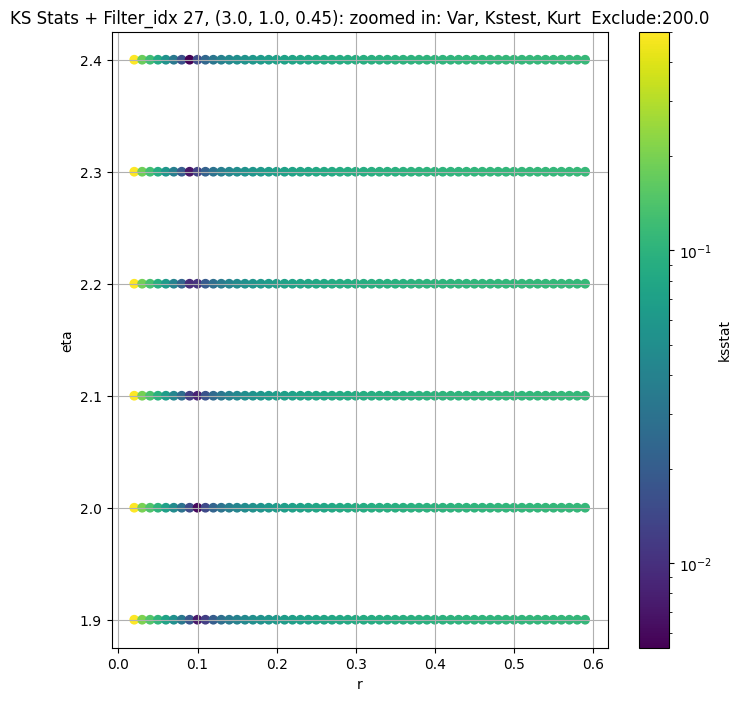

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 100 = 200, ksstat: 0.003586967365804994, var: 27.57576560974121


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 75 = 175, ksstat: 0.003096449085510933, var: 28.2717227935791


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 50 = 150, ksstat: 0.002552246597035235, var: 29.07819938659668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 25 = 125, ksstat: 0.0024699094222354057, var: 30.0380859375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + 0 = 100, ksstat: 0.002082481594294805, var: 31.223243713378906


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -25 = 75, ksstat: 0.002013297708712225, var: 32.75431823730469


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -50 = 50, ksstat: 0.00288435547418886, var: 34.87731170654297


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -75 = 25, ksstat: 0.005119124209295833, var: 38.36311340332031


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 28, 100.0 + -100 = 0, ksstat: 0.016301567734402708, var: 64.19461059570312
Number of samples: 100000, Without approximation : 262144000.0


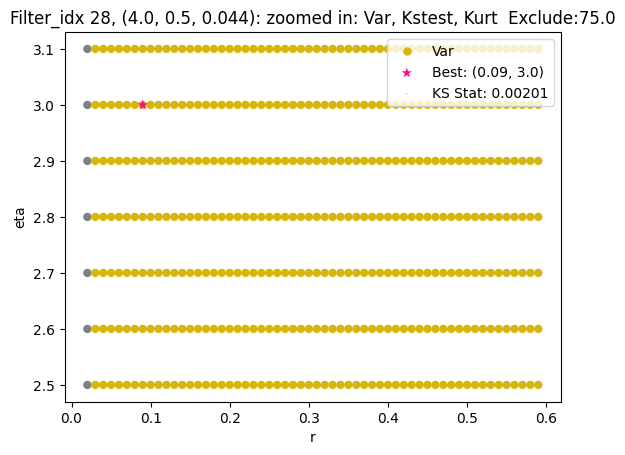

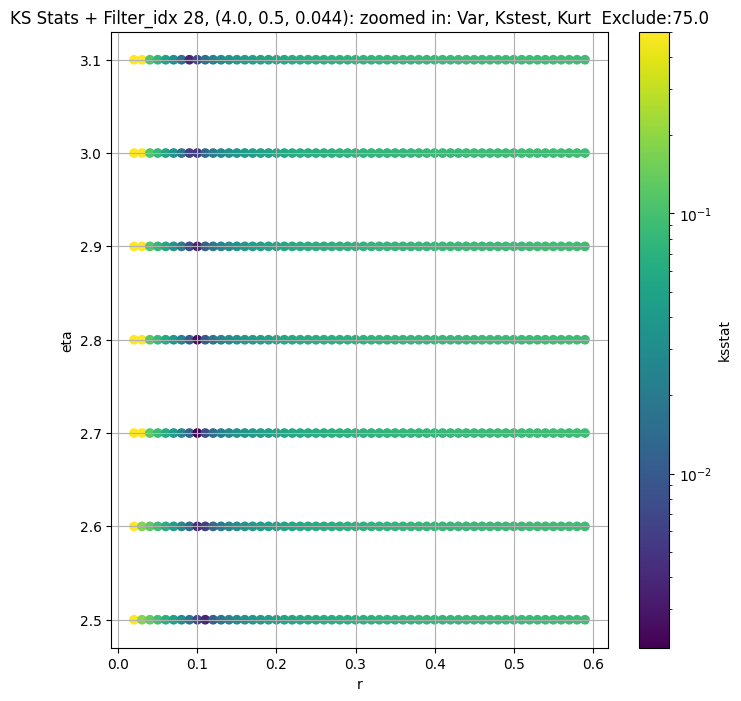

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 100 = 200, ksstat: 0.002870977722225554, var: 13.306922912597656


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 75 = 175, ksstat: 0.0022892459618777394, var: 13.651654243469238


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 50 = 150, ksstat: 0.001937276942404642, var: 14.061885833740234


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 25 = 125, ksstat: 0.001661204919142678, var: 14.566057205200195


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + 0 = 100, ksstat: 0.0014377178802210677, var: 15.212207794189453


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -25 = 75, ksstat: 0.002618713930972301, var: 16.09482192993164


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -50 = 50, ksstat: 0.00464131662729228, var: 17.448177337646484


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -75 = 25, ksstat: 0.008308048364332223, var: 20.024999618530273


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 29, 100.0 + -100 = 0, ksstat: 0.01988419951901948, var: 34.89331817626953
Number of samples: 100000, Without approximation : 262144000.0


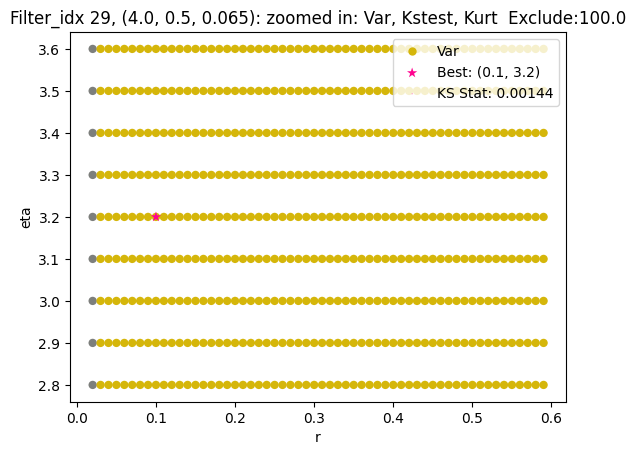

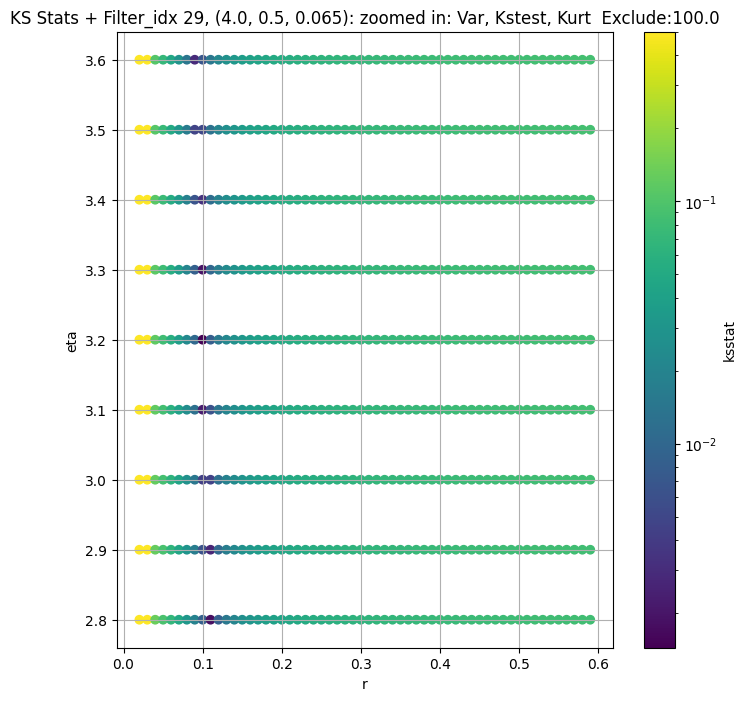

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 100 = 200, ksstat: 0.0036469105172158844, var: 10.472125053405762


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 75 = 175, ksstat: 0.003137276538188294, var: 10.758867263793945


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 50 = 150, ksstat: 0.002654836745235095, var: 11.093276977539062


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 25 = 125, ksstat: 0.002123924087260807, var: 11.494852066040039


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + 0 = 100, ksstat: 0.0016296357388503324, var: 11.995611190795898


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -25 = 75, ksstat: 0.002755192480663124, var: 12.6661958694458


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -50 = 50, ksstat: 0.004615945305906005, var: 13.70230484008789


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -75 = 25, ksstat: 0.007604339933194981, var: 15.782979011535645


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 30, 100.0 + -100 = 0, ksstat: 0.018774677000452544, var: 29.146175384521484
Number of samples: 100000, Without approximation : 262144000.0


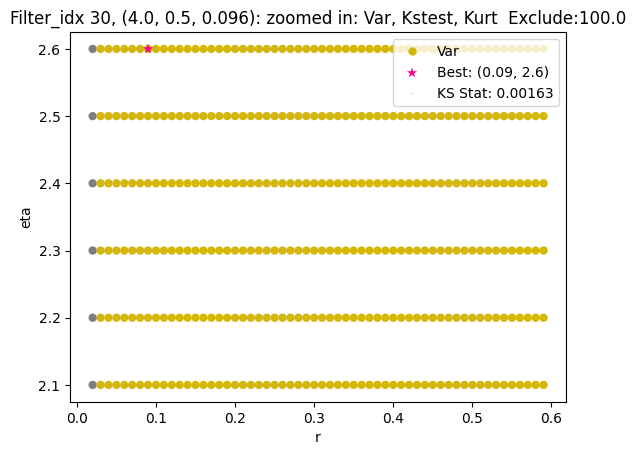

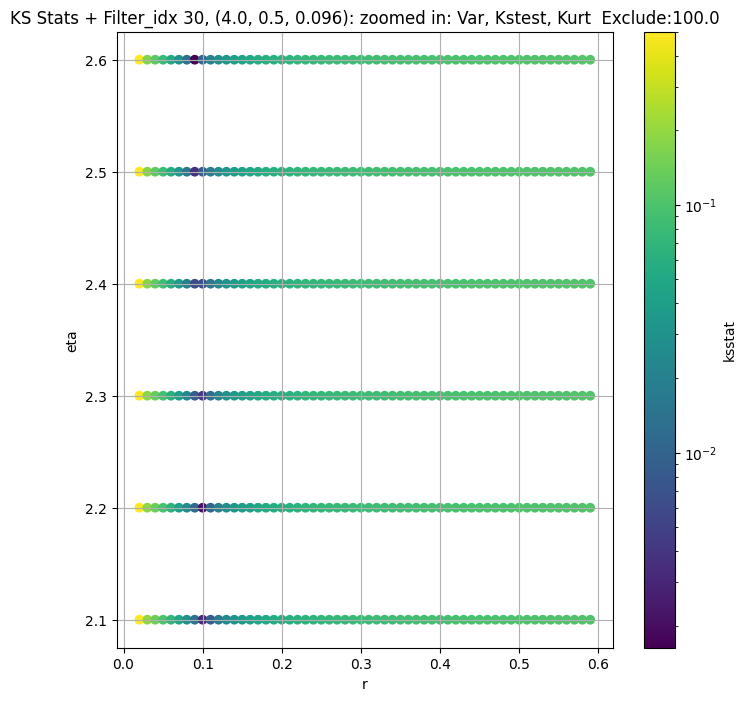

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + 100 = 200, ksstat: 0.004538955434525909, var: 5.4333815574646


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + 75 = 175, ksstat: 0.004057018278976414, var: 5.558197498321533


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + 50 = 150, ksstat: 0.0036270400650268986, var: 5.697285175323486


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + 25 = 125, ksstat: 0.003081750422466698, var: 5.854369640350342


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + 0 = 100, ksstat: 0.002522705925234958, var: 6.034707069396973


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + -25 = 75, ksstat: 0.0020479918106340866, var: 6.245814323425293


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + -50 = 50, ksstat: 0.00302256970952941, var: 6.498730659484863


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + -75 = 25, ksstat: 0.0034648112430185063, var: 6.81783390045166


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 31, 100.0 + -100 = 0, ksstat: 0.005357390615505886, var: 7.572037696838379
Number of samples: 100000, Without approximation : 262144000.0


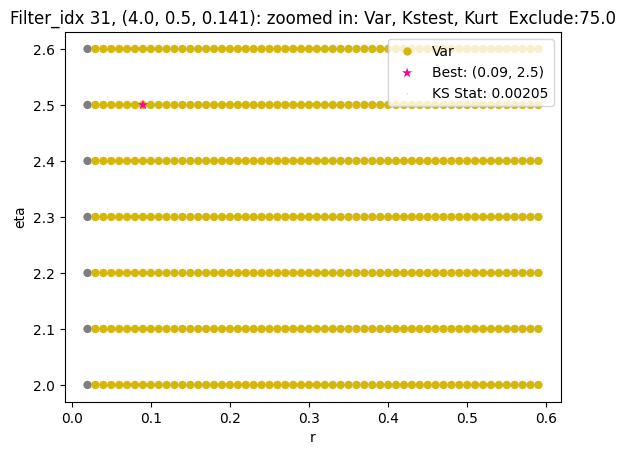

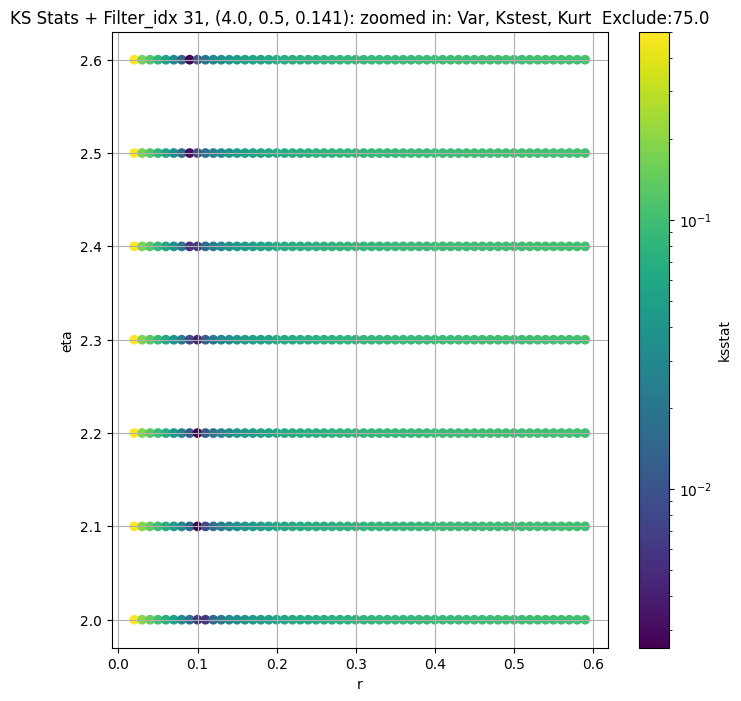

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 100 = 300, ksstat: 0.005150184029436566, var: 1.2342190742492676


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 75 = 275, ksstat: 0.0047226618666856846, var: 1.2653454542160034


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 50 = 250, ksstat: 0.004315581022167609, var: 1.2998627424240112


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 25 = 225, ksstat: 0.004479164746237663, var: 1.3385964632034302


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + 0 = 200, ksstat: 0.00484102059313285, var: 1.382667064666748


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -25 = 175, ksstat: 0.005317679300827022, var: 1.4337184429168701


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -50 = 150, ksstat: 0.006573089555590134, var: 1.494126319885254


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -75 = 125, ksstat: 0.007897174424250974, var: 1.567717432975769


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 32, 200.0 + -100 = 100, ksstat: 0.008620028700493512, var: 1.6608476638793945
Number of samples: 100000, Without approximation : 262144000.0


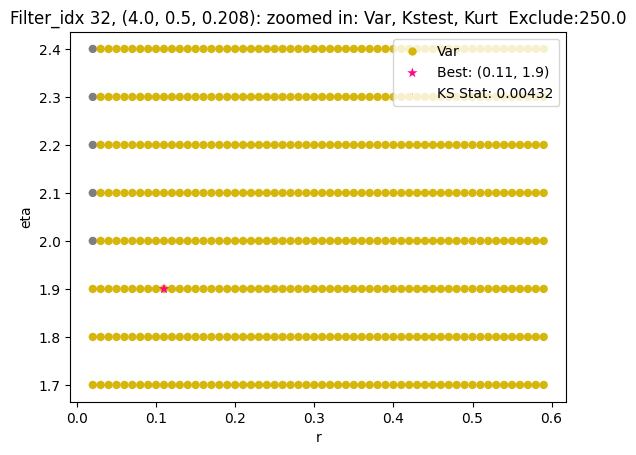

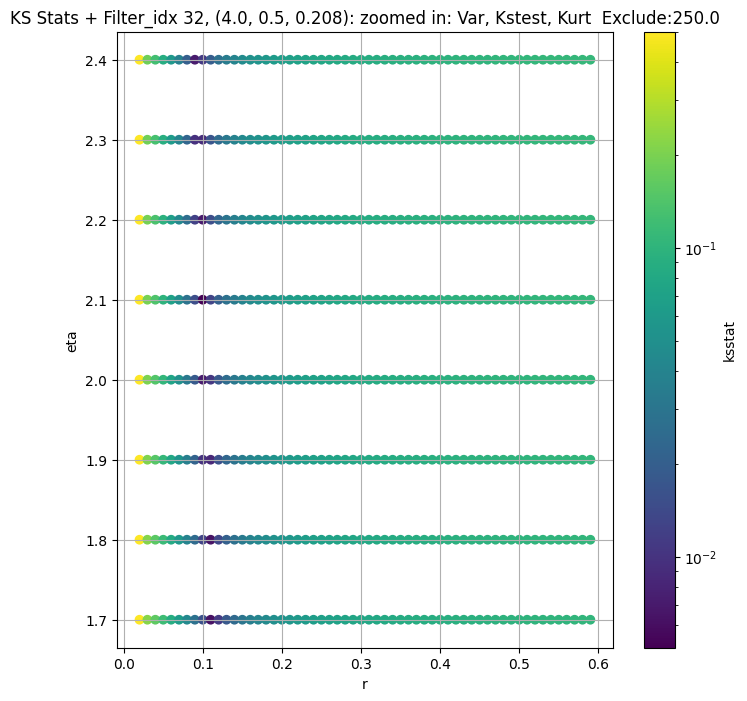

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 100 = 300, ksstat: 0.006508482586004671, var: 0.31205153465270996


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 75 = 275, ksstat: 0.0061231749143944025, var: 0.3204648196697235


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 50 = 250, ksstat: 0.005832824194259567, var: 0.32977500557899475


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 25 = 225, ksstat: 0.00576937471605532, var: 0.34021419286727905


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + 0 = 200, ksstat: 0.006838963987726987, var: 0.35210999846458435


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -25 = 175, ksstat: 0.007905296136264228, var: 0.36598920822143555


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -50 = 150, ksstat: 0.008462498636796933, var: 0.3827399015426636


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -75 = 125, ksstat: 0.009235898909372237, var: 0.4039804935455322


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 200.0 + -100 = 100, ksstat: 0.00998214193828384, var: 0.4328976273536682
Number of samples: 100000, Without approximation : 262144000.0


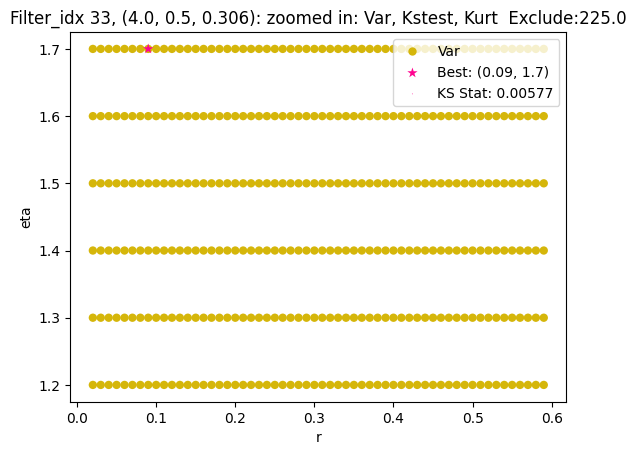

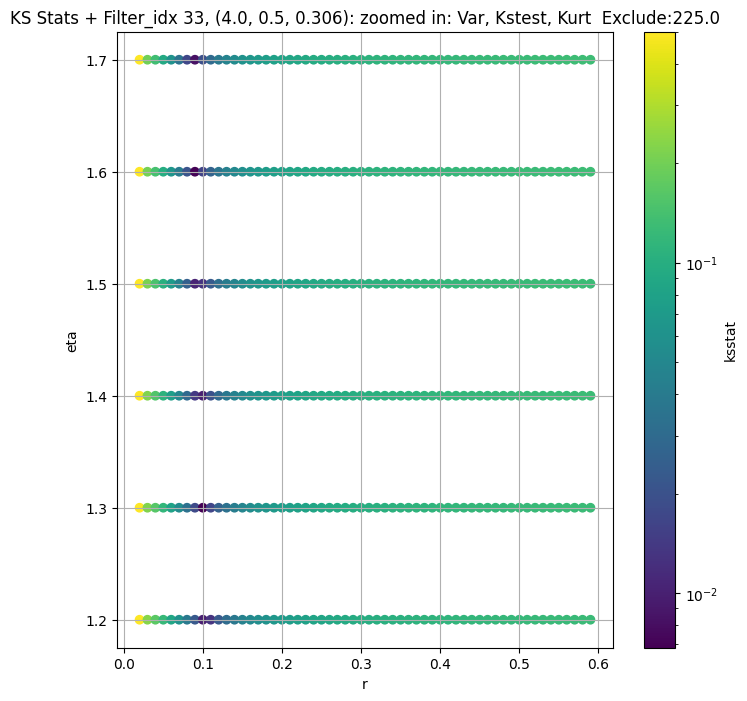

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 100 = 300, ksstat: 0.009280338008265443, var: 0.03901226818561554


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 75 = 275, ksstat: 0.008889785364760039, var: 0.03988621383905411


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 50 = 250, ksstat: 0.009121273467632252, var: 0.04082339257001877


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 25 = 225, ksstat: 0.009826714309764006, var: 0.04183494672179222


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + 0 = 200, ksstat: 0.009686316581067889, var: 0.04293525591492653


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -25 = 175, ksstat: 0.01068356955652694, var: 0.04414305090904236


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -50 = 150, ksstat: 0.01093330428904149, var: 0.045484792441129684


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -75 = 125, ksstat: 0.01160773438649998, var: 0.047002002596855164


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 34, 200.0 + -100 = 100, ksstat: 0.012921160656813535, var: 0.048759687691926956
Number of samples: 100000, Without approximation : 262144000.0


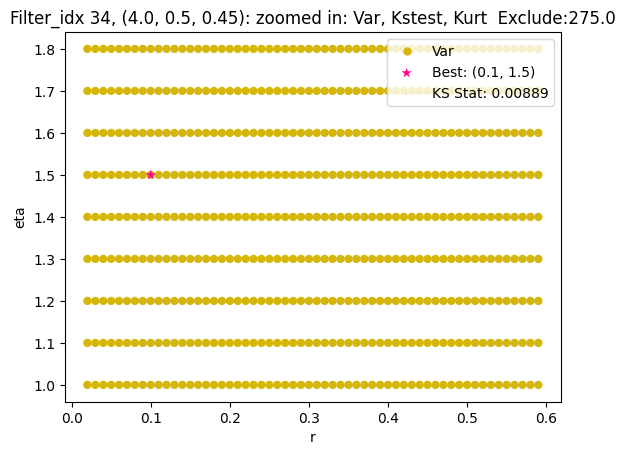

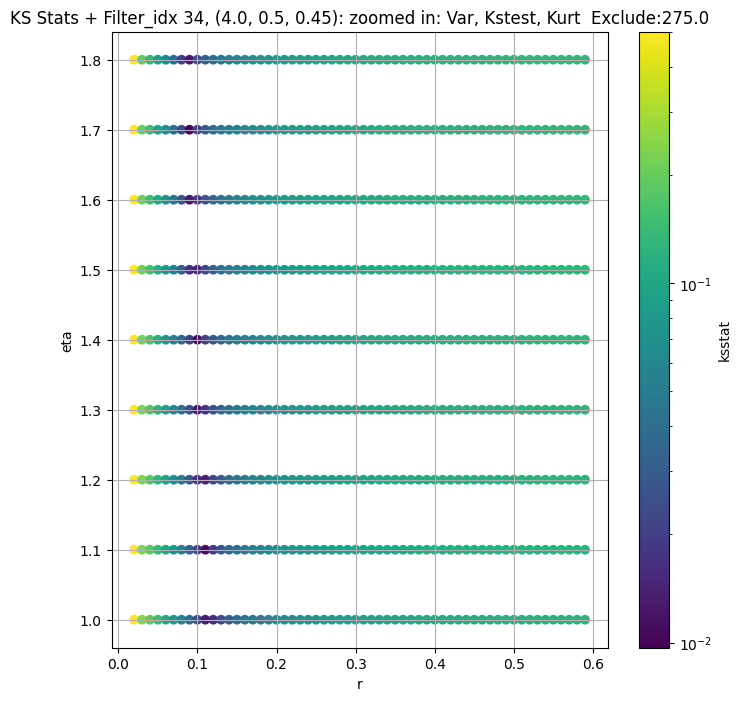

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + 100 = 300, ksstat: 0.004293268720180321, var: 24.695953369140625


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + 75 = 275, ksstat: 0.00396677796582837, var: 25.19297218322754


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + 50 = 250, ksstat: 0.003616852810774729, var: 25.740507125854492


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + 25 = 225, ksstat: 0.0032563284056617015, var: 26.351390838623047


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + 0 = 200, ksstat: 0.0029247393221925044, var: 27.0430965423584


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + -25 = 175, ksstat: 0.0029375078284291645, var: 27.84100341796875


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + -50 = 150, ksstat: 0.003199167940565961, var: 28.785037994384766


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + -75 = 125, ksstat: 0.00413573515925636, var: 29.945964813232422


  0%|          | 0/690 [00:00<?, ?it/s]

Finding Minimum after computing 690 CDFs
filter_idx 35, 200.0 + -100 = 100, ksstat: 0.005020782113361211, var: 31.45834732055664
Number of samples: 100000, Without approximation : 262144000.0


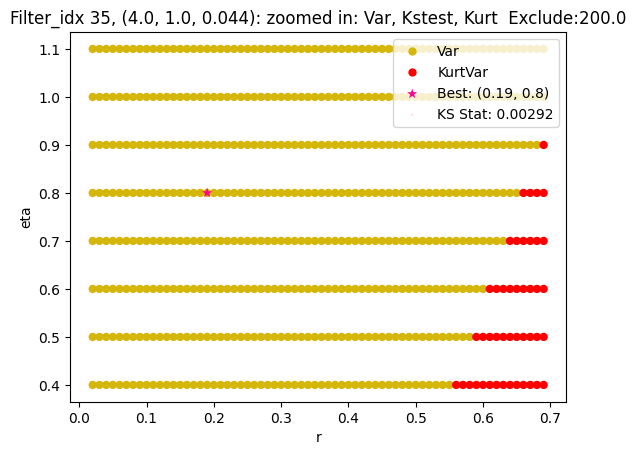

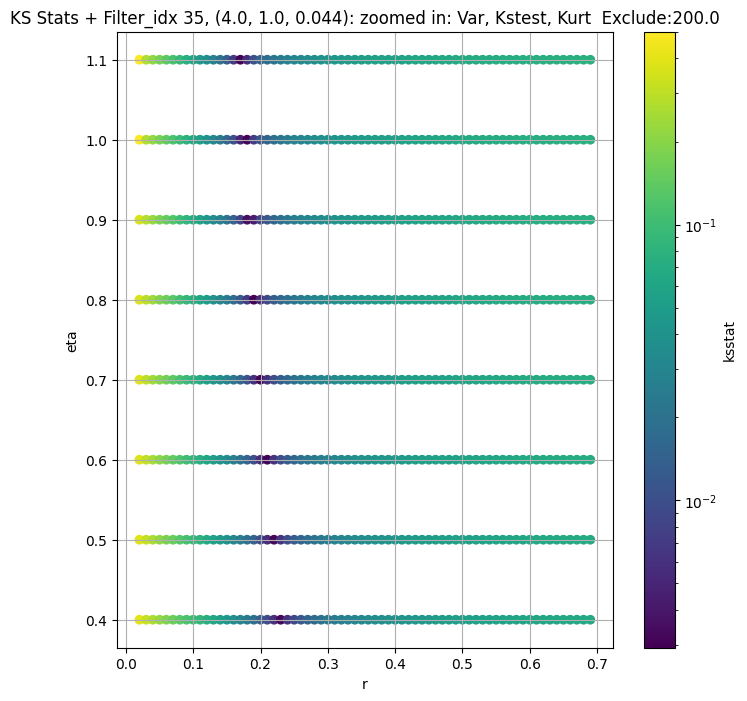

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 100 = 200, ksstat: 0.00304134177992834, var: 13.339587211608887


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 75 = 175, ksstat: 0.0023984690910428333, var: 13.700529098510742


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 50 = 150, ksstat: 0.002195620291365219, var: 14.139060020446777


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 25 = 125, ksstat: 0.001827448482081051, var: 14.698002815246582


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + 0 = 100, ksstat: 0.002055263437194643, var: 15.454541206359863


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -25 = 75, ksstat: 0.003339868210210137, var: 16.58013343811035


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -50 = 50, ksstat: 0.006047420263349701, var: 18.489383697509766


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -75 = 25, ksstat: 0.01053828928682321, var: 22.43621826171875


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 36, 100.0 + -100 = 0, ksstat: 0.023894637381975614, var: 44.40796661376953
Number of samples: 100000, Without approximation : 262144000.0


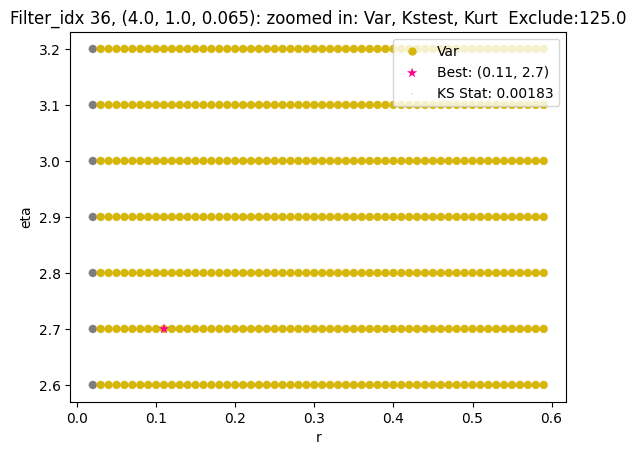

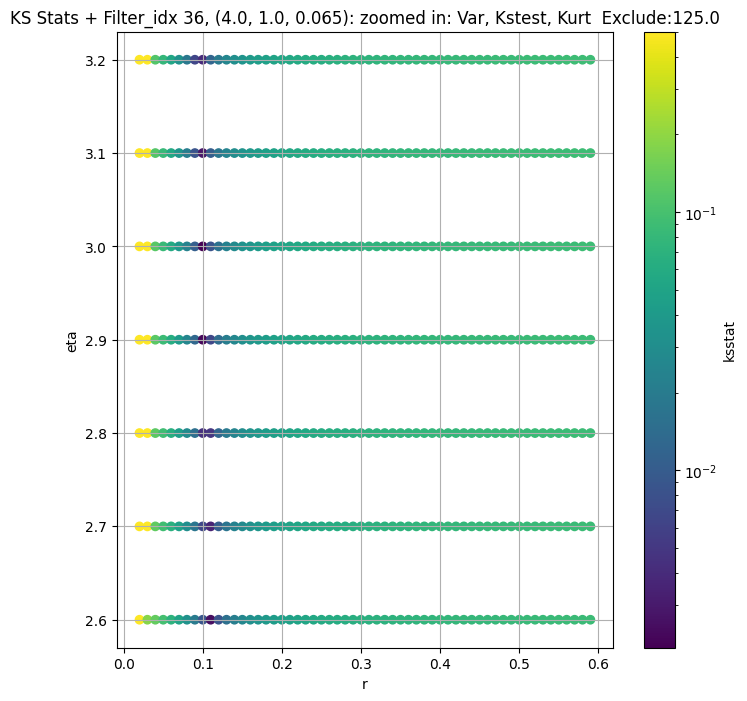

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 100 = 300, ksstat: 0.005073712391882496, var: 9.533679962158203


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 75 = 275, ksstat: 0.004703182721652479, var: 9.725560188293457


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 50 = 250, ksstat: 0.004323381373460222, var: 9.93308162689209


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 25 = 225, ksstat: 0.0039299733943395365, var: 10.159866333007812


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + 0 = 200, ksstat: 0.003569633684780693, var: 10.411578178405762


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -25 = 175, ksstat: 0.003209771140447737, var: 10.696979522705078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -50 = 150, ksstat: 0.002851389607041825, var: 11.029684066772461


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -75 = 125, ksstat: 0.0031338616567607724, var: 11.431794166564941


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 37, 200.0 + -100 = 100, ksstat: 0.0037783284985826726, var: 11.940483093261719
Number of samples: 100000, Without approximation : 262144000.0


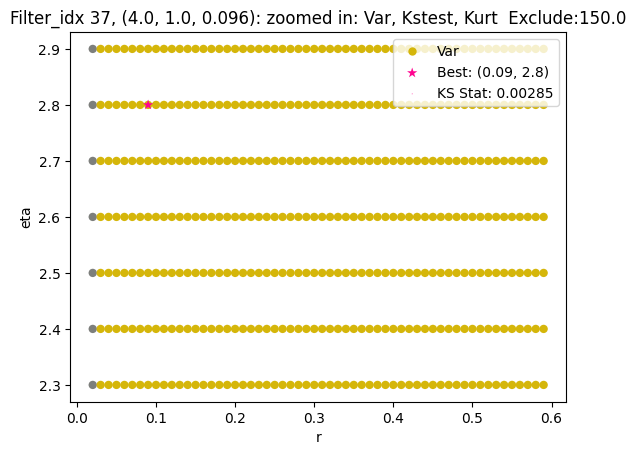

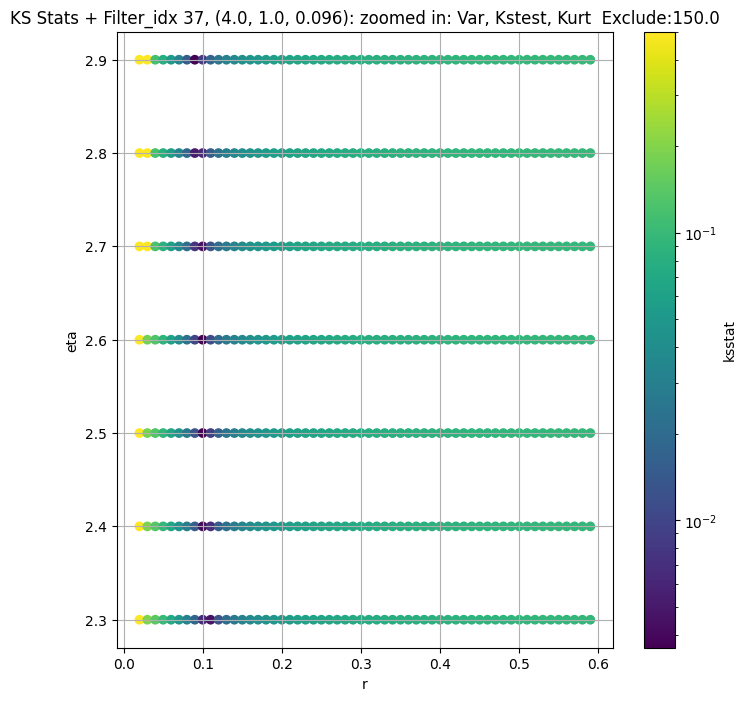

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 100 = 300, ksstat: 0.004804236192547329, var: 5.0452375411987305


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 75 = 275, ksstat: 0.004443360342447926, var: 5.169519901275635


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 50 = 250, ksstat: 0.004054841625571817, var: 5.305876731872559


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 25 = 225, ksstat: 0.0037159024114713814, var: 5.456974983215332


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + 0 = 200, ksstat: 0.003346702519369117, var: 5.626345157623291


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -25 = 175, ksstat: 0.0030241314004036957, var: 5.819082260131836


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -50 = 150, ksstat: 0.0035153321033866702, var: 6.0425920486450195


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -75 = 125, ksstat: 0.004842692496918877, var: 6.309021949768066


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 38, 200.0 + -100 = 100, ksstat: 0.00511032973589598, var: 6.642378330230713
Number of samples: 100000, Without approximation : 262144000.0


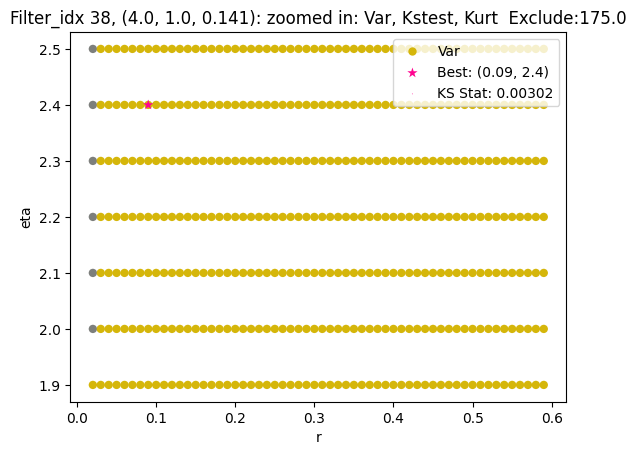

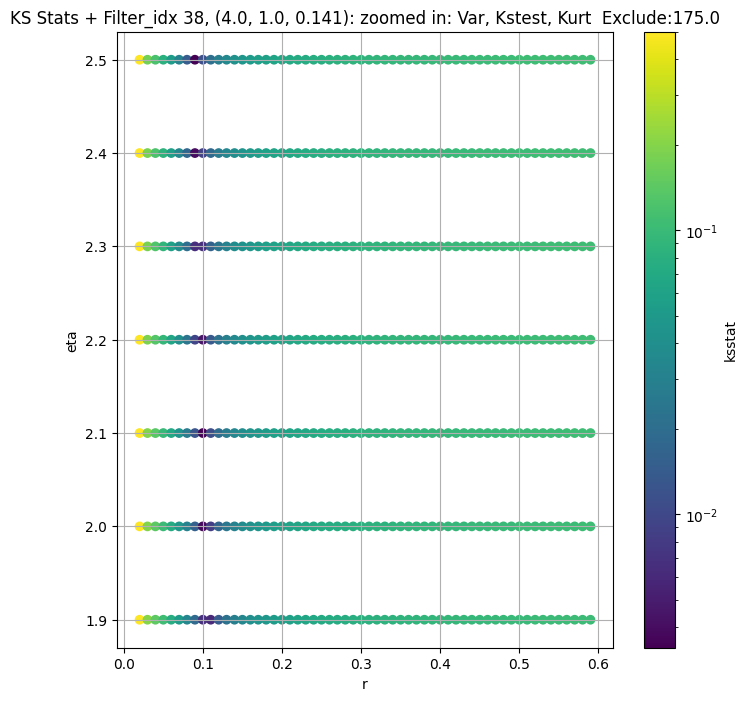

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 100 = 300, ksstat: 0.004636647252372117, var: 1.8517440557479858


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 75 = 275, ksstat: 0.004929672459749068, var: 1.9105592966079712


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 50 = 250, ksstat: 0.005428545854471473, var: 1.9769500494003296


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 25 = 225, ksstat: 0.005884293336868851, var: 2.0527756214141846


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + 0 = 200, ksstat: 0.006545173008269511, var: 2.1402668952941895


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -25 = 175, ksstat: 0.007441818083157636, var: 2.242368698120117


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -50 = 150, ksstat: 0.00800767273426839, var: 2.3629958629608154


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -75 = 125, ksstat: 0.008457386958427071, var: 2.5072145462036133


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 200.0 + -100 = 100, ksstat: 0.010401102080975708, var: 2.6828086376190186
Number of samples: 100000, Without approximation : 262144000.0


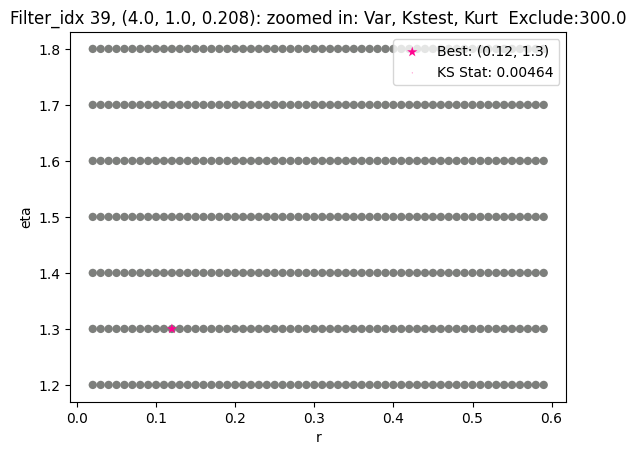

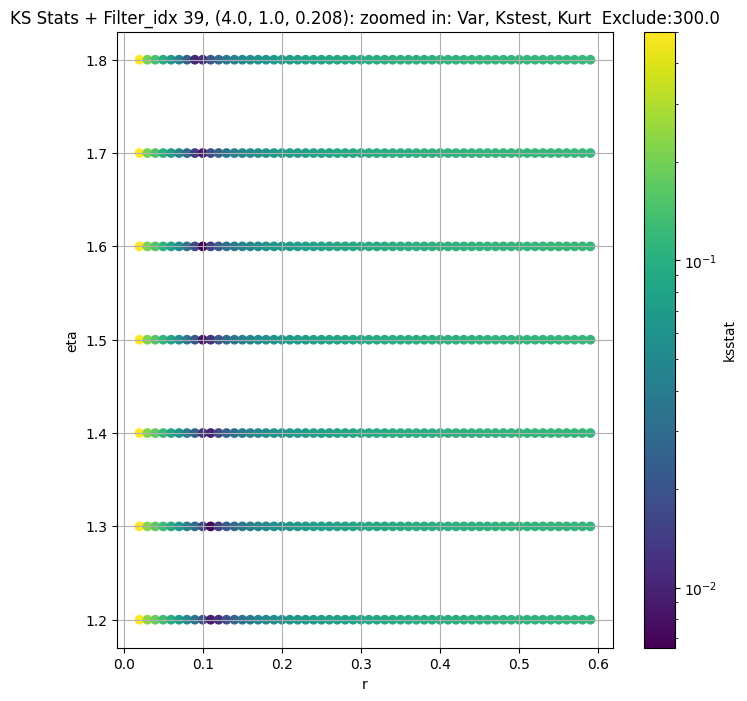

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + 100 = 300, ksstat: 0.006289931504688262, var: 0.3319060504436493


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + 75 = 275, ksstat: 0.005916330293389227, var: 0.3405115306377411


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + 50 = 250, ksstat: 0.0057114063038837815, var: 0.34997090697288513


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + 25 = 225, ksstat: 0.005649954881467301, var: 0.36048027873039246


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + 0 = 200, ksstat: 0.006177438008722169, var: 0.372310996055603


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + -25 = 175, ksstat: 0.007122987054837604, var: 0.3858647048473358


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + -50 = 150, ksstat: 0.007244092965973503, var: 0.4017418324947357


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + -75 = 125, ksstat: 0.007696906355617594, var: 0.42086857557296753


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 40, 200.0 + -100 = 100, ksstat: 0.008417134664725823, var: 0.44492626190185547
Number of samples: 100000, Without approximation : 262144000.0


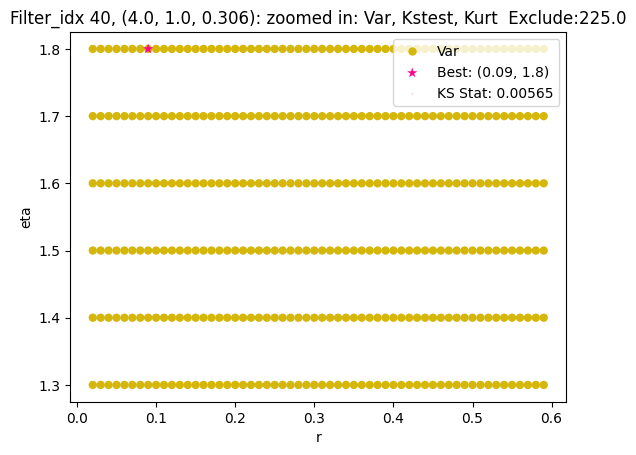

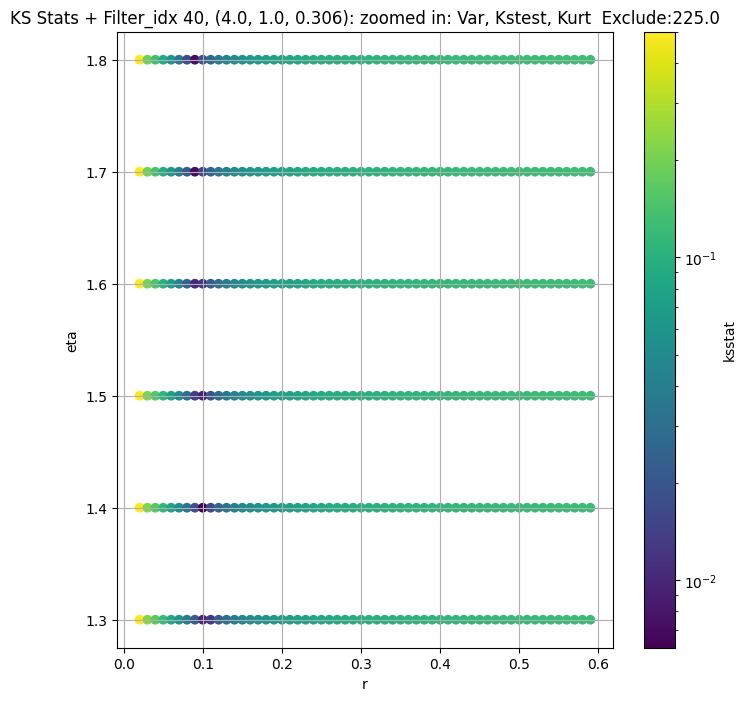

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + 100 = 300, ksstat: 0.00805639831155791, var: 0.04603666812181473


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + 75 = 275, ksstat: 0.007806643987828821, var: 0.047069527208805084


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + 50 = 250, ksstat: 0.008019714470687611, var: 0.048181284219026566


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + 25 = 225, ksstat: 0.008459736529296435, var: 0.049386441707611084


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + 0 = 200, ksstat: 0.008564829574204014, var: 0.050703998655080795


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + -25 = 175, ksstat: 0.00953747827550988, var: 0.05216050148010254


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + -50 = 150, ksstat: 0.009069853258141969, var: 0.053792472928762436


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + -75 = 125, ksstat: 0.010114725230348065, var: 0.05565466359257698


  0%|          | 0/580 [00:00<?, ?it/s]

Finding Minimum after computing 580 CDFs
filter_idx 41, 200.0 + -100 = 100, ksstat: 0.011298026392782518, var: 0.05784216523170471
Number of samples: 100000, Without approximation : 262144000.0


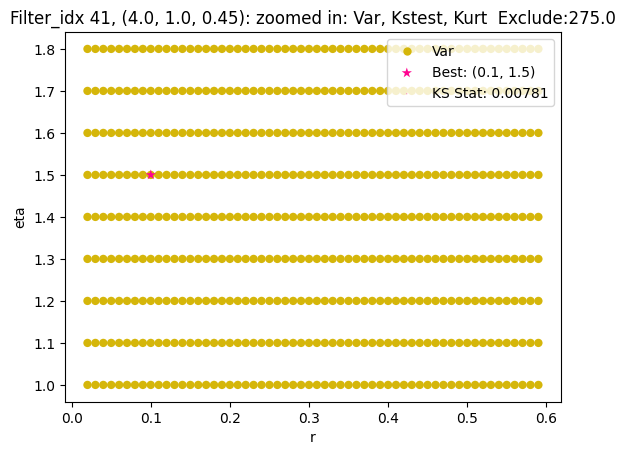

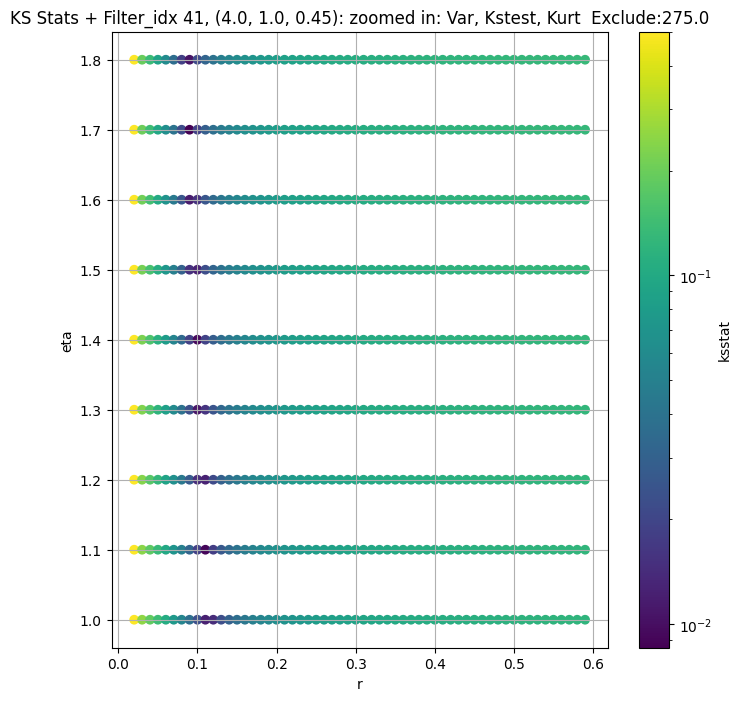

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",105.022090,27.378706,626.072630,753.90300,10.089722,772.35266,262144000.0,"(2.0, 0.5, 0.044)",0.002699,...,4.282471e-16,200.0,30.302052,0.000084,0.002699,0.10,2.9,4.282471e-16,200.0,256000
1,"(2.0, 0.5, 0.065)",38.574230,14.073940,272.467000,1018.09595,6.095307,854.14886,262144000.0,"(2.0, 0.5, 0.065)",0.001565,...,3.824396e-16,100.0,17.732866,0.000084,0.001504,0.11,2.3,6.842948e-14,100.0,864000
2,"(2.0, 0.5, 0.096)",30.087484,8.941023,174.511540,825.73830,5.479582,847.71796,262144000.0,"(2.0, 0.5, 0.096)",0.001833,...,1.907894e-16,100.0,11.645987,0.000084,0.001610,0.09,3.0,5.396208e-19,75.0,729000
3,"(2.0, 0.5, 0.141)",24.735935,4.736554,124.400840,877.88950,8.951097,788.74320,262144000.0,"(2.0, 0.5, 0.141)",0.002598,...,1.122830e-16,200.0,5.611294,0.000084,0.002101,0.09,2.9,3.263608e-19,150.0,432000
4,"(2.0, 0.5, 0.208)",7.208369,1.599787,39.273690,774.56410,9.087828,861.38160,262144000.0,"(2.0, 0.5, 0.208)",0.003753,...,4.854067e-17,200.0,1.865640,0.000084,0.003221,0.10,2.5,6.256162e-17,175.0,182250
5,"(2.0, 0.5, 0.306)",1.065362,0.331705,7.509088,1051.99790,9.293052,820.31946,262144000.0,"(2.0, 0.5, 0.306)",0.003649,...,2.656935e-17,200.0,0.405306,0.000084,0.003210,0.10,2.1,3.501097e-17,175.0,182250
6,"(2.0, 0.5, 0.45)",0.619021,0.209870,6.490139,1823.68690,10.255322,881.34436,262144000.0,"(2.0, 0.5, 0.45)",0.004580,...,4.594952e-17,200.0,0.252591,0.000084,0.004231,0.09,2.1,1.095520e-19,175.0,108000
7,"(2.0, 1.0, 0.044)",114.915660,32.235943,1166.408400,2096.19920,7.799550,917.38210,262144000.0,"(2.0, 1.0, 0.044)",0.002862,...,2.763357e-16,200.0,38.227554,0.000084,0.002172,0.10,2.9,5.402552e-16,150.0,384000
8,"(2.0, 1.0, 0.065)",62.611774,17.722000,471.684720,1030.81810,9.482702,829.54530,262144000.0,"(2.0, 1.0, 0.065)",0.002531,...,3.595228e-16,200.0,22.555330,0.000084,0.002130,0.09,3.0,1.045109e-18,150.0,410062


In [14]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

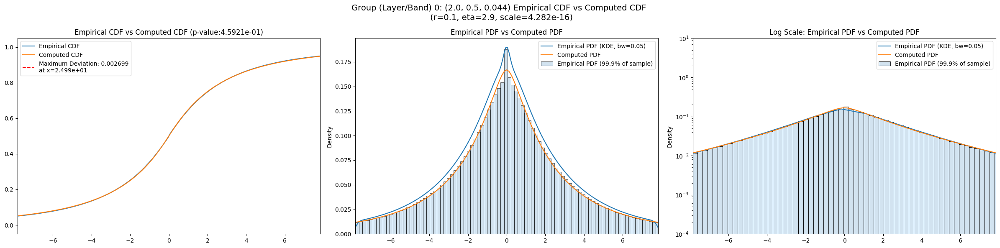

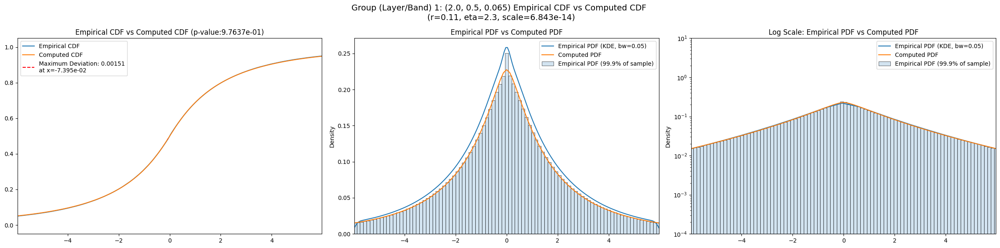

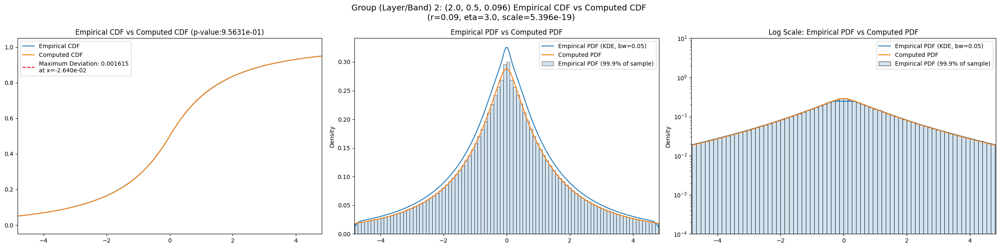

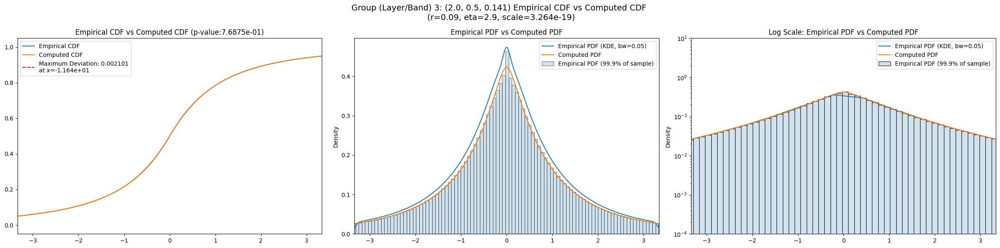

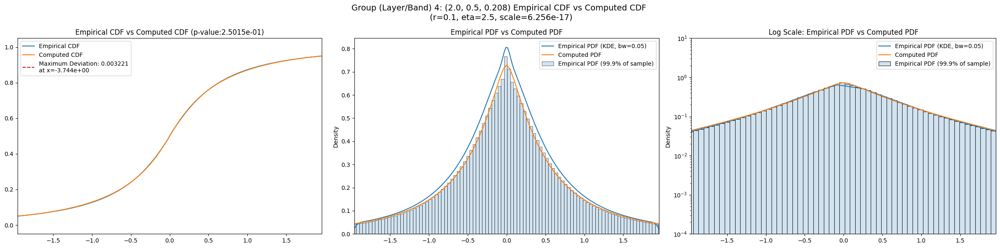

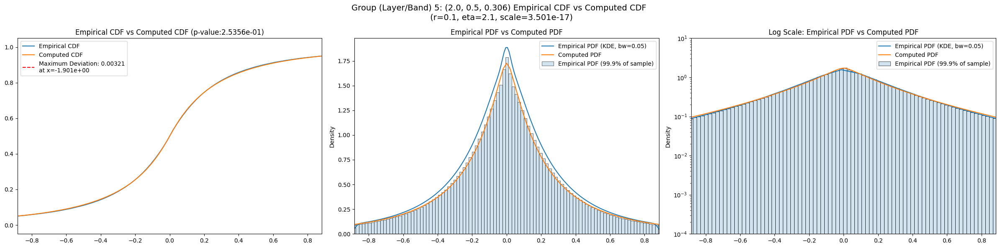

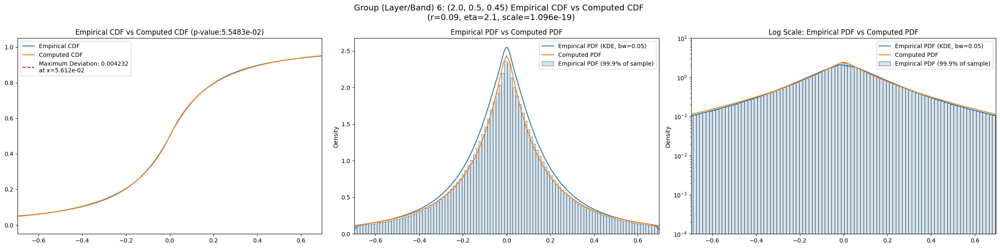

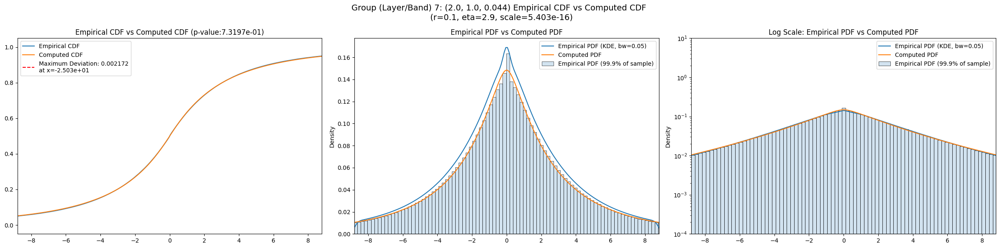

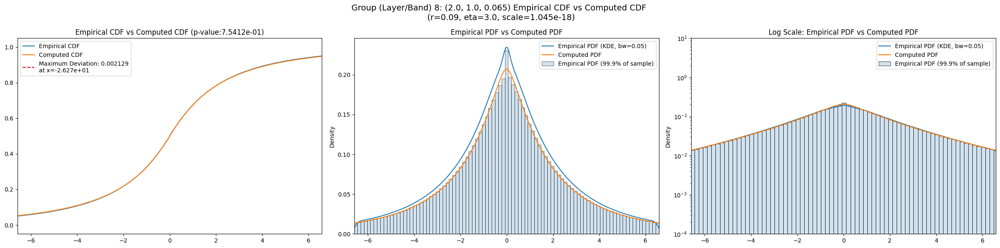

In [ ]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [ ]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [ ]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",122.512850,39.769505,721.071700,689.621150,8.335084,762.91406,262144000.0,"(2.0, 0.5, 0.044)",0.002828,...,4.253100,0.039704,0.0,3.759780,0.013594,0.0,3.001620,0.011990,0.0,0.000000e+00
1,"(2.0, 0.5, 0.065)",41.206413,19.952644,273.712800,776.613460,5.031142,803.78830,262144000.0,"(2.0, 0.5, 0.065)",0.001371,...,3.242260,0.040000,0.0,2.860060,0.013178,0.0,2.290150,0.013028,0.0,6.471197e-281
2,"(2.0, 0.5, 0.096)",31.351840,10.314682,229.798840,1246.370600,4.091756,876.93860,262144000.0,"(2.0, 0.5, 0.096)",0.001531,...,2.344050,0.040329,0.0,2.060890,0.013102,0.0,1.662980,0.013218,0.0,0.000000e+00
3,"(2.0, 0.5, 0.141)",22.116690,6.198631,92.711860,510.675540,8.659283,620.26135,262144000.0,"(2.0, 0.5, 0.141)",0.002684,...,1.606390,0.043828,0.0,1.418310,0.017200,0.0,1.130780,0.015601,0.0,0.000000e+00
4,"(2.0, 0.5, 0.208)",5.817891,1.947129,38.298820,865.975200,8.834655,852.49660,262144000.0,"(2.0, 0.5, 0.208)",0.003264,...,0.945851,0.041447,0.0,0.835462,0.015353,0.0,0.667347,0.012811,0.0,0.000000e+00
5,"(2.0, 0.5, 0.306)",0.948849,0.431888,5.817474,648.051760,7.456698,749.99900,262144000.0,"(2.0, 0.5, 0.306)",0.003789,...,0.450237,0.040287,0.0,0.397290,0.015389,0.0,0.317770,0.010418,0.0,0.000000e+00
6,"(2.0, 0.5, 0.45)",0.544168,0.224286,3.753008,738.979430,10.107155,794.04407,262144000.0,"(2.0, 0.5, 0.45)",0.003486,...,0.307329,0.041600,0.0,0.272710,0.016383,0.0,0.216253,0.012523,0.0,0.000000e+00
7,"(2.0, 1.0, 0.044)",96.786000,44.159317,881.038800,1494.333400,6.239370,873.81110,262144000.0,"(2.0, 1.0, 0.044)",0.001588,...,4.739950,0.038358,0.0,4.184750,0.012043,0.0,3.355570,0.011150,0.0,0.000000e+00
8,"(2.0, 1.0, 0.065)",51.278526,25.238693,393.370060,982.398000,6.040555,813.75590,262144000.0,"(2.0, 1.0, 0.065)",0.002019,...,3.553720,0.040599,0.0,3.136260,0.013910,0.0,2.508680,0.013328,0.0,0.000000e+00


## Results

In [ ]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [ ]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.002828,0.000084,0.002124,0.039704,0.013594,0.011990
1,0.001371,0.000084,0.001110,0.040000,0.013178,0.013028
2,0.001531,0.000084,0.001531,0.040329,0.013102,0.013218
3,0.002684,0.000084,0.002330,0.043828,0.017200,0.015601
4,0.003264,0.000084,0.002255,0.041447,0.015353,0.012811
5,0.003789,0.000084,0.003789,0.040287,0.015389,0.010418
6,0.003486,0.000084,0.003456,0.041600,0.016383,0.012523
7,0.001588,0.000084,0.001588,0.038358,0.012043,0.011150
8,0.002019,0.000084,0.001950,0.040599,0.013910,0.013328


In [ ]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,46.903862,0.002124,0.09,3.1,1.739339e-18,150.0
1,25.992033,0.001110,0.11,2.4,8.108917e-14,75.0
2,13.554227,0.001531,0.10,2.9,1.915566e-16,50.0
3,7.054037,0.002330,0.17,0.7,7.607189e-07,175.0
4,2.350580,0.002255,0.09,3.0,1.089149e-19,150.0
5,0.499081,0.003789,0.10,2.8,8.693630e-18,200.0
6,0.258707,0.003456,0.11,2.0,1.950199e-15,200.0
7,54.414635,0.001588,0.10,3.0,6.266096e-16,100.0
8,34.460594,0.001950,0.09,2.9,2.004277e-18,50.0
